# Gene sorting by KEGG functional annotations (TreeMap)
This notebook is based on the paper *OmicsMapNet: Transforming omics data to take advantage of Deep Convolutional Neural Network for discovery*, whose authors are *Shiyong Ma, Zhen Zhang* (https://arxiv.org/ftp/arxiv/papers/1804/1804.05283.pdf)
- Paper summary: 
Their aim was to rearrange high-dimensional omics data as 2-dimensional images, and train a Keras-CNN with them. For that, they used KEGG database which provides functional anotation of genes. Specifically, KEGG BRITE captures 'the functional hierarchies of biological objects'. And based on this hierarchy, each omic vector was shaped as an image using a treemap.

In [3]:
#libraries
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import squarify 

###  KEGG and TCGA data loading

- Data coming from KEGG database is fetched on 'KEGG_Data_obtaining.ipynb' notebook
- Data coming from TCGA database is fetched on 'TCGA_Data_obtaining.ipynb' notebook

In [4]:
# KEGG
hsa = pd.read_csv('../data/KEGG/KEGG_gene_hsa.csv', sep='\t'  , engine='python', header=None, index_col=0)
hsa_brite = pd.read_csv('../data/KEGG/KEGG_hsa_brite.csv', sep='\t'  , engine='python', header=None)
hsa_brite.columns = ['keggBriteId', 'keggId']
brite = pd.read_csv('../data/KEGG/KEGG_brite.csv', engine='python', header=0, index_col=0)

# TCGA

# pp_df_gene_exp = pd.read_hdf("data/preprocessed1_expr.h5", key='expression') # only selected features
# df_gene_exp = pd.read_hdf("data/TCGA_data.h5", key='both_gene_expression') # all

brca_ex = pd.read_hdf("/mnt/ext/almacen/comun/Francis/almacen/DeepLearning-Bioinformatics/data/PanCancer/mad_filter_pancan_all_TCGA_20.h5", key = "brca")
non_brca_ex = pd.read_hdf("/mnt/ext/almacen/comun/Francis/almacen/DeepLearning-Bioinformatics/data/PanCancer/mad_filter_pancan_all_TCGA_20.h5", key = "non_brca")

In [5]:
hsa_brite['keggBriteId'] = [br_id[7:] for br_id in hsa_brite['keggBriteId']]

In [6]:
brite_homosap_index = list(set(brite['keggBriteId']).intersection(set(hsa_brite['keggBriteId'])))

In [7]:
brite = brite.loc[brite['keggBriteId'].isin(brite_homosap_index)]

In [8]:
ens_genes = brca_ex.columns

In [9]:
print("Initial number of genes: {}".format(len(ens_genes)))

Initial number of genes: 20000


In [10]:
print("Total number of samples (patients): {}".format(brca_ex.shape[0]+non_brca_ex.shape[0]))

Total number of samples (patients): 10535


## MAPPING: From Ensembl Gene ID to KEGG BRITE functional annotation
KEGG relates Hugo-gene-names to an internal id (KEGG id) that is useful to find out the corresponding KEGG BRITE value/s (hierarchical functional annotations) of each gene.
Due to genes in TCGA are indexed by Ensembl-ids, it is needed mapping Ensembl-id to Hugo-gene-name

All the code below (mappings) can be ignored until next section just loading 'gene_mapping' DataFrame, which contains mapping from Ensembl id to KEGG Brite

In [11]:
# Loading 'gene_mapping' DataFrame
gene_mapping = pd.read_hdf('../data/KEGG/map_ens_kegg_brite.h5', key='map')

### Mapping: Ensembl Gene ID to  Hugo Gene Name
Down below, it is downloaded a table relating ensembl-ids and hugo-gene-names from this URL: https://raw.githubusercontent.com/jvivian/docker_tools/master/gencode_hugo_mapping/attrs.tsv

In [12]:
%%time

url = 'https://raw.githubusercontent.com/jvivian/docker_tools/master/gencode_hugo_mapping/attrs.tsv'
hugo_request = requests.get(url, allow_redirects=True)
open('../data/hugo_ensembl.tsv', 'wb').write(hugo_request.content)
del hugo_request

CPU times: user 124 ms, sys: 102 ms, total: 226 ms
Wall time: 3.01 s


In [13]:
hugo_ens = pd.read_csv('../data/hugo_ensembl.tsv', sep='\t', engine='python', index_col=0)

In [14]:
hugo_ens = hugo_ens[~hugo_ens.index.duplicated()]

common_genes = hugo_ens.index.intersection(ens_genes)
hugo_ens = hugo_ens.loc[common_genes, :]

len(common_genes)

20000

In [ ]:
hugo_ens

In [15]:
gene_mapping = pd.DataFrame(hugo_ens.loc[:,'geneName'])

In [16]:
gene_mapping['ensId'] = gene_mapping.index

In [17]:
gene_mapping['geneName']

ENSG00000227232.5            WASH7P
ENSG00000238009.6      RP11-34P13.7
ENSG00000239945.1      RP11-34P13.8
ENSG00000233750.3            CICP27
ENSG00000268903.1     RP11-34P13.15
ENSG00000269981.1     RP11-34P13.16
ENSG00000241860.6     RP11-34P13.13
ENSG00000228463.8        AP006222.2
ENSG00000241670.3         RPL23AP21
ENSG00000236679.2         RPL23AP24
ENSG00000237094.11    RP4-669L17.10
ENSG00000250575.1      RP4-669L17.8
ENSG00000231709.1      RP5-857K21.1
ENSG00000230021.7      RP5-857K21.4
ENSG00000225972.1          MTND1P23
ENSG00000225630.1          MTND2P28
ENSG00000237973.1      RP5-857K21.6
ENSG00000229344.1      RP5-857K21.7
ENSG00000240409.1          MTATP8P1
ENSG00000248527.1          MTATP6P1
ENSG00000198744.5     RP5-857K21.11
ENSG00000229376.3             CICP3
ENSG00000224956.5     RP11-206L10.1
ENSG00000235373.1     RP11-206L10.3
ENSG00000240618.1     RP11-206L10.5
ENSG00000228327.2     RP11-206L10.2
ENSG00000237491.8     RP11-206L10.9
ENSG00000230092.7     RP11-2

### Mapping: Hugo Gene Name to KEGG gene id

In [18]:
hsa_hugo_dict = dict()
for i in range(0, len(hsa)):
    value = hsa.loc[hsa.index[i],1].split(";")[0].split(',')
    if 'uncharacterized' not in value[0] and len(value[0])<20:
        hsa_hugo_dict[hsa.index[i]] = value

In [ ]:
len(hsa_hugo_dict)

In [19]:
%%time
hsa_hugo = pd.DataFrame(columns=['keggId','geneName'])
i = 0
for key, values in hsa_hugo_dict.items():
    for ens in values:
        hsa_hugo.loc[i] = [key, ens]
        i+=1

CPU times: user 3min 38s, sys: 58.6 ms, total: 3min 38s
Wall time: 3min 38s


In [ ]:
hsa_hugo.shape

In [20]:
gene_mapping = pd.merge(gene_mapping, hsa_hugo, on='geneName')

### Mapping: KEGG gene id to KEGG BRITE id

In [ ]:
gene_mapping

In [21]:
len(set(hsa_brite['keggId'].value_counts().index).intersection(gene_mapping['keggId']))

7287

In [22]:
gene_mapping = pd.merge(gene_mapping, hsa_brite, on='keggId')

In [ ]:
gene_mapping

### Mapping: KEGG BRITE id to KEGG BRITE functional annotation

In [23]:
gene_mapping = pd.merge(gene_mapping, brite, on='keggBriteId')

In [ ]:
brite

In [ ]:
gene_mapping

## Mapping: KEGG BRITE functional annotation to KEGG BRITE group of functional annotations

### Mapping: exporting gene_mapping DataFrame

In [24]:
with pd.HDFStore('../data/KEGG/map_ens_kegg_brite.h5') as store:
    store['map'] = gene_mapping

# KEGG-TREEMAPs generation

From genetic expression profiles data, along with the information obtained from KEGG database, treemap images are generated. This is done by using 'treemap' R package.

A treemap is a rectangular displaying for hierarchical data visualization. 

In our case, all genes are represented as squares of size 1 and colored according to their expresion level. Genes are grouped and placed in the treemap according to each functional annotation subgroup (ie. 'RNA family' or 'Orthologs and modules') and functional annotation (ie. 'Translation factors' or 'Non-coding RNAs'). Inside of each hierarchy, genes are sorted by their mean for all samples.

In [25]:
exp_to_tree_map = pd.concat([non_brca_ex, brca_ex]).T
exp_to_tree_map['ensId'] = exp_to_tree_map.index
exp_to_tree_map['tamPixel'] = np.ones(exp_to_tree_map.shape[0])
exp_to_tree_map['order'] = pd.concat([non_brca_ex, brca_ex]).mean() # order genes in the map by mean expression level
exp_to_tree_map = pd.merge(gene_mapping, exp_to_tree_map, on='ensId')

In [26]:
%%time
exp_to_tree_map.to_csv('exp_to_KEGG_tree_map.csv')

KeyboardInterrupt: 

In [29]:
exp_to_tree_map.shape

(16979, 10544)

In [30]:
with open('genes_remaining.txt', 'w') as f:
    f.write(str(set(exp_to_tree_map.ensId)))

In [32]:
len(set(exp_to_tree_map.ensId))

7299

http://rpy.sourceforge.net/rpy2/doc-2.4/html/interactive.html

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R

source('Gene_KEGG_treemap_generator.R')

# Convolutional neural network for predicting cancer survival

In this notebook, a CNN is trained for cancer survival prediction with the following structure:

- input: gene expression profiles shape an image (as a matrix) per patient, whose pixels (gene expression levels) are neigbours depending on their KEGG-BRITE functional annotation. These are the previously generated treemap-images.

- output: the correspondant Kaplan-Meier curve (as a vector) per patient, in that way it would be predicted survival for a discrete range of time.


## Input: KEGG-TREEMAPs

Previously generated treemap images are going to be used as input of a convolutional neural network, in order to 

### KEGG-TREEMAPs data loading

In [2]:
%%time

# DL with Python - François Chollet (pp. 162-163)
from PIL import Image
from keras.preprocessing import image
import glob

path = 'data/KEGG/KEGG_TREEMAPS/'
filelist = glob.glob(path + '*.png')
brca_images = dict()
non_brca_images = dict()
w, h = (480, 480)
basewidth = 100
wpercent = (basewidth/float(w))
hsize = int((float(h)*float(wpercent)))
for filename in filelist:
    sample = filename.split(" ")[1]
    if('NON' in sample):
        non_brca_images[sample.split("_")[0].replace('.','-')] = image.load_img(filename).crop((11, 11, w-13, h-13)).resize((basewidth,hsize), Image.ANTIALIAS)
    else:
        brca_images[sample.split("_")[0].replace('.','-')] = image.load_img(filename).crop((11, 11, w-13, h-13)).resize((basewidth,hsize), Image.ANTIALIAS)

Using TensorFlow backend.


CPU times: user 29.2 s, sys: 666 ms, total: 29.9 s
Wall time: 41.7 s


In [ ]:
image.img_to_array(non_brca_images[list(non_brca_images.keys())[9]]).shape

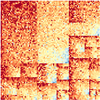

In [3]:
non_brca_images[list(non_brca_images.keys())[1191]]

## Output: Discrete time survival vector

### Overal Survival (OS) data loading and cleaning

In [4]:
brca_clinical = pd.read_hdf('data/TCGA_data.h5', key='brca_clinical')
non_brca_clinical = pd.read_hdf('data/TCGA_data.h5', key='non_brca_clinical')

BRCA:

In [ ]:
print("Number of brca-samples with clinical information: {}".format(len(brca_clinical.index)))

In [ ]:
brca_clinical['OS'].value_counts()

In [ ]:
brca_clinical['OS.time'].value_counts()

NON-BRCA:

In [ ]:
print("Number of non_brca-samples with clinical information: {}".format(len(non_brca_clinical.index)))

In [ ]:
non_brca_clinical['OS'].value_counts()

In [ ]:
non_brca_clinical['OS.time'].value_counts()

Both brca and non_brca clinical data have NaN values in OS-columns. Also, there are samples that are not in both clinical and image datasets. Because of these problems, it is necessary to drop some samples we do not have all required information of.

In [5]:
# Deleting samples with 'NaN's in OS-columns 

## non_brca
non_brca_clinical['OS.time'] = non_brca_clinical['OS.time'].map(lambda x: np.nan if x == 'NaN' else x)
non_brca_clinical['OS'] = non_brca_clinical['OS'].map(lambda x: np.nan if x == 'NaN' else x)
non_brca_clinical.dropna(subset=['OS.time', 'OS'], inplace=True)
non_brca_clinical['OS.time'] = non_brca_clinical['OS.time'].astype(float)
non_brca_clinical['OS'] = non_brca_clinical['OS'].astype(float)

## brca
brca_clinical['OS.time'] = brca_clinical['OS.time'].map(lambda x: np.nan if x == 'NaN' else x)
brca_clinical['OS'] = brca_clinical['OS'].map(lambda x: np.nan if x == 'NaN' else x)
brca_clinical.dropna(subset=['OS.time', 'OS'], inplace=True)
brca_clinical['OS.time'] = brca_clinical['OS.time'].astype(float)
brca_clinical['OS'] = brca_clinical['OS'].astype(float)

In [6]:
common_brca = set(list(brca_images.keys())).intersection(brca_clinical.index)
for sample in list(brca_images.keys()):
    if(sample not in common_brca): del brca_images[sample] 
brca_clinical = brca_clinical.loc[common_brca]

common_non_brca = set(list(non_brca_images.keys())).intersection(non_brca_clinical.index)
for sample in list(non_brca_images.keys()):
    if(sample not in common_non_brca): del non_brca_images[sample] 
non_brca_clinical = non_brca_clinical.loc[common_non_brca]

In [ ]:
print("Number of brca samples after cleaning: {}".format(len(list(brca_images.keys()))))

In [ ]:
print("Number of brca samples after cleaning: {}".format(len(list(brca_images.keys()))))

In [ ]:
print("Number of non_brca samples after cleaning: {}".format(len(list(non_brca_images.keys()))))

In [ ]:
print("Number of non_brca samples after cleaning: {}".format(len(list(non_brca_images.keys()))))

### From OS to 

In [7]:
# Create 39 equally spaced intervals for follow-up time, from 0 to 5 years:
breaks = np.arange(0.,365.*5,365./8)
n_intervals = len(breaks)-1
timegap = breaks[1:] - breaks[:-1]

In [8]:
import nnet_survival

In [9]:

non_brca_y = nnet_survival.make_surv_array(non_brca_clinical['OS.time'],
                             non_brca_clinical['OS'],
                             breaks)
brca_y = nnet_survival.make_surv_array(brca_clinical['OS.time'],
                             brca_clinical['OS'],
                             breaks)

In [ ]:
non_brca_y.shape

### From PIL.Image to Numpy

In [10]:
%%time

import numpy as np
samples = list(non_brca_clinical.index)
X_non_brca = np.empty((len(samples), 100, 100, 3))

for i in range(0, len(samples)):
    X_non_brca[i] = image.img_to_array(non_brca_images[samples[i]])

CPU times: user 404 ms, sys: 375 ms, total: 779 ms
Wall time: 778 ms


In [11]:
%%time

import numpy as np
samples = list(brca_clinical.index)
X_brca = np.empty((len(samples), 100, 100, 3))

for i in range(0, len(samples)):
    X_brca[i] = image.img_to_array(brca_images[samples[i]])

CPU times: user 64.8 ms, sys: 40.3 ms, total: 105 ms
Wall time: 104 ms


In [ ]:
X_non_brca.shape

In [10]:
del non_brca_images
del brca_images

## NON-BRCA training

In [ ]:
X_non_brca.shape

In [ ]:
non_brca_y.shape

In [12]:
%%time
# Split dataset into train and test
from sklearn.model_selection import train_test_split

X_non_brca_train, X_non_brca_test, y_non_brca_train, y_non_brca_test, train_index, test_index = train_test_split(X_non_brca, non_brca_y, np.arange(len(X_non_brca)), test_size=0.2, random_state=42)
X_non_brca_train, X_non_brca_val, y_non_brca_train, y_non_brca_val, train_index, val_index = train_test_split(X_non_brca_train, y_non_brca_train, train_index, test_size=0.2, random_state=44)

CPU times: user 738 ms, sys: 736 ms, total: 1.47 s
Wall time: 2.04 s


In [13]:
y_non_brca_train = np.array(y_non_brca_train, dtype=int)
y_non_brca_test = np.array(y_non_brca_test, dtype=int)
y_non_brca_val = np.array(y_non_brca_val, dtype=int)

In [13]:
del X_non_brca

In [ ]:
X_non_brca_train.shape

In [ ]:
X_non_brca_test.shape

In [ ]:
X_non_brca_val.shape

In [ ]:
y_non_brca_test.shape

In [ ]:
y_non_brca_train.shape

In [ ]:
y_non_brca_test.shape

In [ ]:
y_non_brca_val.shape

In [ ]:
print("Dataset size:", X_non_brca_train.shape, X_non_brca_test.shape, X_non_brca_val.shape)

Multilayer CONVNET architecture:

In [14]:
import keras.backend as K
from keras.models import Sequential
from keras.layers import Input, Dense, Conv2D, MaxPool2D, Activation, Dropout, Flatten
from keras import regularizers, optimizers
from keras.layers.normalization import BatchNormalization
from keras.callbacks import EarlyStopping
import warnings
from keras.regularizers import l1
from keras.optimizers import Adam
import tensorflow as tf

In [ ]:
model.summary()

In [ ]:
optimizer = Adam(lr=0.001)

model.compile(loss=nnet_survival.surv_likelihood(n_intervals), optimizer=optimizer)

In [15]:
# Using C-index as evaluation metric (using a custom callback)

from lifelines.utils import concordance_index
from keras.callbacks import Callback

class CIndex(Callback):
    """
    Callback that computes the C-index metric both on training and test data after each epoch.
    
    Arguments:
        train_x: Numpy array containing the training dataset.
        train_time: Numpy array with survival time for training dataset.
        train_event: Numpy array with survival event for training dataset.
        val_x: Numpy array containing the test dataset.
        val_time: Numpy array with survival time for test dataset.
        val_event: Numpy array with survival event for test dataset.
        filepath: path to save the model.
        years: number of years to compute c-index
        patience: patience for early-stop training
    """
    
    def __init__(self, train_x, train_time, train_event, val_x, val_time, val_event, filepath, years=2, patience=5):
        super(Callback, self).__init__()
        self.X_tr = train_x
        self.time_tr = train_time
        self.event_tr = train_event
        self.X_val = val_x
        self.time_val = val_time
        self.event_val = val_event
        self.years = years
        self.patience = patience
        self.best = 0.0
        self.wait = 0  #counter for patience
        self.best_rounds = 1
        self.counter = 0
        self.filepath = filepath
        
    def on_train_begin(self, logs={}):
        self.c_index_dict = {'c-index': [], 'val_c-index': []}

    def on_epoch_end(self, epoch, logs={}):
        self.counter +=1

        y_tr=self.model.predict_proba(self.X_tr,verbose=0)
        yr_surv=np.cumprod(y_tr[:,0:np.nonzero(breaks>365*self.years)[0][0]], axis=1)[:,-1]
        c_index_tr = concordance_index(self.time_tr, yr_surv, self.event_tr)
        y_val=self.model.predict_proba(self.X_val,verbose=0)
        yr_surv_val=np.cumprod(y_val[:,0:np.nonzero(breaks>365*self.years)[0][0]], axis=1)[:,-1]
        c_index_val = concordance_index(self.time_val, yr_surv_val, self.event_val)

        print('\tc-index: %s - val_c-index: %s' % (str(round(c_index_tr, 4)), str(round(c_index_val, 4))))
        
        if (c_index_val > self.best):
            self.c_index_dict['c-index'].append(c_index_tr)
            self.c_index_dict['val_c-index'].append(c_index_val)

            self.best = c_index_val
            self.best_rounds = self.counter
            self.wait = 0
            self.model.save_weights(self.filepath, overwrite=True)
        else:
            if self.wait >= self.patience: #no more patience, retrieve best model
                self.model.stop_training = True
                print('Best number of rounds: %d \nValidation C-Index: %f \n' % (self.best_rounds, self.best))
                self.model.load_weights(self.filepath)
            self.wait += 1

In [ ]:
%time

hist_c_index = CIndex(X_non_brca_train,
                    non_brca_clinical.iloc[train_index]['OS.time'],
                    non_brca_clinical.iloc[train_index]['OS'],
                    X_non_brca_val,
                    non_brca_clinical.iloc[val_index]['OS.time'],
                    non_brca_clinical.iloc[val_index]['OS'],
                    filepath = 'keras-models/best.h5')

#callbacks = [EarlyStopping(monitor='loss', min_delta=0.01, patience=2, verbose=2, mode="min")]
callbacks = [hist_c_index]


batch = 128
n_epoch = 50

history = model.fit(X_non_brca_train, 
                    y_non_brca_train, 
                    batch_size=batch, 
                    epochs=n_epoch, 
                    callbacks=callbacks, 
                    validation_data = [X_non_brca_val, y_non_brca_val])

In [ ]:
import plotly as py
import plotly.graph_objs as go

py.offline.init_notebook_mode()

In [ ]:
# Loss plot using linear regression

hist_object = history

x_axis = np.linspace(1, len(hist_object.history['loss']), num=len(hist_object.history['loss']))

# Create traces
trace0 = go.Scatter(
    x = x_axis,
    y = hist_object.history['loss'],
    mode = 'lines',
    name = 'train standard scaled'
)

trace1 = go.Scatter(
    x = x_axis,
    y = hist_object.history['val_loss'],
    mode = 'lines',
    name = 'val standard scaled'
)

data = [trace0, trace1]

# Edit the layout
layout = dict(xaxis = dict(title = 'Epoch'), 
              yaxis = dict(title = 'Loss'),
              title = "Fully-connected model with num epochs=" + str(n_epoch) + ", batch size=" + str(batch))

fig = dict(data=data, layout=layout)

py.offline.iplot(fig)

In [ ]:
# C-Index plot

x_axis = np.linspace(1, len(hist_c_index.c_index_dict['c-index']), num=len(hist_c_index.c_index_dict['c-index']))

trace0 = go.Scatter(
    x = x_axis,
    y = hist_c_index.c_index_dict['c-index'],
    line = dict(color = 'red'),
    name = 'train'
)
trace1 = go.Scatter(
    y = hist_c_index.c_index_dict['val_c-index'],
    line = dict(color = 'darkblue'),
    name = 'test'
)

data = [trace0, trace1]

layout = dict(xaxis = dict(title = 'Epoch'),
              yaxis = dict(title = 'C-Index'),
              title = "Model C-Index")

fig = dict(data=data, layout=layout)

py.offline.iplot(fig)

In [ ]:
y_pred=model.predict_proba(X_non_brca_train,verbose=0)

In [ ]:
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter
from lifelines.utils import concordance_index

In [ ]:
days_plot = 365*5

kmf = KaplanMeierFitter()
kmf.fit(non_brca_clinical.iloc[train_index]['OS.time'], non_brca_clinical.iloc[train_index]['OS']) 
pred_surv = np.mean(np.cumprod(y_pred, axis=1),axis=0)
plt.plot(breaks,np.concatenate(([1],pred_surv)),'bo-')
plt.plot(kmf.survival_function_.index.values, kmf.survival_function_.KM_estimate,color='k')

plt.xticks(np.arange(0, days_plot+0.0001, 200))
plt.yticks(np.arange(0, 1.0001, 0.125))
plt.xlim([0,days_plot])
plt.ylim([0,1])
plt.xlabel('Follow-up time (days)')
plt.ylabel('Proportion surviving')
plt.title('Actual=black, predicted=blue.')
plt.show()

In [ ]:
# Concordance C-index (two year survival)

twoyr_surv=np.cumprod(y_pred[:,0:np.nonzero(breaks>365*2)[0][0]], axis=1)[:,-1]
print("C-index for two-year survival:", concordance_index(non_brca_clinical.iloc[train_index]['OS.time'],twoyr_surv, non_brca_clinical.iloc[train_index]['OS']))

In [ ]:
# Concordance C-index (two year survival) for test dataset
y_pred_test=model.predict_proba(X_non_brca_test,verbose=0)
twoyr_surv_test=np.cumprod(y_pred_test[:,0:np.nonzero(breaks>365*2)[0][0]], axis=1)[:,-1]
print("C-index for two-year survival (test):", concordance_index(non_brca_clinical.iloc[test_index]['OS.time'],twoyr_surv_test, non_brca_clinical.iloc[test_index]['OS']))

## Bayesian optimization

### NON_BRCA dataset:

In [17]:
from hyperopt import hp, fmin, tpe, hp, STATUS_OK, Trials

Define the dictionary of hyper-parameter values to be tested:

In [18]:
space = {
    'conv_choice': hp.choice('conv_num_layers', 
                            [{'layers': 'two',
                             'units_2conv2': hp.choice('units_2conv2', [16, 32, 64, 128]),
                              '2kernel2': hp.choice('2kernel2', [3,5]),
                              '2pool2': 2,
                             'dropout_2conv2': hp.choice('dropout_2conv2', [0.25, 0.5, 0.75])
                            },
                            {'layers': 'three',
                             'units_3conv2': hp.choice('units_3conv2', [16, 32, 64, 128]),
                             '3kernel2': hp.choice('3kernel2', [3,5]),
                             '3pool2': 2,
                             'dropout_3conv2': hp.choice('dropout_3conv2', [0.25, 0.5, 0.75]),
                             'units_3conv3': hp.choice('units_3conv3', [16, 32, 64, 128]),
                             '3kernel3': hp.choice('kernel3', [3,5]),
                             '3pool3': 2,
                             'dropout_3conv3': hp.choice('dropout_3conv3', [0.25, 0.5, 0.75])
                            }]
                            ),
    'dense_choice': hp.choice('dense_num_layers', 
                            [{'layers': 'two',
                             'units_2dense2': hp.choice('units_2dense2', [16, 32, 64, 128]),
                             'dropout_2dense2': hp.choice('dropout_2dense2', [0.25, 0.5, 0.75])
                            },
                            {'layers': 'three',
                             'units_3dense2': hp.choice('units_3dense2', [16, 32, 64, 128]),
                             'dropout_3dense2': hp.choice('dropout_3dense2', [0.25, 0.5, 0.75]),
                             'units_3dense3': hp.choice('units_3dense3', [16, 32, 64, 128]),
                             'dropout_3dense3': hp.choice('dropout_3dense3', [0.25, 0.5, 0.75])
                            }]
                            ),
    'units_conv1': hp.choice('units_conv1', [16, 32, 64, 128]),
    'kernel1': hp.choice('kernel1', [3,5]),
    'pool1': 2,
    'dropout_conv1': hp.choice('dropout_conv1', [0.25, 0.5, 0.75]),
    'units_dense1': hp.choice('units_dense1', [16, 32, 64, 128]),
    'dropout_dense1': hp.choice('dropout_dense1', [0.25, 0.5, 0.75]),
    'batch_size' : hp.choice('batch_size', [16, 32, 64, 128]),
    'nb_epochs' : 100,
    'lr': hp.loguniform('lr', np.log(0.0001), np.log(0.01)),
    'activation': 'relu'                                            
}

In [32]:
def train(params):
    print('Params testing: ', params)
    print('\n')

    # Prevent GPU memory allocation problems
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    config.gpu_options.per_process_gpu_memory_fraction = 0.4
    K.set_session(tf.Session(config=config))

    ## CREATE MODEL
    model = Sequential()

    # Conv layer 1 ---
    model.add(Conv2D(filters=params['units_conv1'], 
                     kernel_size=(params['kernel1'], params['kernel1']),
                     input_shape = (X_non_brca_train.shape[1],
                                    X_non_brca_train.shape[2],
                                    X_non_brca_train.shape[3])))
    model.add(BatchNormalization())
    model.add(Activation(params['activation']))
    model.add(MaxPool2D(pool_size=(params['pool1'],params['pool1'])))
    model.add(Dropout(params['dropout_conv1']))

    if params['conv_choice']['layers'] == 'two':
        # Conv layer 2 ---
        model.add(Conv2D(filters=params['conv_choice']['units_2conv2'], 
                     kernel_size=(params['conv_choice']['2kernel2'], params['conv_choice']['2kernel2'])))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(MaxPool2D(pool_size=(params['conv_choice']['2pool2'], params['conv_choice']['2pool2'])))
        model.add(Dropout(params['conv_choice']['dropout_2conv2']))
    elif params['conv_choice']['layers'] == 'three':
        # Conv layer 2 ---
        model.add(Conv2D(filters=params['conv_choice']['units_3conv2'], 
                     kernel_size=(params['conv_choice']['3kernel2'], params['conv_choice']['3kernel2'])))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(MaxPool2D(pool_size=(params['conv_choice']['3pool2'], params['conv_choice']['3pool2'])))
        model.add(Dropout(params['conv_choice']['dropout_3conv2']))
        # Conv layer 3 ---
        model.add(Conv2D(filters=params['conv_choice']['units_3conv3'], 
                     kernel_size=(params['conv_choice']['3kernel3'], params['conv_choice']['3kernel3'])))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(MaxPool2D(pool_size=(params['conv_choice']['3pool3'], params['conv_choice']['3pool3'])))
        model.add(Dropout(params['conv_choice']['dropout_3conv3']))

    # Flatten layer ---
    model.add(Flatten())
    
    # Dense layer 1 ---
    model.add(Dense(params['units_dense1']))
    model.add(BatchNormalization())
    model.add(Activation(params['activation']))
    model.add(Dropout(params['dropout_dense1']))

    if params['dense_choice']['layers']== 'two':
        # Dense layer 2 ---
        model.add(Dense(params['dense_choice']['units_2dense2']))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(Dropout(params['dense_choice']['dropout_2dense2']))
    elif params['dense_choice']['layers']== 'three':
        # Dense layer 2 ---
        model.add(Dense(params['dense_choice']['units_3dense2']))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(Dropout(params['dense_choice']['dropout_3dense2']))
        # Dense layer 3 ---
        model.add(Dense(params['dense_choice']['units_3dense3']))
        model.add(BatchNormalization())
        model.add(Activation(params['activation']))
        model.add(Dropout(params['dense_choice']['dropout_3dense3']))
        
    # Output layer ---
    model.add(Dense(n_intervals, activation='sigmoid'))

    optimizer = Adam(lr=params['lr'])

    model.compile(loss=nnet_survival.surv_likelihood(n_intervals), optimizer=optimizer)
    
    model.summary()
    
    batch = params['batch_size']
    n_epoch = params['nb_epochs']

    hist_c_index = CIndex(X_non_brca_train,
                    non_brca_clinical.iloc[train_index]['OS.time'],
                    non_brca_clinical.iloc[train_index]['OS'],
                    X_non_brca_val,
                    non_brca_clinical.iloc[val_index]['OS.time'],
                    non_brca_clinical.iloc[val_index]['OS'],
                    filepath = 'keras-models/best.h5')

    callbacks = [hist_c_index]    
    
    ## Fit model using training data
    start = timer()
    model.fit(X_non_brca_train, 
              y_non_brca_train, 
              batch_size=batch, 
              epochs=n_epoch, 
              validation_data = [X_non_brca_val, y_non_brca_val],
              callbacks=callbacks)
    run_time = timer() - start
    
    predictions = model.predict_proba(X_non_brca_test,verbose=0)
    twoyr_surv=np.cumprod(predictions[:,0:np.nonzero(breaks>365*2)[0][0]], axis=1)[:,-1]
    score = concordance_index(non_brca_clinical.iloc[test_index]['OS.time'], twoyr_surv, non_brca_clinical.iloc[test_index]['OS'])

    # Return loss
    return {'loss': score*(-1),
            'params': params,
            'train_time': run_time,
            'status': STATUS_OK, 
            'rounds':hist_c_index.best_rounds}

In [21]:
from timeit import default_timer as timer
from multiprocessing import Pool
from hyperopt import STATUS_OK

def objective(params):
    from sklearn.metrics import roc_auc_score
    
    from keras.models import Sequential
    from keras.layers import Input, Dense, Conv1D, MaxPool1D, Activation, Dropout, Flatten
    from keras import regularizers, optimizers
    from keras.layers.normalization import BatchNormalization
    from keras.callbacks import EarlyStopping

    from keras.regularizers import l1
    from keras.optimizers import Adam
   
    with Pool(1) as p:
            trial = p.apply(train, args=(params, ))

    return trial

In [22]:
%%time

trials_non_brca = Trials()

best_non_brca = fmin(objective, space, algo=tpe.suggest, trials=trials_non_brca, max_evals=50)

print (best_non_brca)
print (trials_non_brca.best_trial)

Params testing:                                     
{'activation': 'relu', 'batch_size': 32, 'conv_choice': {'2kernel2': 5, '2pool2': 2, 'dropout_2conv2': 0.75, 'layers': 'two', 'units_2conv2': 64}, 'dense_choice': {'dropout_2dense2': 0.5, 'layers': 'two', 'units_2dense2': 128}, 'dropout_conv1': 0.5, 'dropout_dense1': 0.25, 'kernel1': 3, 'lr': 0.0002063468970599771, 'nb_epochs': 100, 'pool1': 2, 'units_conv1': 64, 'units_dense1': 64}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 98, 98, 64)        1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 98, 98, 64)        256       
_________________________________________________________________
activation_1 (Activation)    (None, 98, 98, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (Non

 - ETA: 0s - loss: 10.6022                          
                                                   
5792/5903 [============================>.]          
 - ETA: 0s - loss: 10.5569                          
                                                   
5888/5903 [============================>.]          
 - ETA: 0s - loss: 10.4978                          
                                                   
5903/5903 [==============================]          
 - 6s 1ms/step - loss: 10.4850 - val_loss: 7.2451   

	c-index: 0.6038 - val_c-index: 0.6003              
Epoch 2/100                                         
  32/5903 [..............................]          
 - ETA: 4s - loss: 6.7259                           
                                                    
 128/5903 [..............................]          
 - ETA: 4s - loss: 6.8487                           
                                                    
 224/5903 [>.............................]      

 - ETA: 2s - loss: 3.2988                           
                                                    
2080/5903 [=========>....................]          
 - ETA: 2s - loss: 3.2789                           
                                                    
2176/5903 [==========>...................]          
 - ETA: 2s - loss: 3.2735                           
                                                    
2240/5903 [==========>...................]          
 - ETA: 2s - loss: 3.2548                           
                                                    
2304/5903 [==========>...................]          
 - ETA: 2s - loss: 3.2513                           
                                                    
2368/5903 [===========>..................]          
 - ETA: 2s - loss: 3.2449                           
                                                    
2464/5903 [===========>..................]          
 - ETA: 2s - loss: 3.2380                     

                                                    
3712/5903 [=================>............]          
 - ETA: 1s - loss: 2.3195                           
                                                    
3808/5903 [==================>...........]          
 - ETA: 1s - loss: 2.3091                           
                                                    
3904/5903 [==================>...........]          
 - ETA: 1s - loss: 2.3056                           
                                                    
4000/5903 [===================>..........]          
 - ETA: 1s - loss: 2.3065                           
                                                    
4096/5903 [===================>..........]          
 - ETA: 1s - loss: 2.3042                           
                                                    
4192/5903 [====================>.........]          
 - ETA: 1s - loss: 2.3072                           
                                              

5312/5903 [=========================>....]          
 - ETA: 0s - loss: 1.9619                           
                                                    
5376/5903 [==========================>...]          
 - ETA: 0s - loss: 1.9660                           
                                                    
5472/5903 [==========================>...]          
 - ETA: 0s - loss: 1.9611                           
                                                    
5568/5903 [===========================>..]          
 - ETA: 0s - loss: 1.9577                           
                                                    
5664/5903 [===========================>..]          
 - ETA: 0s - loss: 1.9575                           
                                                    
5760/5903 [============================>.]          
 - ETA: 0s - loss: 1.9590                           
                                                    
5824/5903 [============================>.]    

1568/5903 [======>.......................]          
 - ETA: 3s - loss: 1.7594                           
                                                    
1632/5903 [=======>......................]          
 - ETA: 3s - loss: 1.7699                           
                                                    
1696/5903 [=======>......................]          
 - ETA: 3s - loss: 1.7742                           
                                                    
1760/5903 [=======>......................]          
 - ETA: 3s - loss: 1.7582                           
                                                    
1824/5903 [========>.....................]          
 - ETA: 3s - loss: 1.7511                           
                                                    
1888/5903 [========>.....................]          
 - ETA: 3s - loss: 1.7534                           
                                                    
1952/5903 [========>.....................]    

 - ETA: 2s - loss: 1.7195                           
                                                    
3264/5903 [===============>..............]          
 - ETA: 2s - loss: 1.7233                           
                                                    
3360/5903 [================>.............]          
 - ETA: 1s - loss: 1.7223                           
                                                    
3456/5903 [================>.............]          
 - ETA: 1s - loss: 1.7217                           
                                                    
3552/5903 [=================>............]          
 - ETA: 1s - loss: 1.7258                           
                                                    
3648/5903 [=================>............]          
 - ETA: 1s - loss: 1.7150                           
                                                    
3744/5903 [==================>...........]          
 - ETA: 1s - loss: 1.7143                     

                                                    
5248/5903 [=========================>....]          
 - ETA: 0s - loss: 1.7053                           
                                                    
5312/5903 [=========================>....]          
 - ETA: 0s - loss: 1.7079                           
                                                    
5376/5903 [==========================>...]          
 - ETA: 0s - loss: 1.7093                           
                                                    
5440/5903 [==========================>...]          
 - ETA: 0s - loss: 1.7103                           
                                                    
5504/5903 [==========================>...]          
 - ETA: 0s - loss: 1.7081                           
                                                    
5568/5903 [===========================>..]          
 - ETA: 0s - loss: 1.7016                           
                                              

                                                    
1248/5903 [=====>........................]          
 - ETA: 3s - loss: 1.6667                           
                                                    
1312/5903 [=====>........................]          
 - ETA: 3s - loss: 1.6540                           
                                                    
1408/5903 [======>.......................]          
 - ETA: 3s - loss: 1.6747                           
                                                    
1504/5903 [======>.......................]          
 - ETA: 3s - loss: 1.6706                           
                                                    
1600/5903 [=======>......................]          
 - ETA: 3s - loss: 1.6818                           
                                                    
1696/5903 [=======>......................]          
 - ETA: 3s - loss: 1.6792                           
                                              

3488/5903 [================>.............]          
 - ETA: 1s - loss: 1.6638                           
                                                    
3552/5903 [=================>............]          
 - ETA: 1s - loss: 1.6611                           
                                                    
3648/5903 [=================>............]          
 - ETA: 1s - loss: 1.6560                           
                                                    
3744/5903 [==================>...........]          
 - ETA: 1s - loss: 1.6575                           
                                                    
3808/5903 [==================>...........]          
 - ETA: 1s - loss: 1.6633                           
                                                    
3872/5903 [==================>...........]          
 - ETA: 1s - loss: 1.6690                           
                                                    
3936/5903 [===================>..........]    

 - ETA: 0s - loss: 1.6213                           
                                                    
5903/5903 [==============================]          
 - 5s 862us/step - loss: 1.6211 - val_loss: 1.4502  

	c-index: 0.7114 - val_c-index: 0.703               
Epoch 14/100                                        
  32/5903 [..............................]          
 - ETA: 4s - loss: 1.7910                           
                                                    
 128/5903 [..............................]          
 - ETA: 4s - loss: 1.7622                           
                                                    
 224/5903 [>.............................]          
 - ETA: 4s - loss: 1.7387                           
                                                    
 288/5903 [>.............................]          
 - ETA: 4s - loss: 1.6390                           
                                                    
 384/5903 [>.............................]   

 - ETA: 3s - loss: 1.5308                           
                                                    
1920/5903 [========>.....................]          
 - ETA: 3s - loss: 1.5418                           
                                                    
1984/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5442                           
                                                    
2048/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5332                           
                                                    
2112/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5310                           
                                                    
2176/5903 [==========>...................]          
 - ETA: 2s - loss: 1.5384                           
                                                    
2240/5903 [==========>...................]          
 - ETA: 2s - loss: 1.5446                     

                                                    
4384/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5696                           
                                                    
4448/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5686                           
                                                    
4512/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5699                           
                                                    
4576/5903 [======================>.......]          
 - ETA: 0s - loss: 1.5699                           
                                                    
4672/5903 [======================>.......]          
 - ETA: 0s - loss: 1.5683                           
                                                    
4768/5903 [=======================>......]          
 - ETA: 0s - loss: 1.5772                           
                                              

5824/5903 [============================>.]          
 - ETA: 0s - loss: 1.5961                           
                                                    
5903/5903 [==============================]          
 - 5s 895us/step - loss: 1.5989 - val_loss: 1.4617  

	c-index: 0.7163 - val_c-index: 0.7067              
Epoch 18/100                                        
  32/5903 [..............................]          
 - ETA: 4s - loss: 1.3723                           
                                                    
 128/5903 [..............................]          
 - ETA: 4s - loss: 1.8550                           
                                                    
 224/5903 [>.............................]          
 - ETA: 4s - loss: 1.7913                           
                                                    
 320/5903 [>.............................]          
 - ETA: 4s - loss: 1.7998                           
                                             

2240/5903 [==========>...................]          
 - ETA: 2s - loss: 1.6032                           
                                                    
2336/5903 [==========>...................]          
 - ETA: 2s - loss: 1.6051                           
                                                    
2432/5903 [===========>..................]          
 - ETA: 2s - loss: 1.5924                           
                                                    
2528/5903 [===========>..................]          
 - ETA: 2s - loss: 1.5948                           
                                                    
2624/5903 [============>.................]          
 - ETA: 2s - loss: 1.5903                           
                                                    
2688/5903 [============>.................]          
 - ETA: 2s - loss: 1.5860                           
                                                    
2752/5903 [============>.................]    

 - ETA: 1s - loss: 1.5859                           
                                                    
4256/5903 [====================>.........]          
 - ETA: 1s - loss: 1.5874                           
                                                    
4320/5903 [====================>.........]          
 - ETA: 1s - loss: 1.5881                           
                                                    
4416/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5861                           
                                                    
4512/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5907                           
                                                    
4576/5903 [======================>.......]          
 - ETA: 1s - loss: 1.5901                           
                                                    
4672/5903 [======================>.......]          
 - ETA: 0s - loss: 1.5902                     

 - ETA: 4s - loss: 1.5310                           
                                                    
 640/5903 [==>...........................]          
 - ETA: 4s - loss: 1.5293                           
                                                    
 704/5903 [==>...........................]          
 - ETA: 4s - loss: 1.5203                           
                                                    
 800/5903 [===>..........................]          
 - ETA: 4s - loss: 1.4964                           
                                                    
 896/5903 [===>..........................]          
 - ETA: 4s - loss: 1.4972                           
                                                    
 992/5903 [====>.........................]          
 - ETA: 3s - loss: 1.5062                           
                                                    
1088/5903 [====>.........................]          
 - ETA: 3s - loss: 1.4985                     

                                                    
2528/5903 [===========>..................]          
 - ETA: 2s - loss: 1.5161                           
                                                    
2624/5903 [============>.................]          
 - ETA: 2s - loss: 1.5160                           
                                                    
2720/5903 [============>.................]          
 - ETA: 2s - loss: 1.5069                           
                                                    
2784/5903 [=============>................]          
 - ETA: 2s - loss: 1.5075                           
                                                    
2848/5903 [=============>................]          
 - ETA: 2s - loss: 1.5093                           
                                                    
2912/5903 [=============>................]          
 - ETA: 2s - loss: 1.5059                           
                                              

4160/5903 [====================>.........]          
 - ETA: 1s - loss: 1.5462                           
                                                    
4224/5903 [====================>.........]          
 - ETA: 1s - loss: 1.5509                           
                                                    
4288/5903 [====================>.........]          
 - ETA: 1s - loss: 1.5538                           
                                                    
4352/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5471                           
                                                    
4416/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5472                           
                                                    
4480/5903 [=====================>........]          
 - ETA: 1s - loss: 1.5443                           
                                                    
4544/5903 [======================>.......]    

 - 5s 866us/step - loss: 1.5264 - val_loss: 1.4713  

	c-index: 0.724 - val_c-index: 0.7003               
Epoch 26/100                                        
  32/5903 [..............................]          
 - ETA: 4s - loss: 1.2181                           
                                                    
 128/5903 [..............................]          
 - ETA: 4s - loss: 1.4873                           
                                                    
 224/5903 [>.............................]          
 - ETA: 4s - loss: 1.5573                           
                                                    
 320/5903 [>.............................]          
 - ETA: 4s - loss: 1.5398                           
                                                    
 416/5903 [=>............................]          
 - ETA: 3s - loss: 1.4843                           
                                                    
 512/5903 [=>............................]   

 - ETA: 2s - loss: 1.5232                           
                                                    
2016/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5200                           
                                                    
2080/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5211                           
                                                    
2144/5903 [=========>....................]          
 - ETA: 2s - loss: 1.5107                           
                                                    
2208/5903 [==========>...................]          
 - ETA: 2s - loss: 1.5090                           
                                                    
2272/5903 [==========>...................]          
 - ETA: 2s - loss: 1.5122                           
                                                    
2368/5903 [===========>..................]          
 - ETA: 2s - loss: 1.5021                     

                                                    
3488/5903 [================>.............]          
 - ETA: 1s - loss: 1.5094                           
                                                    
3584/5903 [=================>............]          
 - ETA: 1s - loss: 1.5058                           
                                                    
3648/5903 [=================>............]          
 - ETA: 1s - loss: 1.5090                           
                                                    
3712/5903 [=================>............]          
 - ETA: 1s - loss: 1.5164                           
                                                    
3808/5903 [==================>...........]          
 - ETA: 1s - loss: 1.5216                           
                                                    
3872/5903 [==================>...........]          
 - ETA: 1s - loss: 1.5200                           
                                              

5696/5903 [===========================>..]          
 - ETA: 0s - loss: 1.4905                           
                                                    
5760/5903 [============================>.]          
 - ETA: 0s - loss: 1.4887                           
                                                    
5824/5903 [============================>.]          
 - ETA: 0s - loss: 1.4900                           
                                                    
5888/5903 [============================>.]          
 - ETA: 0s - loss: 1.4877                           
                                                    
5903/5903 [==============================]          
 - 5s 883us/step - loss: 1.4892 - val_loss: 1.4237  

	c-index: 0.7598 - val_c-index: 0.7362              
Epoch 30/100                                        
  32/5903 [..............................]          
 - ETA: 3s - loss: 1.7215                           
                                             

1440/5903 [======>.......................]          
 - ETA: 3s - loss: 1.4792                           
                                                    
1536/5903 [======>.......................]          
 - ETA: 3s - loss: 1.5037                           
                                                    
1632/5903 [=======>......................]          
 - ETA: 3s - loss: 1.4988                           
                                                    
1728/5903 [=======>......................]          
 - ETA: 3s - loss: 1.4884                           
                                                    
1824/5903 [========>.....................]          
 - ETA: 3s - loss: 1.4835                           
                                                    
1920/5903 [========>.....................]          
 - ETA: 2s - loss: 1.4947                           
                                                    
1984/5903 [=========>....................]    

 - ETA: 2s - loss: 1.5029                           
                                                    
2912/5903 [=============>................]          
 - ETA: 2s - loss: 1.5009                           
                                                    
2976/5903 [==============>...............]          
 - ETA: 2s - loss: 1.4996                           
                                                    
3040/5903 [==============>...............]          
 - ETA: 2s - loss: 1.5003                           
                                                    
3104/5903 [==============>...............]          
 - ETA: 2s - loss: 1.4952                           
                                                    
3168/5903 [===============>..............]          
 - ETA: 2s - loss: 1.5028                           
                                                    
3264/5903 [===============>..............]          
 - ETA: 2s - loss: 1.5024                     

                                                    
5024/5903 [========================>.....]          
 - ETA: 0s - loss: 1.4545                           
                                                    
5088/5903 [========================>.....]          
 - ETA: 0s - loss: 1.4554                           
                                                    
5152/5903 [=========================>....]          
 - ETA: 0s - loss: 1.4546                           
                                                    
5216/5903 [=========================>....]          
 - ETA: 0s - loss: 1.4595                           
                                                    
5280/5903 [=========================>....]          
 - ETA: 0s - loss: 1.4608                           
                                                    
5344/5903 [==========================>...]          
 - ETA: 0s - loss: 1.4638                           
                                              

                                                    
1056/5903 [====>.........................]          
 - ETA: 3s - loss: 1.4973                           
                                                    
1152/5903 [====>.........................]          
 - ETA: 3s - loss: 1.5167                           
                                                    
1248/5903 [=====>........................]          
 - ETA: 3s - loss: 1.4910                           
                                                    
1344/5903 [=====>........................]          
 - ETA: 3s - loss: 1.4995                           
                                                    
1408/5903 [======>.......................]          
 - ETA: 3s - loss: 1.5090                           
                                                    
1472/5903 [======>.......................]          
 - ETA: 3s - loss: 1.5154                           
                                              

                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 27s - loss: 15.1941                                                      
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 23s - loss: 14.3665                                                      
                                                                                 
 416/5903 [=>............................]                                       
 - ETA: 20s - loss: 14.2090                                                      
                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 17s - loss: 13.9276                                                      
                

4512/5903 [=====================>........]                                       
 - ETA: 1s - loss: 6.0499                                                        
                                                                                 
4576/5903 [======================>.......]                                       
 - ETA: 1s - loss: 5.9987                                                        
                                                                                 
4640/5903 [======================>.......]                                       
 - ETA: 1s - loss: 5.9528                                                        
                                                                                 
4704/5903 [======================>.......]                                       
 - ETA: 1s - loss: 5.9096                                                        
                                                                                 
4768/5903 [=====

                                                                                 
2880/5903 [=============>................]                                       
 - ETA: 2s - loss: 2.4262                                                        
                                                                                 
2944/5903 [=============>................]                                       
 - ETA: 2s - loss: 2.4148                                                        
                                                                                 
3008/5903 [==============>...............]                                       
 - ETA: 2s - loss: 2.4111                                                        
                                                                                 
3072/5903 [==============>...............]                                       
 - ETA: 2s - loss: 2.4107                                                        
                

 - ETA: 4s - loss: 2.1892                                                        
                                                                                 
1152/5903 [====>.........................]                                       
 - ETA: 3s - loss: 2.1842                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 3s - loss: 2.1757                                                        
                                                                                 
1280/5903 [=====>........................]                                       
 - ETA: 3s - loss: 2.1927                                                        
                                                                                 
1344/5903 [=====>........................]                                       
 - ETA: 3s - los

 - ETA: 0s - loss: 2.0671                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.0624                                                        
                                                                                 
5472/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.0626                                                        
                                                                                 
5536/5903 [===========================>..]                                       
 - ETA: 0s - loss: 2.0590                                                        
                                                                                 
5600/5903 [===========================>..]                                       
 - ETA: 0s - los

3648/5903 [=================>............]                                       
 - ETA: 1s - loss: 1.9121                                                        
                                                                                 
3712/5903 [=================>............]                                       
 - ETA: 1s - loss: 1.9271                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 1s - loss: 1.9257                                                        
                                                                                 
3840/5903 [==================>...........]                                       
 - ETA: 1s - loss: 1.9279                                                        
                                                                                 
3904/5903 [=====

                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.7524                                                        
                                                                                 
1984/5903 [=========>....................]                                       
 - ETA: 3s - loss: 1.7438                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 3s - loss: 1.7374                                                        
                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 3s - loss: 1.7489                                                        
                

 - ETA: 4s - loss: 1.9921                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 4s - loss: 1.8907                                                        
                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 4s - loss: 1.7989                                                        
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 4s - loss: 1.8615                                                        
                                                                                 
 416/5903 [=>............................]                                       
 - ETA: 4s - los

 - ETA: 1s - loss: 1.7286                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.7282                                                        
                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.7242                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.7193                                                        
                                                                                 
4672/5903 [======================>.......]                                       
 - ETA: 0s - los

2688/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.6454                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.6496                                                        
                                                                                 
2816/5903 [=============>................]                                       
 - ETA: 2s - loss: 1.6438                                                        
                                                                                 
2880/5903 [=============>................]                                       
 - ETA: 2s - loss: 1.6447                                                        
                                                                                 
2944/5903 [=====

                                                                                 
 960/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.5935                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 4s - loss: 1.5655                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 4s - loss: 1.5933                                                        
                                                                                 
1152/5903 [====>.........................]                                       
 - ETA: 3s - loss: 1.6018                                                        
                

                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5926                                                        
                                                                                 
5280/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5943                                                        
                                                                                 
5344/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5896                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5898                                                        
                

 - ETA: 1s - loss: 1.5501                                                        
                                                                                 
3520/5903 [================>.............]                                       
 - ETA: 1s - loss: 1.5505                                                        
                                                                                 
3584/5903 [=================>............]                                       
 - ETA: 1s - loss: 1.5569                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 1s - loss: 1.5661                                                        
                                                                                 
3712/5903 [=================>............]                                       
 - ETA: 1s - los

1760/5903 [=======>......................]                                       
 - ETA: 3s - loss: 1.5289                                                        
                                                                                 
1824/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.5311                                                        
                                                                                 
1888/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.5449                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.5461                                                        
                                                                                 
2016/5903 [=====

Epoch 11/100                                                                     
  32/5903 [..............................]                                       
 - ETA: 4s - loss: 1.7250                                                        
                                                                                 
 128/5903 [..............................]                                       
 - ETA: 4s - loss: 1.8274                                                        
                                                                                 
 192/5903 [..............................]                                       
 - ETA: 4s - loss: 1.6920                                                        
                                                                                 
 256/5903 [>.............................]                                       
 - ETA: 4s - loss: 1.6391                                                        
                

                                                                                 
4288/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.4881                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4938                                                        
                                                                                 
4416/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4942                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4981                                                        
                

 - ETA: 2s - loss: 1.4708                                                        
                                                                                 
2560/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.4694                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.4743                                                        
                                                                                 
2688/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.4749                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 2s - los

 736/5903 [==>...........................]                                       
 - ETA: 4s - loss: 1.5031                                                        
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.5233                                                        
                                                                                 
 864/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.5292                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.5390                                                        
                                                                                 
 992/5903 [====>

4960/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.4573                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.4611                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.4534                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4519                                                        
                                                                                 
5216/5903 [=====

                                                                                 
3232/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.4250                                                        
                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.4246                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.4282                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.4302                                                        
                

 - ETA: 3s - loss: 1.3123                                                        
                                                                                 
1536/5903 [======>.......................]                                       
 - ETA: 3s - loss: 1.3345                                                        
                                                                                 
1600/5903 [=======>......................]                                       
 - ETA: 3s - loss: 1.3385                                                        
                                                                                 
1664/5903 [=======>......................]                                       
 - ETA: 3s - loss: 1.3303                                                        
                                                                                 
1728/5903 [=======>......................]                                       
 - ETA: 3s - los

 - ETA: 0s - loss: 1.3940                                                        
                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3915                                                        
                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3927                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3954                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 5s 932us/step

3936/5903 [===================>..........]                                       
 - ETA: 1s - loss: 1.3760                                                        
                                                                                 
4000/5903 [===================>..........]                                       
 - ETA: 1s - loss: 1.3732                                                        
                                                                                 
4064/5903 [===================>..........]                                       
 - ETA: 1s - loss: 1.3732                                                        
                                                                                 
4128/5903 [===================>..........]                                       
 - ETA: 1s - loss: 1.3761                                                        
                                                                                 
4192/5903 [=====

_________________________________________________________________                
Layer (type)                 Output Shape              Param #                   
conv2d_1 (Conv2D)            (None, 96, 96, 16)        1216                      
_________________________________________________________________                
batch_normalization_1 (Batch (None, 96, 96, 16)        64                        
_________________________________________________________________                
activation_1 (Activation)    (None, 96, 96, 16)        0                         
_________________________________________________________________                
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 16)        0                         
_________________________________________________________________                
dropout_1 (Dropout)          (None, 48, 48, 16)        0                         
_________________________________________________________________                
conv2d_2 (Conv2D

 - ETA: 3s - loss: 13.5943                                                       
                                                                                
3088/5903 [==============>...............]                                       
 - ETA: 3s - loss: 13.5302                                                       
                                                                                
3152/5903 [===============>..............]                                       
 - ETA: 3s - loss: 13.4456                                                       
                                                                                
3216/5903 [===============>..............]                                       
 - ETA: 3s - loss: 13.3817                                                       
                                                                                
3280/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1

                                                                                 
1360/5903 [=====>........................]                                       
 - ETA: 4s - loss: 6.4562                                                        
                                                                                 
1424/5903 [======>.......................]                                       
 - ETA: 4s - loss: 6.4019                                                        
                                                                                 
1488/5903 [======>.......................]                                       
 - ETA: 4s - loss: 6.4066                                                        
                                                                                 
1552/5903 [======>.......................]                                       
 - ETA: 3s - loss: 6.3904                                                        
                

                                                                                 
5584/5903 [===========================>..]                                       
 - ETA: 0s - loss: 5.1511                                                        
                                                                                 
5648/5903 [===========================>..]                                       
 - ETA: 0s - loss: 5.1409                                                        
                                                                                 
5712/5903 [============================>.]                                       
 - ETA: 0s - loss: 5.1196                                                        
                                                                                 
5776/5903 [============================>.]                                       
 - ETA: 0s - loss: 5.0998                                                        
                

 - ETA: 1s - loss: 3.2841                                                        
                                                                                 
3856/5903 [==================>...........]                                       
 - ETA: 1s - loss: 3.2750                                                        
                                                                                 
3920/5903 [==================>...........]                                       
 - ETA: 1s - loss: 3.2733                                                        
                                                                                 
3984/5903 [===================>..........]                                       
 - ETA: 1s - loss: 3.2730                                                        
                                                                                 
4048/5903 [===================>..........]                                       
 - ETA: 1s - los

2064/5903 [=========>....................]                                       
 - ETA: 3s - loss: 2.6688                                                        
                                                                                 
2128/5903 [=========>....................]                                       
 - ETA: 3s - loss: 2.6564                                                        
                                                                                 
2192/5903 [==========>...................]                                       
 - ETA: 3s - loss: 2.6575                                                        
                                                                                 
2256/5903 [==========>...................]                                       
 - ETA: 3s - loss: 2.6392                                                        
                                                                                 
2320/5903 [=====

                                                                                 
 336/5903 [>.............................]                                       
 - ETA: 4s - loss: 2.1972                                                        
                                                                                 
 400/5903 [=>............................]                                       
 - ETA: 4s - loss: 2.2071                                                        
                                                                                 
 464/5903 [=>............................]                                       
 - ETA: 4s - loss: 2.2308                                                        
                                                                                 
 528/5903 [=>............................]                                       
 - ETA: 4s - loss: 2.1785                                                        
                

                                                                                 
4560/5903 [======================>.......]                                       
 - ETA: 1s - loss: 2.2441                                                        
                                                                                 
4624/5903 [======================>.......]                                       
 - ETA: 1s - loss: 2.2454                                                        
                                                                                 
4688/5903 [======================>.......]                                       
 - ETA: 1s - loss: 2.2525                                                        
                                                                                 
4752/5903 [=======================>......]                                       
 - ETA: 1s - loss: 2.2573                                                        
                

 - ETA: 2s - loss: 2.1154                                                        
                                                                                 
2832/5903 [=============>................]                                       
 - ETA: 2s - loss: 2.1155                                                        
                                                                                 
2896/5903 [=============>................]                                       
 - ETA: 2s - loss: 2.1142                                                        
                                                                                 
2960/5903 [==============>...............]                                       
 - ETA: 2s - loss: 2.1111                                                        
                                                                                 
3024/5903 [==============>...............]                                       
 - ETA: 2s - los

1040/5903 [====>.........................]                                       
 - ETA: 4s - loss: 1.8946                                                        
                                                                                 
1104/5903 [====>.........................]                                       
 - ETA: 4s - loss: 1.9340                                                        
                                                                                 
1168/5903 [====>.........................]                                       
 - ETA: 4s - loss: 1.9566                                                        
                                                                                 
1232/5903 [=====>........................]                                       
 - ETA: 4s - loss: 1.9996                                                        
                                                                                 
1296/5903 [=====

5264/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.9974                                                        
                                                                                 
5328/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.9938                                                        
                                                                                 
5392/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.9960                                                        
                                                                                 
5456/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.9964                                                        
                                                                                 
5520/5903 [=====

                                                                                 
3536/5903 [================>.............]                                       
 - ETA: 2s - loss: 2.0339                                                        
                                                                                 
3600/5903 [=================>............]                                       
 - ETA: 2s - loss: 2.0343                                                        
                                                                                 
3664/5903 [=================>............]                                       
 - ETA: 1s - loss: 2.0447                                                        
                                                                                 
3728/5903 [=================>............]                                       
 - ETA: 1s - loss: 2.0483                                                        
                

 - ETA: 3s - loss: 1.9414                                                        
                                                                                 
1808/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.9485                                                        
                                                                                 
1872/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.9349                                                        
                                                                                 
1936/5903 [========>.....................]                                       
 - ETA: 3s - loss: 1.9200                                                        
                                                                                 
2000/5903 [=========>....................]                                       
 - ETA: 3s - los

  16/5903 [..............................]                                       
 - ETA: 5s - loss: 1.1802                                                        
                                                                                 
  80/5903 [..............................]                                       
 - ETA: 5s - loss: 1.6765                                                        
                                                                                 
 144/5903 [..............................]                                       
 - ETA: 5s - loss: 1.7512                                                        
                                                                                 
 208/5903 [>.............................]                                       
 - ETA: 5s - loss: 1.8453                                                        
                                                                                 
 272/5903 [>....

4240/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.9343                                                        
                                                                                 
4304/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.9332                                                        
                                                                                 
4368/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.9269                                                        
                                                                                 
4432/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.9322                                                        
                                                                                 
4496/5903 [=====

                                                                                 
2512/5903 [===========>..................]                                       
 - ETA: 3s - loss: 1.9513                                                        
                                                                                 
2576/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.9489                                                        
                                                                                 
2640/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.9409                                                        
                                                                                 
2704/5903 [============>.................]                                       
 - ETA: 2s - loss: 1.9345                                                        
                

 - ETA: 4s - loss: 1.8775                                                        
                                                                                 
 784/5903 [==>...........................]                                       
 - ETA: 4s - loss: 1.8930                                                        
                                                                                 
 848/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.9017                                                        
                                                                                 
 912/5903 [===>..........................]                                       
 - ETA: 4s - loss: 1.8872                                                        
                                                                                 
 976/5903 [===>..........................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.9113                                                        
                                                                                 
5008/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.9092                                                        
                                                                                 
5072/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.9111                                                        
                                                                                 
5136/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.9176                                                        
                                                                                 
5200/5903 [=========================>....]                                       
 - ETA: 0s - los

3216/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.9050                                                        
                                                                                 
3280/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.9053                                                        
                                                                                 
3344/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.9164                                                        
                                                                                 
3408/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.9149                                                        
                                                                                 
3472/5903 [=====

                                                                                 
1488/5903 [======>.......................]                                       
 - ETA: 3s - loss: 1.8277                                                        
                                                                                 
1552/5903 [======>.......................]                                       
 - ETA: 3s - loss: 1.8299                                                        
                                                                                 
1616/5903 [=======>......................]                                       
 - ETA: 3s - loss: 1.8355                                                        
                                                                                 
1680/5903 [=======>......................]                                       
 - ETA: 3s - loss: 1.8362                                                        
                

                                                                                 
5712/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.8287                                                        
                                                                                 
5776/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.8290                                                        
                                                                                 
5840/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.8294                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 6s 1ms/step - loss: 1.8302 - val_loss: 1.5284                                 

	c-index: 0.486

                                                                                
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 14.1807                                                       
                                                                                
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 14.1807                                                       
                                                                                
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 14.1263                                                       
                                                                                
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 14.1221                                                       
                    

                                                                                
1792/5903 [========>.....................]                                       
 - ETA: 2s - loss: 12.4807                                                       
                                                                                
1920/5903 [========>.....................]                                       
 - ETA: 2s - loss: 12.5447                                                       
                                                                                
2048/5903 [=========>....................]                                       
 - ETA: 1s - loss: 12.5805                                                       
                                                                                
2176/5903 [==========>...................]                                       
 - ETA: 1s - loss: 12.5613                                                       
                    

4224/5903 [====================>.........]                                       
 - ETA: 0s - loss: 11.8250                                                       
                                                                                
4352/5903 [=====================>........]                                       
 - ETA: 0s - loss: 11.7856                                                       
                                                                                
4480/5903 [=====================>........]                                       
 - ETA: 0s - loss: 11.7916                                                       
                                                                                
4608/5903 [======================>.......]                                       
 - ETA: 0s - loss: 11.7762                                                       
                                                                                
4736/5903 [=========

 640/5903 [==>...........................]                                       
 - ETA: 2s - loss: 11.1174                                                       
                                                                                
 768/5903 [==>...........................]                                       
 - ETA: 2s - loss: 10.9296                                                       
                                                                                
 896/5903 [===>..........................]                                       
 - ETA: 2s - loss: 10.7309                                                       
                                                                                
1024/5903 [====>.........................]                                       
 - ETA: 2s - loss: 10.6262                                                       
                                                                                
1152/5903 [====>....

 - ETA: 1s - loss: 9.6915                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 1s - loss: 9.7050                                                        
                                                                                 
3328/5903 [===============>..............]                                       
 - ETA: 1s - loss: 9.6785                                                        
                                                                                 
3456/5903 [================>.............]                                       
 - ETA: 1s - loss: 9.6580                                                        
                                                                                 
3584/5903 [=================>............]                                       
 - ETA: 1s - los

5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 8.9795                                                        
                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 8.9641                                                        
                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 8.9421                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 8.9219                                                        
                                                                                 
5903/5903 [=====

 - ETA: 2s - loss: 7.9679                                                        
                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 2s - loss: 7.9551                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 2s - loss: 7.9325                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 1s - loss: 7.9315                                                        
                                                                                 
2304/5903 [==========>...................]                                       
 - ETA: 1s - los

4224/5903 [====================>.........]                                       
 - ETA: 0s - loss: 7.1714                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 0s - loss: 7.1791                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 0s - loss: 7.1863                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 0s - loss: 7.1703                                                        
                                                                                 
4736/5903 [=====

 - ETA: 2s - loss: 6.4614                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 2s - loss: 6.4433                                                        
                                                                                 
 768/5903 [==>...........................]                                       
 - ETA: 2s - loss: 6.5820                                                        
                                                                                 
 896/5903 [===>..........................]                                       
 - ETA: 2s - loss: 6.5448                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 2s - los

2944/5903 [=============>................]                                       
 - ETA: 1s - loss: 5.8866                                                        
                                                                                 
3072/5903 [==============>...............]                                       
 - ETA: 1s - loss: 5.8849                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 1s - loss: 5.8669                                                        
                                                                                 
3328/5903 [===============>..............]                                       
 - ETA: 1s - loss: 5.8781                                                        
                                                                                 
3456/5903 [=====

                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 5.4481                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 5.4442                                                        
                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 5.4538                                                        
                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 5.4508                                                        
                

1664/5903 [=======>......................]                                       
 - ETA: 2s - loss: 4.7199                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 2s - loss: 4.7484                                                        
                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 2s - loss: 4.7635                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 2s - loss: 4.7911                                                        
                                                                                 
2176/5903 [=====

                                                                                 
4096/5903 [===================>..........]                                       
 - ETA: 0s - loss: 4.4520                                                        
                                                                                 
4224/5903 [====================>.........]                                       
 - ETA: 0s - loss: 4.4567                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 0s - loss: 4.4588                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 0s - loss: 4.4626                                                        
                

 384/5903 [>.............................]                                       
 - ETA: 2s - loss: 3.8718                                                        
                                                                                 
 512/5903 [=>............................]                                       
 - ETA: 2s - loss: 3.9622                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 2s - loss: 3.9813                                                        
                                                                                 
 768/5903 [==>...........................]                                       
 - ETA: 2s - loss: 3.9479                                                        
                                                                                 
 896/5903 [===>.

                                                                                 
2816/5903 [=============>................]                                       
 - ETA: 1s - loss: 3.7396                                                        
                                                                                 
2944/5903 [=============>................]                                       
 - ETA: 1s - loss: 3.7362                                                        
                                                                                 
3072/5903 [==============>...............]                                       
 - ETA: 1s - loss: 3.7368                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 1s - loss: 3.7197                                                        
                

 - ETA: 0s - loss: 3.4728                                                        
                                                                                 
5248/5903 [=========================>....]                                       
 - ETA: 0s - loss: 3.4688                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 3.4726                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 3.4675                                                        
                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - los

batch_normalization_3 (Batch (None, 18, 18, 32)        128                       
_________________________________________________________________                
activation_3 (Activation)    (None, 18, 18, 32)        0                         
_________________________________________________________________                
max_pooling2d_3 (MaxPooling2 (None, 9, 9, 32)          0                         
_________________________________________________________________                
dropout_3 (Dropout)          (None, 9, 9, 32)          0                         
_________________________________________________________________                
flatten_1 (Flatten)          (None, 2592)              0                         
_________________________________________________________________                
dense_1 (Dense)              (None, 128)               331904                    
_________________________________________________________________                
batch_normalizat

                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 0s - loss: 8.1685                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - loss: 8.0958                                                        
                                                                                 
5312/5903 [=========================>....]                                       
 - ETA: 0s - loss: 8.0211                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 7.9568                                                        
                

 - ETA: 0s - loss: 2.8079                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.7971                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.7853                                                        
                                                                                 
5600/5903 [===========================>..]                                       
 - ETA: 0s - loss: 2.7709                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - los

5600/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.9223                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.9226                                                        
                                                                                 
5792/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.9219                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.9191                                                        
                                                                                 
5903/5903 [=====

                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.7078                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 4s 688us/step - loss: 1.7054 - val_loss: 1.9438                               

	c-index: 0.4763 - val_c-index: 0.4411                                           
Epoch 5/100                                                                      
  32/5903 [..............................]                                       
 - ETA: 3s - loss: 1.8004                                                        
                                                                                 
 128/5903 [..............................]                                       
 - ETA: 3s - lo

  32/5903 [..............................]                                       
 - ETA: 3s - loss: 1.8068                                                        
                                                                                 
 128/5903 [..............................]                                       
 - ETA: 3s - loss: 1.7942                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 3s - loss: 1.7841                                                        
                                                                                 
 320/5903 [>.............................]                                       
 - ETA: 3s - loss: 1.7291                                                        
                                                                                 
 416/5903 [=>...

                                                                                 
 320/5903 [>.............................]                                       
 - ETA: 3s - loss: 1.7251                                                        
                                                                                 
 416/5903 [=>............................]                                       
 - ETA: 3s - loss: 1.6411                                                        
                                                                                 
 512/5903 [=>............................]                                       
 - ETA: 3s - loss: 1.5712                                                        
                                                                                 
 608/5903 [==>...........................]                                       
 - ETA: 3s - loss: 1.6494                                                        
                

 - ETA: 3s - loss: 1.4793                                                        
                                                                                 
 608/5903 [==>...........................]                                       
 - ETA: 3s - loss: 1.5044                                                        
                                                                                 
 704/5903 [==>...........................]                                       
 - ETA: 3s - loss: 1.4810                                                        
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 3s - loss: 1.5016                                                        
                                                                                 
 896/5903 [===>..........................]                                       
 - ETA: 3s - los

 800/5903 [===>..........................]                                       
 - ETA: 3s - loss: 1.5765                                                        
                                                                                 
 896/5903 [===>..........................]                                       
 - ETA: 3s - loss: 1.5859                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 2s - loss: 1.6101                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 2s - loss: 1.6182                                                        
                                                                                 
1184/5903 [=====

                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 2s - loss: 1.6354                                                        
                                                                                 
1184/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.6452                                                        
                                                                                 
1280/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.6784                                                        
                                                                                 
1376/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.6700                                                        
                

 - ETA: 2s - loss: 1.5699                                                        
                                                                                 
1376/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.5827                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 2s - loss: 1.5816                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 2s - loss: 1.5863                                                        
                                                                                 
1664/5903 [=======>......................]                                       
 - ETA: 2s - los

1568/5903 [======>.......................]                                       
 - ETA: 2s - loss: 1.5981                                                        
                                                                                 
1664/5903 [=======>......................]                                       
 - ETA: 2s - loss: 1.6023                                                        
                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 2s - loss: 1.6037                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 2s - loss: 1.5985                                                        
                                                                                 
1952/5903 [=====

dropout_5 (Dropout)          (None, 16)                0                         
_________________________________________________________________                
dense_3 (Dense)              (None, 32)                544                       
_________________________________________________________________                
batch_normalization_6 (Batch (None, 32)                128                       
_________________________________________________________________                
activation_6 (Activation)    (None, 32)                0                         
_________________________________________________________________                
dropout_6 (Dropout)          (None, 32)                0                         
_________________________________________________________________                
dense_4 (Dense)              (None, 39)                1287                      
Total params: 1,235,511                                                          
Trainable params

 - ETA: 3s - loss: 12.8004                                                       
                                                                                
3968/5903 [===================>..........]                                       
 - ETA: 2s - loss: 12.7690                                                       
                                                                                
4032/5903 [===================>..........]                                       
 - ETA: 2s - loss: 12.7668                                                       
                                                                                
4096/5903 [===================>..........]                                       
 - ETA: 2s - loss: 12.7641                                                       
                                                                                
4160/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1

                                                                                
2240/5903 [==========>...................]                                       
 - ETA: 4s - loss: 10.5517                                                       
                                                                                
2304/5903 [==========>...................]                                       
 - ETA: 4s - loss: 10.5086                                                       
                                                                                
2368/5903 [===========>..................]                                       
 - ETA: 3s - loss: 10.5235                                                       
                                                                                
2432/5903 [===========>..................]                                       
 - ETA: 3s - loss: 10.4813                                                       
                    

 512/5903 [=>............................]                                       
 - ETA: 6s - loss: 8.8696                                                        
                                                                                 
 576/5903 [=>............................]                                       
 - ETA: 5s - loss: 8.8016                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 5s - loss: 8.8324                                                        
                                                                                 
 704/5903 [==>...........................]                                       
 - ETA: 5s - loss: 8.8404                                                        
                                                                                 
 768/5903 [==>..

4736/5903 [=======================>......]                                       
 - ETA: 1s - loss: 8.0248                                                        
                                                                                 
4800/5903 [=======================>......]                                       
 - ETA: 1s - loss: 8.0108                                                        
                                                                                 
4864/5903 [=======================>......]                                       
 - ETA: 1s - loss: 8.0008                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 1s - loss: 7.9765                                                        
                                                                                 
4992/5903 [=====

                                                                                 
3008/5903 [==============>...............]                                       
 - ETA: 3s - loss: 6.6103                                                        
                                                                                 
3072/5903 [==============>...............]                                       
 - ETA: 3s - loss: 6.6020                                                        
                                                                                 
3136/5903 [==============>...............]                                       
 - ETA: 3s - loss: 6.6183                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 3s - loss: 6.6160                                                        
                

 - ETA: 5s - loss: 5.3335                                                        
                                                                                 
1280/5903 [=====>........................]                                       
 - ETA: 5s - loss: 5.3319                                                        
                                                                                 
1344/5903 [=====>........................]                                       
 - ETA: 5s - loss: 5.3374                                                        
                                                                                 
1408/5903 [======>.......................]                                       
 - ETA: 5s - loss: 5.2933                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 4.9793                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 4.9664                                                        
                                                                                 
5568/5903 [===========================>..]                                       
 - ETA: 0s - loss: 4.9565                                                        
                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 4.9658                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - los

3712/5903 [=================>............]                                       
 - ETA: 2s - loss: 4.1989                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 2s - loss: 4.1961                                                        
                                                                                 
3840/5903 [==================>...........]                                       
 - ETA: 2s - loss: 4.1896                                                        
                                                                                 
3904/5903 [==================>...........]                                       
 - ETA: 2s - loss: 4.1872                                                        
                                                                                 
3968/5903 [=====

                                                                                 
1984/5903 [=========>....................]                                       
 - ETA: 4s - loss: 3.5469                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 4s - loss: 3.5301                                                        
                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 4s - loss: 3.5505                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 4s - loss: 3.5410                                                        
                

 - ETA: 6s - loss: 3.0400                                                        
                                                                                 
 256/5903 [>.............................]                                       
 - ETA: 6s - loss: 3.0597                                                        
                                                                                 
 320/5903 [>.............................]                                       
 - ETA: 6s - loss: 3.0956                                                        
                                                                                 
 384/5903 [>.............................]                                       
 - ETA: 6s - loss: 3.0012                                                        
                                                                                 
 448/5903 [=>............................]                                       
 - ETA: 6s - los

 - ETA: 1s - loss: 2.8990                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 2.8959                                                        
                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 1s - loss: 2.8943                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 1s - loss: 2.8917                                                        
                                                                                 
4672/5903 [======================>.......]                                       
 - ETA: 1s - los

2688/5903 [============>.................]                                       
 - ETA: 3s - loss: 2.6086                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 3s - loss: 2.6077                                                        
                                                                                 
2816/5903 [=============>................]                                       
 - ETA: 3s - loss: 2.6053                                                        
                                                                                 
2880/5903 [=============>................]                                       
 - ETA: 3s - loss: 2.6014                                                        
                                                                                 
2944/5903 [=====

                                                                                 
 960/5903 [===>..........................]                                       
 - ETA: 5s - loss: 2.3818                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 5s - loss: 2.3834                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 5s - loss: 2.3693                                                        
                                                                                 
1152/5903 [====>.........................]                                       
 - ETA: 5s - loss: 2.3793                                                        
                

                                                                                 
5184/5903 [=========================>....]                                       
 - ETA: 0s - loss: 2.3345                                                        
                                                                                 
5248/5903 [=========================>....]                                       
 - ETA: 0s - loss: 2.3267                                                        
                                                                                 
5312/5903 [=========================>....]                                       
 - ETA: 0s - loss: 2.3298                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.3276                                                        
                

 - ETA: 2s - loss: 2.1839                                                        
                                                                                 
3456/5903 [================>.............]                                       
 - ETA: 2s - loss: 2.1758                                                        
                                                                                 
3520/5903 [================>.............]                                       
 - ETA: 2s - loss: 2.1700                                                        
                                                                                 
3584/5903 [=================>............]                                       
 - ETA: 2s - loss: 2.1732                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 2s - los

1664/5903 [=======>......................]                                       
 - ETA: 4s - loss: 2.0623                                                        
                                                                                 
1728/5903 [=======>......................]                                       
 - ETA: 4s - loss: 2.0681                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 4s - loss: 2.0645                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 4s - loss: 2.0600                                                        
                                                                                 
1920/5903 [=====

5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 2.0230                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 7s 1ms/step - loss: 2.0241 - val_loss: 2.1389                                 

	c-index: 0.5269 - val_c-index: 0.562                                            
Epoch 13/100                                                                     
  64/5903 [..............................]                                       
 - ETA: 6s - loss: 1.9176                                                        
                                                                                 
 128/5903 [..............................]                                       
 - ETA: 6s - loss: 2.0191                                                        
               

                                                                                 
4160/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.9766                                                        
                                                                                 
4224/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.9773                                                        
                                                                                 
4288/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.9823                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.9814                                                        
                

 - ETA: 3s - loss: 1.8925                                                        
                                                                                 
2432/5903 [===========>..................]                                       
 - ETA: 3s - loss: 1.8850                                                        
                                                                                 
2496/5903 [===========>..................]                                       
 - ETA: 3s - loss: 1.8760                                                        
                                                                                 
2560/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.8819                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 3s - los

 640/5903 [==>...........................]                                       
 - ETA: 5s - loss: 1.8823                                                        
                                                                                 
 704/5903 [==>...........................]                                       
 - ETA: 5s - loss: 1.8794                                                        
                                                                                 
 768/5903 [==>...........................]                                       
 - ETA: 5s - loss: 1.8767                                                        
                                                                                 
 832/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.8641                                                        
                                                                                 
 896/5903 [===>.

4864/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.8319                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.8349                                                        
                                                                                 
4992/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.8352                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.8344                                                        
                                                                                 
5120/5903 [=====

                                                                                 
3136/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.8050                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.8105                                                        
                                                                                 
3264/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.8100                                                        
                                                                                 
3328/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1.8111                                                        
                

 - ETA: 5s - loss: 1.7260                                                        
                                                                                 
1408/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.7246                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.7232                                                        
                                                                                 
1536/5903 [======>.......................]                                       
 - ETA: 4s - loss: 1.6990                                                        
                                                                                 
1600/5903 [=======>......................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.7711                                                        
                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.7689                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.7684                                                        
                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.7672                                                        
                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - los

3840/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.7275                                                        
                                                                                 
3904/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.7203                                                        
                                                                                 
3968/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.7305                                                        
                                                                                 
4032/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.7290                                                        
                                                                                 
4096/5903 [=====

                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.7276                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.7297                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.7215                                                        
                                                                                 
2304/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.7144                                                        
                

 - ETA: 6s - loss: 1.6091                                                        
                                                                                 
 384/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.6311                                                        
                                                                                 
 448/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.7362                                                        
                                                                                 
 512/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.7725                                                        
                                                                                 
 576/5903 [=>............................]                                       
 - ETA: 6s - los

 - ETA: 1s - loss: 1.7109                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.7150                                                        
                                                                                 
4672/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.7093                                                        
                                                                                 
4736/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.7091                                                        
                                                                                 
4800/5903 [=======================>......]                                       
 - ETA: 1s - los

2816/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.6838                                                        
                                                                                 
2880/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.6834                                                        
                                                                                 
2944/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.6850                                                        
                                                                                 
3008/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.6927                                                        
                                                                                 
3072/5903 [=====

                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.7507                                                        
                                                                                 
1152/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.7460                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.7244                                                        
                                                                                 
1280/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.7233                                                        
                

                                                                                 
5312/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.6874                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6880                                                        
                                                                                 
5440/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6927                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6905                                                        
                

 - ETA: 2s - loss: 1.6990                                                        
                                                                                 
3584/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.6860                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.6902                                                        
                                                                                 
3712/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.6900                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 2s - los

1792/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6314                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6306                                                        
                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6361                                                        
                                                                                 
1984/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.6512                                                        
                                                                                 
2048/5903 [=====

Epoch 25/100                                                                     
  64/5903 [..............................]                                       
 - ETA: 6s - loss: 1.9201                                                        
                                                                                 
 128/5903 [..............................]                                       
 - ETA: 6s - loss: 1.9003                                                        
                                                                                 
 192/5903 [..............................]                                       
 - ETA: 6s - loss: 1.9103                                                        
                                                                                 
 256/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.8691                                                        
                

                                                                                 
4288/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.6991                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.6935                                                        
                                                                                 
4416/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.6931                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.7029                                                        
                

 - ETA: 3s - loss: 1.6161                                                        
                                                                                 
2560/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.6253                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.6294                                                        
                                                                                 
2688/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.6336                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 3s - los

_________________________________________________________________                
activation_3 (Activation)    (None, 18, 18, 128)       0                         
_________________________________________________________________                
max_pooling2d_3 (MaxPooling2 (None, 9, 9, 128)         0                         
_________________________________________________________________                
dropout_3 (Dropout)          (None, 9, 9, 128)         0                         
_________________________________________________________________                
flatten_1 (Flatten)          (None, 10368)             0                         
_________________________________________________________________                
dense_1 (Dense)              (None, 32)                331808                    
_________________________________________________________________                
batch_normalization_4 (Batch (None, 32)                128                       
________________

                                                                                 
2384/5903 [===========>..................]                                       
 - ETA: 7s - loss: 2.8791                                                        
                                                                                 
2416/5903 [===========>..................]                                       
 - ETA: 6s - loss: 2.8674                                                        
                                                                                 
2448/5903 [===========>..................]                                       
 - ETA: 6s - loss: 2.8474                                                        
                                                                                 
2480/5903 [===========>..................]                                       
 - ETA: 6s - loss: 2.8257                                                        
                

                                                                                 
5280/5903 [=========================>....]                                       
 - ETA: 1s - loss: 2.2671                                                        
                                                                                 
5328/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.2614                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.2545                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 2.2509                                                        
                

 - ETA: 5s - loss: 1.6583                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.6627                                                        
                                                                                 
2416/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.6599                                                        
                                                                                 
2464/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.6598                                                        
                                                                                 
2512/5903 [===========>..................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.6712                                                        
                                                                                 
5296/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.6718                                                        
                                                                                 
5344/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6704                                                        
                                                                                 
5392/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6719                                                        
                                                                                 
5424/5903 [==========================>...]                                       
 - ETA: 0s - los

2320/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.6716                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.6541                                                        
                                                                                 
2416/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.6443                                                        
                                                                                 
2464/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.6472                                                        
                                                                                 
2512/5903 [=====

5328/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6288                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6318                                                        
                                                                                 
5424/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6284                                                        
                                                                                 
5472/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6287                                                        
                                                                                 
5520/5903 [=====

                                                                                 
2208/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.6605                                                        
                                                                                 
2256/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.6528                                                        
                                                                                 
2304/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.6649                                                        
                                                                                 
2352/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.6610                                                        
                

                                                                                 
4992/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.6214                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.6208                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.6195                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.6191                                                        
                

 - ETA: 5s - loss: 1.6511                                                        
                                                                                 
1936/5903 [========>.....................]                                       
 - ETA: 5s - loss: 1.6425                                                        
                                                                                 
1968/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.6340                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.6231                                                        
                                                                                 
2064/5903 [=========>....................]                                       
 - ETA: 5s - los

 - ETA: 1s - loss: 1.5814                                                        
                                                                                 
4992/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5793                                                        
                                                                                 
5040/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5847                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5884                                                        
                                                                                 
5136/5903 [=========================>....]                                       
 - ETA: 1s - los

2112/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.5365                                                        
                                                                                 
2144/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.5307                                                        
                                                                                 
2192/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5297                                                        
                                                                                 
2224/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5294                                                        
                                                                                 
2256/5903 [=====

4960/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5457                                                        
                                                                                 
4992/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5552                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5549                                                        
                                                                                 
5072/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5580                                                        
                                                                                 
5104/5903 [=====

                                                                                 
2080/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.5201                                                        
                                                                                 
2128/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.5194                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5130                                                        
                                                                                 
2208/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5169                                                        
                

                                                                                 
5072/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5375                                                        
                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.5345                                                        
                                                                                 
5168/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.5388                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5391                                                        
                

 - ETA: 5s - loss: 1.5374                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5359                                                        
                                                                                 
2288/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5449                                                        
                                                                                 
2336/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5393                                                        
                                                                                 
2384/5903 [===========>..................]                                       
 - ETA: 5s - los

 - ETA: 0s - loss: 1.5136                                                        
                                                                                 
5264/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5137                                                        
                                                                                 
5312/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5106                                                        
                                                                                 
5360/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5079                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - los

2192/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4855                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4815                                                        
                                                                                 
2288/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4912                                                        
                                                                                 
2336/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4911                                                        
                                                                                 
2384/5903 [=====

5072/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5061                                                        
                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.5063                                                        
                                                                                 
5168/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.5065                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.5079                                                        
                                                                                 
5264/5903 [=====

                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 6s - loss: 1.4823                                                        
                                                                                 
1968/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4890                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4812                                                        
                                                                                 
2064/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4853                                                        
                

                                                                                 
4960/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4943                                                        
                                                                                 
5008/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4962                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4981                                                        
                                                                                 
5104/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5010                                                        
                

 - ETA: 5s - loss: 1.5193                                                        
                                                                                 
2144/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.5178                                                        
                                                                                 
2192/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5079                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.5156                                                        
                                                                                 
2288/5903 [==========>...................]                                       
 - ETA: 5s - los

 - ETA: 1s - loss: 1.5005                                                        
                                                                                 
5232/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5003                                                        
                                                                                 
5264/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5007                                                        
                                                                                 
5312/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4983                                                        
                                                                                 
5360/5903 [==========================>...]                                       
 - ETA: 0s - los

2176/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4404                                                        
                                                                                 
2224/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4406                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4429                                                        
                                                                                 
2320/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4431                                                        
                                                                                 
2368/5903 [=====

5008/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4823                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4855                                                        
                                                                                 
5104/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4883                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.4935                                                        
                                                                                 
5200/5903 [=====

 - ETA: 3s - loss: 14.2813                                                       
                                                                                
2944/5903 [=============>................]                                       
 - ETA: 3s - loss: 14.2383                                                       
                                                                                
3072/5903 [==============>...............]                                       
 - ETA: 3s - loss: 14.2053                                                       
                                                                                
3200/5903 [===============>..............]                                       
 - ETA: 2s - loss: 14.1563                                                       
                                                                                
3328/5903 [===============>..............]                                       
 - ETA: 2s - loss: 1

                                                                                
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 10.3030                                                       
                                                                                
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 10.2980                                                       
                                                                                
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 10.2731                                                       
                                                                                
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 10.2443                                                       
                    

1664/5903 [=======>......................]                                       
 - ETA: 2s - loss: 6.8150                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 2s - loss: 6.7903                                                        
                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 2s - loss: 6.7577                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 2s - loss: 6.7516                                                        
                                                                                 
2176/5903 [=====

                                                                                 
4096/5903 [===================>..........]                                       
 - ETA: 0s - loss: 5.0873                                                        
                                                                                 
4224/5903 [====================>.........]                                       
 - ETA: 0s - loss: 5.0677                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 0s - loss: 5.0644                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 0s - loss: 5.0530                                                        
                

 384/5903 [>.............................]                                       
 - ETA: 3s - loss: 3.9442                                                        
                                                                                 
 512/5903 [=>............................]                                       
 - ETA: 3s - loss: 3.8558                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 2s - loss: 3.8548                                                        
                                                                                 
 768/5903 [==>...........................]                                       
 - ETA: 2s - loss: 3.8564                                                        
                                                                                 
 896/5903 [===>.

Non-trainable params: 800                                                        
_________________________________________________________________                
Train on 5903 samples, validate on 1476 samples                                  
Epoch 1/100                                                                      
  64/5903 [..............................]                                       
 - ETA: 1:55 - loss: 13.9886                                                     
                                                                                
 192/5903 [..............................]                                       
 - ETA: 39s - loss: 13.0603                                                      
                                                                                 
 320/5903 [>.............................]                                       
 - ETA: 24s - loss: 11.8946                                                      
                 

 - ETA: 1s - loss: 1.6775                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.6810                                                        
                                                                                 
2496/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.6889                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 1s - loss: 1.6826                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 1s - los

4672/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.6861                                                        
                                                                                 
4800/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.6897                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.6861                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.6776                                                        
                                                                                 
5184/5903 [=====

 - ETA: 2s - loss: 1.6430                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 2s - loss: 1.6430                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.6542                                                        
                                                                                 
1344/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.6740                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 2s - los

3392/5903 [================>.............]                                       
 - ETA: 1s - loss: 1.6006                                                        
                                                                                 
3520/5903 [================>.............]                                       
 - ETA: 1s - loss: 1.6026                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 1s - loss: 1.5946                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 1s - loss: 1.6037                                                        
                                                                                 
3904/5903 [=====

                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5985                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 3s 570us/step - loss: 1.5961 - val_loss: 1.7775                               

	c-index: 0.5547 - val_c-index: 0.5351                                           
Epoch 8/100                                                                      
  64/5903 [..............................]                                       
 - ETA: 2s - loss: 1.2776                                                        
                                                                                 
 192/5903 [..............................]                                       
 - ETA: 2s - lo

2112/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.5490                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 1s - loss: 1.5556                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.5599                                                        
                                                                                 
2496/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.5580                                                        
                                                                                 
2624/5903 [=====

                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.5625                                                        
                                                                                 
4672/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.5653                                                        
                                                                                 
4800/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.5671                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.5651                                                        
                

 832/5903 [===>..........................]                                       
 - ETA: 2s - loss: 1.5108                                                        
                                                                                 
 960/5903 [===>..........................]                                       
 - ETA: 2s - loss: 1.5334                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 2s - loss: 1.5661                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 2s - loss: 1.5407                                                        
                                                                                 
1344/5903 [=====

                                                                                 
 544/5903 [=>............................]                                       
 - ETA: 14s - loss: 13.0835                                                      
                                                                                 
 672/5903 [==>...........................]                                       
 - ETA: 11s - loss: 12.2721                                                      
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 9s - loss: 11.5523                                                       
                                                                                
 928/5903 [===>..........................]                                       
 - ETA: 8s - loss: 10.9875                                                       
                 

 - ETA: 0s - loss: 1.9646                                                        
                                                                                 
4320/5903 [====================>.........]                                       
 - ETA: 0s - loss: 1.9540                                                        
                                                                                 
4448/5903 [=====================>........]                                       
 - ETA: 0s - loss: 1.9573                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.9590                                                        
                                                                                 
4768/5903 [=======================>......]                                       
 - ETA: 0s - los

                                                                                 
1888/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.8693                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.8726                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 1s - loss: 1.8855                                                        
                                                                                 
2304/5903 [==========>...................]                                       
 - ETA: 1s - loss: 1.8802                                                        
                

 - ETA: 0s - loss: 1.7859                                                        
                                                                                 
5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.7805                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 3s 443us/step - loss: 1.7783 - val_loss: 1.5904                               

	c-index: 0.5334 - val_c-index: 0.5045                                           
Epoch 6/100                                                                      
  32/5903 [..............................]                                       
 - ETA: 2s - loss: 1.9379                                                        
                                                                                 
 192/5903 [....

                                                                                 
3936/5903 [===================>..........]                                       
 - ETA: 0s - loss: 1.7088                                                        
                                                                                 
4096/5903 [===================>..........]                                       
 - ETA: 0s - loss: 1.7126                                                        
                                                                                 
4256/5903 [====================>.........]                                       
 - ETA: 0s - loss: 1.7141                                                        
                                                                                 
4416/5903 [=====================>........]                                       
 - ETA: 0s - loss: 1.7137                                                        
                

1408/5903 [======>.......................]                                       
 - ETA: 2s - loss: 1.6310                                                        
                                                                                 
1536/5903 [======>.......................]                                       
 - ETA: 2s - loss: 1.6515                                                        
                                                                                 
1664/5903 [=======>......................]                                       
 - ETA: 2s - loss: 1.6433                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 2s - loss: 1.6408                                                        
                                                                                 
1920/5903 [=====

                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.6697                                                        
                                                                                 
5280/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.6700                                                        
                                                                                 
5440/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6684                                                        
                                                                                 
5600/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.6663                                                        
                

2496/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.5859                                                        
                                                                                 
2656/5903 [============>.................]                                       
 - ETA: 1s - loss: 1.5845                                                        
                                                                                 
2816/5903 [=============>................]                                       
 - ETA: 1s - loss: 1.5947                                                        
                                                                                 
2976/5903 [==============>...............]                                       
 - ETA: 1s - loss: 1.6081                                                        
                                                                                 
3136/5903 [=====

 - ETA: 2s - loss: 1.5288                                                        
                                                                                 
 576/5903 [=>............................]                                       
 - ETA: 2s - loss: 1.5885                                                        
                                                                                 
 736/5903 [==>...........................]                                       
 - ETA: 1s - loss: 1.5721                                                        
                                                                                 
 896/5903 [===>..........................]                                       
 - ETA: 1s - loss: 1.6063                                                        
                                                                                 
1056/5903 [====>.........................]                                       
 - ETA: 1s - los

4544/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.6217                                                        
                                                                                 
4704/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.6146                                                        
                                                                                 
4864/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.6132                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.6096                                                        
                                                                                 
5152/5903 [=====

 - ETA: 1s - loss: 1.5606                                                        
                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.5505                                                        
                                                                                 
2240/5903 [==========>...................]                                       
 - ETA: 1s - loss: 1.5567                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.5486                                                        
                                                                                 
2496/5903 [===========>..................]                                       
 - ETA: 1s - los

5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5808                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 3s 438us/step - loss: 1.5789 - val_loss: 1.5741                               

	c-index: 0.5372 - val_c-index: 0.5597                                           
Epoch 19/100                                                                     
  32/5903 [..............................]                                       
 - ETA: 2s - loss: 1.4651                                                        
                                                                                 
 192/5903 [..............................]                                       
 - ETA: 2s - loss: 1.5378                                                        
               

 - ETA: 0s - loss: 1.5706                                                        
                                                                                 
3872/5903 [==================>...........]                                       
 - ETA: 0s - loss: 1.5693                                                        
                                                                                 
4032/5903 [===================>..........]                                       
 - ETA: 0s - loss: 1.5684                                                        
                                                                                 
4192/5903 [====================>.........]                                       
 - ETA: 0s - loss: 1.5742                                                        
                                                                                 
4320/5903 [====================>.........]                                       
 - ETA: 0s - los

                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.6159                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.6078                                                        
                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.6023                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 1s - loss: 1.5894                                                        
                

 - ETA: 0s - loss: 1.5581                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5553                                                        
                                                                                 
5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5498                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 3s 436us/step - loss: 1.5570 - val_loss: 1.4959                               

	c-index: 0.6251 - val_c-index: 0.6151                                           
Epoch 24/100                                                                     
  32/5903 [....

                                                                                 
2944/5903 [=============>................]                                       
 - ETA: 1s - loss: 1.5486                                                        
                                                                                 
3072/5903 [==============>...............]                                       
 - ETA: 1s - loss: 1.5525                                                        
                                                                                 
3232/5903 [===============>..............]                                       
 - ETA: 1s - loss: 1.5523                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 1s - loss: 1.5455                                                        
                

1152/5903 [====>.........................]                                       
 - ETA: 1s - loss: 1.5360                                                        
                                                                                 
1312/5903 [=====>........................]                                       
 - ETA: 1s - loss: 1.5678                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 1s - loss: 1.5605                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.5503                                                        
                                                                                 
1792/5903 [=====

                                                                                 
4768/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.5035                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.5041                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.5096                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5118                                                        
                

2368/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.4726                                                        
                                                                                 
2528/5903 [===========>..................]                                       
 - ETA: 1s - loss: 1.4853                                                        
                                                                                 
2688/5903 [============>.................]                                       
 - ETA: 1s - loss: 1.4904                                                        
                                                                                 
2848/5903 [=============>................]                                       
 - ETA: 1s - loss: 1.4860                                                        
                                                                                 
3008/5903 [=====

 - ETA: 2s - loss: 1.6435                                                        
                                                                                 
 320/5903 [>.............................]                                       
 - ETA: 2s - loss: 1.5627                                                        
                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 2s - loss: 1.5494                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 1s - loss: 1.4857                                                        
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 1s - los

4416/5903 [=====================>........]                                       
 - ETA: 0s - loss: 1.4935                                                        
                                                                                 
4576/5903 [======================>.......]                                       
 - ETA: 0s - loss: 1.4930                                                        
                                                                                 
4736/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.4910                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 0s - loss: 1.5003                                                        
                                                                                 
5056/5903 [=====

 - ETA: 1s - loss: 1.4638                                                        
                                                                                 
1728/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.4499                                                        
                                                                                 
1888/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.4619                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.4800                                                        
                                                                                 
2208/5903 [==========>...................]                                       
 - ETA: 1s - los

5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.4817                                                        
                                                                                 
5664/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4816                                                        
                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4841                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 2s 423us/step - loss: 1.4852 - val_loss: 1.4485                               

	c-index: 0.7393 - val_c-index: 0.722                                            
Epoch 37/100   

 - ETA: 0s - loss: 1.4793                                                        
                                                                                 
3616/5903 [=================>............]                                       
 - ETA: 0s - loss: 1.4755                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 0s - loss: 1.4912                                                        
                                                                                 
3936/5903 [===================>..........]                                       
 - ETA: 0s - loss: 1.4931                                                        
                                                                                 
4096/5903 [===================>..........]                                       
 - ETA: 0s - los

                                                                                 
1600/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.4551                                                        
                                                                                 
1728/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.4426                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.4499                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 1s - loss: 1.4543                                                        
                

 - ETA: 0s - loss: 1.4554                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4576                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 3s 433us/step - loss: 1.4567 - val_loss: 1.4254                               

	c-index: 0.7732 - val_c-index: 0.742                                            
Epoch 42/100                                                                     
  32/5903 [..............................]                                       
 - ETA: 2s - loss: 2.4060                                                        
                                                                                 
 160/5903 [....

                                                                                 
3488/5903 [================>.............]                                       
 - ETA: 0s - loss: 1.4734                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 0s - loss: 1.4719                                                        
                                                                                 
3808/5903 [==================>...........]                                       
 - ETA: 0s - loss: 1.4691                                                        
                                                                                 
3968/5903 [===================>..........]                                       
 - ETA: 0s - loss: 1.4684                                                        
                

1152/5903 [====>.........................]                                       
 - ETA: 1s - loss: 1.4563                                                        
                                                                                 
1312/5903 [=====>........................]                                       
 - ETA: 1s - loss: 1.4578                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 1s - loss: 1.4538                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.4672                                                        
                                                                                 
1792/5903 [=====

                                                                                 
5568/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4231                                                        
                                                                                 
5728/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4346                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4369                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 2s 407us/step - loss: 1.4369 - val_loss: 1.4385                               

	c-index: 0.786

3360/5903 [================>.............]                                       
 - ETA: 0s - loss: 1.4302                                                        
                                                                                 
3520/5903 [================>.............]                                       
 - ETA: 0s - loss: 1.4351                                                        
                                                                                 
3680/5903 [=================>............]                                       
 - ETA: 0s - loss: 1.4366                                                        
                                                                                 
3840/5903 [==================>...........]                                       
 - ETA: 0s - loss: 1.4305                                                        
                                                                                 
4000/5903 [=====

 - ETA: 1s - loss: 1.3904                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 1s - loss: 1.3683                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 1s - loss: 1.3751                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 1s - loss: 1.3795                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 1s - los

5056/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.4167                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4186                                                        
                                                                                 
5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.4249                                                        
                                                                                 
5536/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4235                                                        
                                                                                 
5696/5903 [=====

 832/5903 [===>..........................]                                        
 - ETA: 1s - loss: 4.6758                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 1s - loss: 4.5997                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 1s - loss: 4.4635                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 4.4243                                                         
                                                                                  
1600

                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 1s - loss: 2.0556                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 1s - loss: 2.0740                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 2.0569                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 2.0370                                                         
    

 - ETA: 1s - loss: 1.7797                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.7695                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 1.7722                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.7696                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - E

1216/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.7811                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 1.7882                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.8133                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.7953                                                         
                                                                                  
1984

                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 1.7334                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.7530                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.7221                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.7279                                                         
    

 - ETA: 1s - loss: 1.6882                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.6799                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.6941                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.6736                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - E

1600/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.6880                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.6685                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.6824                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.6813                                                         
                                                                                  
2368

1824/5903 [========>.....................]                                        
 - ETA: 5s - loss: 14.3058                                                        
                                                                                 
1920/5903 [========>.....................]                                        
 - ETA: 5s - loss: 14.2708                                                        
                                                                                 
2016/5903 [=========>....................]                                        
 - ETA: 5s - loss: 14.2564                                                        
                                                                                 
2112/5903 [=========>....................]                                        
 - ETA: 5s - loss: 14.2050                                                        
                                                                                 
2208/590

                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 3s - loss: 9.8805                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 3s - loss: 9.8725                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 3s - loss: 9.8637                                                         
                                                                                  
1344/5903 [=====>........................]                                        
 - ETA: 3s - loss: 9.8658                                                         
    

                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 3s - loss: 6.7023                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 6.6706                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 3s - loss: 6.5921                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 3s - loss: 6.5776                                                         
    

                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 4.7252                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 3s - loss: 4.6974                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 3s - loss: 4.6772                                                         
                                                                                  
1344/5903 [=====>........................]                                        
 - ETA: 3s - loss: 4.7000                                                         
    

                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 4s - loss: 3.3484                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 4s - loss: 3.3646                                                         
                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 4s - loss: 3.3399                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 4s - loss: 3.3298                                                         
    

                                                                                  
 128/5903 [..............................]                                        
 - ETA: 4s - loss: 3.0425                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 4s - loss: 3.0771                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 4s - loss: 3.0242                                                         
                                                                                  
 416/5903 [=>............................]                                        
 - ETA: 3s - loss: 2.9656                                                         
    

5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.5071                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 5s 814us/step - loss: 2.5074 - val_loss: 2.5621                                

	c-index: 0.5376 - val_c-index: 0.5499                                            
Epoch 7/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 4s - loss: 2.3123                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 4s - loss: 2.3461                                                         
   

5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.2027                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 5s 800us/step - loss: 2.2045 - val_loss: 2.2344                                

	c-index: 0.5779 - val_c-index: 0.599                                             
Epoch 8/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 4s - loss: 1.7825                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 4s - loss: 1.8904                                                         
   

5856/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.0277                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 5s 822us/step - loss: 2.0279 - val_loss: 2.3141                                

	c-index: 0.6181 - val_c-index: 0.6241                                            
Epoch 9/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 3s - loss: 2.0968                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 4s - loss: 1.9845                                                         
   

5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9441                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9409                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 5s 809us/step - loss: 1.9430 - val_loss: 2.0884                                

	c-index: 0.5991 - val_c-index: 0.6044                                            
Epoch 10/100                                                                      
  32/5903 [..............................]                                        
 - ETA: 3s - loss: 1.3623                                                         
   

5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.8897                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.8884                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.8861                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.8839                                                         
                                                                                  
5903

5248/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8552                                                         
                                                                                  
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.8523                                                         
                                                                                  
5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.8463                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.8471                                                         
                                                                                  
5632

4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.7993                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.8080                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.8086                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.8069                                                         
                                                                                  
5152

4064/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8045                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8016                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.7996                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.7952                                                         
                                                                                  
4352

3808/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7484                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7434                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.7360                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.7406                                                         
                                                                                  
4128

1248/5903 [=====>........................]                                        
 - ETA: 10s - loss: 14.3529                                                       
                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 10s - loss: 14.3196                                                       
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 9s - loss: 14.1829                                                        
                                                                                 
1440/5903 [======>.......................]                                        
 - ETA: 9s - loss: 14.1201                                                        
                                                                                 
1504/5

5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 10.0694                                                        
                                                                                 
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 10.0167                                                        
                                                                                 
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 9.9649                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 9.9121                                                         
                                                                                  
5728/5

3680/5903 [=================>............]                                        
 - ETA: 2s - loss: 4.3352                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 2s - loss: 4.3165                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 2s - loss: 4.2995                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 2s - loss: 4.2895                                                         
                                                                                  
3936

1888/5903 [========>.....................]                                        
 - ETA: 4s - loss: 2.9243                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 4s - loss: 2.9260                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 4s - loss: 2.9204                                                         
                                                                                  
2080/5903 [=========>....................]                                        
 - ETA: 4s - loss: 2.9033                                                         
                                                                                  
2144

  96/5903 [..............................]                                        
 - ETA: 6s - loss: 2.5793                                                         
                                                                                  
 160/5903 [..............................]                                        
 - ETA: 6s - loss: 2.7381                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 6s - loss: 2.5825                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 6s - loss: 2.5979                                                         
                                                                                  
 352

 - ETA: 1s - loss: 2.3690                                                         
                                                                                  
4320/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.3628                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.3677                                                         
                                                                                  
4448/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.3616                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - E

 - ETA: 4s - loss: 2.1565                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - ETA: 4s - loss: 2.1467                                                         
                                                                                  
2592/5903 [============>.................]                                        
 - ETA: 3s - loss: 2.1512                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 3s - loss: 2.1661                                                         
                                                                                  
2720/5903 [============>.................]                                        
 - E

 - ETA: 6s - loss: 2.2161                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 6s - loss: 2.2672                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 6s - loss: 2.2549                                                         
                                                                                  
 864/5903 [===>..........................]                                        
 - ETA: 5s - loss: 2.2039                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - E

                                                                                  
4896/5903 [=======================>......]                                        
 - ETA: 1s - loss: 2.1548                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 1s - loss: 2.1468                                                         
                                                                                  
5024/5903 [========================>.....]                                        
 - ETA: 1s - loss: 2.1551                                                         
                                                                                  
5088/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.1663                                                         
    

                                                                                  
3104/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.0230                                                         
                                                                                  
3168/5903 [===============>..............]                                        
 - ETA: 3s - loss: 2.0300                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 3s - loss: 2.0327                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 3s - loss: 2.0393                                                         
    

                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 5s - loss: 2.0187                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 5s - loss: 2.0121                                                         
                                                                                  
1440/5903 [======>.......................]                                        
 - ETA: 5s - loss: 2.0178                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 5s - loss: 2.0200                                                         
    

5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.9669                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9709                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9762                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9779                                                         
                                                                                  
5728

5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 13.4273                                                        
                                                                                 
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 13.3827                                                        
                                                                                 
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 13.3767                                                        
                                                                                 
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 13.3778                                                        
                                                                                 
5903/590

 - ETA: 0s - loss: 10.5660                                                        
                                                                                 
3648/5903 [=================>............]                                        
 - ETA: 0s - loss: 10.5853                                                        
                                                                                 
3840/5903 [==================>...........]                                        
 - ETA: 0s - loss: 10.5751                                                        
                                                                                 
3968/5903 [===================>..........]                                        
 - ETA: 0s - loss: 10.5688                                                        
                                                                                 
4096/5903 [===================>..........]                                        
 - ETA: 

2048/5903 [=========>....................]                                        
 - ETA: 1s - loss: 7.9457                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 1s - loss: 7.9232                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 1s - loss: 7.9102                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 1s - loss: 7.9459                                                         
                                                                                  
2752

                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 2s - loss: 5.6053                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 1s - loss: 5.7473                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 1s - loss: 5.7752                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 1s - loss: 5.7832                                                         
    

                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 4.7973                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 4.7948                                                         
                                                                                  
5120/5903 [=========================>....]                                        
 - ETA: 0s - loss: 4.7728                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 4.7670                                                         
    

 - ETA: 1s - loss: 3.6231                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 0s - loss: 3.6154                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 0s - loss: 3.6178                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 0s - loss: 3.6121                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - E

 768/5903 [==>...........................]                                        
 - ETA: 1s - loss: 2.8661                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 2s - loss: 2.8801                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 1s - loss: 2.9079                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 1s - loss: 2.9382                                                         
                                                                                  
1280

4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.6094                                                         
                                                                                  
4736/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.5986                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.5881                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.5863                                                         
                                                                                  
5248

                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 1s - loss: 2.2302                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 1s - loss: 2.2248                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 1s - loss: 2.2420                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 1s - loss: 2.2370                                                         
    

                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 19s - loss: 13.2029                                                       
                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 18s - loss: 13.0210                                                       
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 17s - loss: 12.9515                                                       
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 16s - loss: 12.8966                                                       
    

4864/5903 [=======================>......]                                        
 - ETA: 1s - loss: 7.9195                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 1s - loss: 7.8588                                                         
                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 1s - loss: 7.7907                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 1s - loss: 7.7337                                                         
                                                                                  
5120

3072/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.9636                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.9566                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.9480                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.9487                                                         
                                                                                  
3328

1280/5903 [=====>........................]                                        
 - ETA: 6s - loss: 1.7016                                                         
                                                                                  
1344/5903 [=====>........................]                                        
 - ETA: 6s - loss: 1.6860                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.6903                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.6925                                                         
                                                                                  
1536

 - ETA: 0s - loss: 1.5938                                                         
                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5946                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5897                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5914                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - E

 - ETA: 3s - loss: 1.5485                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 3s - loss: 1.5500                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.5476                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.5472                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - E

 - ETA: 5s - loss: 1.5710                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 5s - loss: 1.5607                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 5s - loss: 1.5515                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 5s - loss: 1.5376                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - E

 - ETA: 6s - loss: 1.3868                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 6s - loss: 1.5502                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ETA: 6s - loss: 1.5734                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 6s - loss: 1.5127                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - E

                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 2s - loss: 1.4519                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - ETA: 2s - loss: 1.4536                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4580                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4633                                                         
    

                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.4267                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 4s - loss: 1.4156                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 4s - loss: 1.4065                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 4s - loss: 1.4113                                                         
    

                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 7s - loss: 1.3719                                                         
                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 7s - loss: 1.3749                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 6s - loss: 1.3530                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 6s - loss: 1.3574                                                         
    

4864/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.4223                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.4238                                                         
                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.4216                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.4201                                                         
                                                                                  
5120

3072/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.3958                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.3914                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.3864                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.3848                                                         
                                                                                  
3328

1280/5903 [=====>........................]                                        
 - ETA: 5s - loss: 1.3288                                                         
                                                                                  
1344/5903 [=====>........................]                                        
 - ETA: 5s - loss: 1.3132                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.3247                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.3384                                                         
                                                                                  
1536

 - ETA: 0s - loss: 1.3669                                                         
                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3689                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.3668                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.3653                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - E

 - ETA: 2s - loss: 1.3231                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.3285                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.3354                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.3308                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - E

 - ETA: 5s - loss: 1.2624                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 5s - loss: 1.2593                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 5s - loss: 1.2603                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 5s - loss: 1.2569                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - E

{'activation': 'relu', 'batch_size': 64, 'conv_choice': {'2kernel2': 3, '2pool2': 2, 'dropout_2conv2': 0.5, 'layers': 'two', 'units_2conv2': 128}, 'dense_choice': {'dropout_3dense2': 0.5, 'dropout_3dense3': 0.5, 'layers': 'three', 'units_3dense2': 32, 'units_3dense3': 32}, 'dropout_conv1': 0.25, 'dropout_dense1': 0.75, 'kernel1': 3, 'lr': 0.006986314322541144, 'nb_epochs': 100, 'pool1': 2, 'units_conv1': 16, 'units_dense1': 16}
_________________________________________________________________                 
Layer (type)                 Output Shape              Param #                    
conv2d_1 (Conv2D)            (None, 98, 98, 16)        448                        
_________________________________________________________________                 
batch_normalization_1 (Batch (None, 98, 98, 16)        64                         
_________________________________________________________________                 
activation_1 (Activation)    (None, 98, 98, 16)        0              

                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 4.0143                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 5s 800us/step - loss: 3.9918 - val_loss: 1.5245                                

	c-index: 0.5388 - val_c-index: 0.5487                                            
Epoch 2/100                                                                       
  64/5903 [..............................]                                        
 - ETA: 2s - loss: 1.4223                                                         
                                                                                  
 192/5903 [..............................]                                        
 - 

 - ETA: 1s - loss: 1.8004                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.7964                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.7995                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.7805                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - E

 - ETA: 0s - loss: 1.6895                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.6903                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.6913                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.6979                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - E

 576/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.6560                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.7107                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.6896                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.6499                                                         
                                                                                  
1088

2880/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.5955                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.5987                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.5978                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.6006                                                         
                                                                                  
3392

5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5897                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5845                                                         
                                                                                  
5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5794                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5856                                                         
                                                                                  
5696

                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5822                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5907                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.5690                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.5603                                                         
    

                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5808                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 0s - loss: 1.5751                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.5704                                                         
                                                                                  
4160/5903 [====================>.........]                                        
 - ETA: 0s - loss: 1.5687                                                         
    

	c-index: 0.6543 - val_c-index: 0.6611                                            
Epoch 13/100                                                                      
  64/5903 [..............................]                                        
 - ETA: 2s - loss: 1.2040                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ETA: 2s - loss: 1.4609                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.5334                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - E

 - ETA: 1s - loss: 1.5586                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.5445                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.5453                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.5402                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - E

 - ETA: 0s - loss: 1.5313                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5270                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5197                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.5214                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - E

 832/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.5172                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.4749                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.4964                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5014                                                         
                                                                                  
1344

3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.5036                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4983                                                         
                                                                                  
3392/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4961                                                         
                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4950                                                         
                                                                                  
3648

5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5124                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5101                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5098                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5130                                                         
                                                                                  
5903

                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4894                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.4686                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.4427                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.4476                                                         
    

                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.4881                                                         
                                                                                  
4160/5903 [====================>.........]                                        
 - ETA: 0s - loss: 1.4866                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 0s - loss: 1.4835                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4708                                                         
    

 - ETA: 2s - loss: 1.4476                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.4125                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.3994                                                         
                                                                                  
 576/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.4112                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - E

 - ETA: 1s - loss: 1.4995                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.4795                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.4817                                                         
                                                                                  
2880/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4832                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - E

 - ETA: 0s - loss: 1.4903                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4923                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4926                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4878                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - E

activation_2 (Activation)    (None, 47, 47, 128)       0                          
_________________________________________________________________                 
max_pooling2d_2 (MaxPooling2 (None, 23, 23, 128)       0                          
_________________________________________________________________                 
dropout_2 (Dropout)          (None, 23, 23, 128)       0                          
_________________________________________________________________                 
conv2d_3 (Conv2D)            (None, 21, 21, 128)       147584                     
_________________________________________________________________                 
batch_normalization_3 (Batch (None, 21, 21, 128)       512                        
_________________________________________________________________                 
activation_3 (Activation)    (None, 21, 21, 128)       0                          
_________________________________________________________________                 
max_

 - ETA: 4s - loss: 11.1270                                                        
                                                                                 
 768/5903 [==>...........................]                                        
 - ETA: 4s - loss: 10.9608                                                        
                                                                                 
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 10.7792                                                        
                                                                                 
1024/5903 [====>.........................]                                        
 - ETA: 3s - loss: 10.7169                                                        
                                                                                 
1152/5903 [====>.........................]                                        
 - ETA: 

                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 2s - loss: 7.0331                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 2s - loss: 7.0185                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 6.9951                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 6.9919                                                         
    

                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 4.6602                                                         
                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 4.6398                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 4.6176                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 4.5990                                                         
    

 - ETA: 3s - loss: 3.0337                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 3s - loss: 3.0286                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 3s - loss: 3.0005                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 3s - loss: 2.9912                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - E

 - ETA: 1s - loss: 2.4838                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.4679                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.4624                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.4549                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - E

Params testing:                                                                   
{'activation': 'relu', 'batch_size': 32, 'conv_choice': {'2kernel2': 5, '2pool2': 2, 'dropout_2conv2': 0.5, 'layers': 'two', 'units_2conv2': 64}, 'dense_choice': {'dropout_2dense2': 0.75, 'layers': 'two', 'units_2dense2': 128}, 'dropout_conv1': 0.25, 'dropout_dense1': 0.75, 'kernel1': 3, 'lr': 0.0003193833789982428, 'nb_epochs': 100, 'pool1': 2, 'units_conv1': 16, 'units_dense1': 64}
_________________________________________________________________               
Layer (type)                 Output Shape              Param #                  
conv2d_1 (Conv2D)            (None, 98, 98, 16)        448                      
_________________________________________________________________               
batch_normalization_1 (Batch (None, 98, 98, 16)        64                       
_________________________________________________________________               
activation_1 (Activation)    (None, 98, 98, 

5376/5903 [==========================>...]                                      
 - ETA: 0s - loss: 11.9792                                                      
                                                                               
5472/5903 [==========================>...]                                      
 - ETA: 0s - loss: 11.9039                                                      
                                                                               
5568/5903 [===========================>..]                                      
 - ETA: 0s - loss: 11.8289                                                      
                                                                               
5696/5903 [===========================>..]                                      
 - ETA: 0s - loss: 11.7203                                                      
                                                                               
5792/5903 [=====================

                                                                                
 352/5903 [>.............................]                                      
 - ETA: 2s - loss: 3.6479                                                       
                                                                                
 448/5903 [=>............................]                                      
 - ETA: 2s - loss: 3.6441                                                       
                                                                                
 544/5903 [=>............................]                                      
 - ETA: 2s - loss: 3.6412                                                       
                                                                                
 640/5903 [==>...........................]                                      
 - ETA: 2s - loss: 3.6849                                                       
                            

                                                                                
2304/5903 [==========>...................]                                      
 - ETA: 1s - loss: 2.6462                                                       
                                                                                
2432/5903 [===========>..................]                                      
 - ETA: 1s - loss: 2.6438                                                       
                                                                                
2560/5903 [============>.................]                                      
 - ETA: 1s - loss: 2.6256                                                       
                                                                                
2688/5903 [============>.................]                                      
 - ETA: 1s - loss: 2.6097                                                       
                            

                                                                                
3776/5903 [==================>...........]                                      
 - ETA: 1s - loss: 2.1926                                                       
                                                                                
3872/5903 [==================>...........]                                      
 - ETA: 1s - loss: 2.1913                                                       
                                                                                
3968/5903 [===================>..........]                                      
 - ETA: 1s - loss: 2.1894                                                       
                                                                                
4064/5903 [===================>..........]                                      
 - ETA: 0s - loss: 2.1935                                                       
                            

                                                                                
5280/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.1068                                                       
                                                                                
5408/5903 [==========================>...]                                      
 - ETA: 0s - loss: 2.0913                                                       
                                                                                
5536/5903 [===========================>..]                                      
 - ETA: 0s - loss: 2.0901                                                       
                                                                                
5664/5903 [===========================>..]                                      
 - ETA: 0s - loss: 2.0875                                                       
                            

 - ETA: 2s - loss: 1.8829                                                       
                                                                                
1056/5903 [====>.........................]                                      
 - ETA: 2s - loss: 1.8793                                                       
                                                                                
1184/5903 [=====>........................]                                      
 - ETA: 2s - loss: 1.9046                                                       
                                                                                
1312/5903 [=====>........................]                                      
 - ETA: 2s - loss: 1.9479                                                       
                                                                                
1440/5903 [======>.......................]                                      
 - ETA: 2s - loss: 1.9694   

 - ETA: 1s - loss: 1.8645                                                       
                                                                                
2272/5903 [==========>...................]                                      
 - ETA: 1s - loss: 1.8680                                                       
                                                                                
2368/5903 [===========>..................]                                      
 - ETA: 1s - loss: 1.8727                                                       
                                                                                
2496/5903 [===========>..................]                                      
 - ETA: 1s - loss: 1.8832                                                       
                                                                                
2624/5903 [============>.................]                                      
 - ETA: 1s - loss: 1.8854   

 - ETA: 1s - loss: 1.7881                                                       
                                                                                
3936/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.8035                                                       
                                                                                
4032/5903 [===================>..........]                                      
 - ETA: 0s - loss: 1.8088                                                       
                                                                                
4128/5903 [===================>..........]                                      
 - ETA: 0s - loss: 1.8060                                                       
                                                                                
4224/5903 [====================>.........]                                      
 - ETA: 0s - loss: 1.8135   

 - ETA: 0s - loss: 1.7988                                                       
                                                                                
5312/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.8115                                                       
                                                                                
5408/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.8102                                                       
                                                                                
5536/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.8104                                                       
                                                                                
5664/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.7971   

 - ETA: 0s - loss: 11.6698                                                     
                                                                              
5632/5903 [===========================>..]                                     
 - ETA: 0s - loss: 11.5672                                                     
                                                                              
5760/5903 [============================>.]                                     
 - ETA: 0s - loss: 11.4868                                                     
                                                                              
5888/5903 [============================>.]                                     
 - ETA: 0s - loss: 11.4217                                                     
                                                                              
5903/5903 [==============================]                                     
 - 7s 1ms/step - loss: 11.4075 - val_loss: 4

                                                                               
2176/5903 [==========>...................]                                     
 - ETA: 3s - loss: 3.8120                                                      
                                                                               
2304/5903 [==========>...................]                                     
 - ETA: 3s - loss: 3.7723                                                      
                                                                               
2432/5903 [===========>..................]                                     
 - ETA: 3s - loss: 3.7578                                                      
                                                                               
2560/5903 [============>.................]                                     
 - ETA: 2s - loss: 3.7400                                                      
                                        

 - ETA: 1s - loss: 2.6844                                                      
                                                                               
4864/5903 [=======================>......]                                     
 - ETA: 0s - loss: 2.6767                                                      
                                                                               
4992/5903 [========================>.....]                                     
 - ETA: 0s - loss: 2.6720                                                      
                                                                               
5120/5903 [=========================>....]                                     
 - ETA: 0s - loss: 2.6612                                                      
                                                                               
5248/5903 [=========================>....]                                     
 - ETA: 0s - loss: 2.6556               

                                                                               
1408/5903 [======>.......................]                                     
 - ETA: 3s - loss: 2.2886                                                      
                                                                               
1536/5903 [======>.......................]                                     
 - ETA: 3s - loss: 2.2981                                                      
                                                                               
1664/5903 [=======>......................]                                     
 - ETA: 3s - loss: 2.2668                                                      
                                                                               
1792/5903 [========>.....................]                                     
 - ETA: 3s - loss: 2.2627                                                      
                                        

 - ETA: 1s - loss: 2.1137                                                      
                                                                               
4096/5903 [===================>..........]                                     
 - ETA: 1s - loss: 2.1216                                                      
                                                                               
4224/5903 [====================>.........]                                     
 - ETA: 1s - loss: 2.1244                                                      
                                                                               
4352/5903 [=====================>........]                                     
 - ETA: 1s - loss: 2.1144                                                      
                                                                               
4480/5903 [=====================>........]                                     
 - ETA: 1s - loss: 2.1305               

                                                                               
 640/5903 [==>...........................]                                     
 - ETA: 4s - loss: 2.1332                                                      
                                                                               
 768/5903 [==>...........................]                                     
 - ETA: 4s - loss: 2.0922                                                      
                                                                               
 896/5903 [===>..........................]                                     
 - ETA: 4s - loss: 2.1203                                                      
                                                                               
1024/5903 [====>.........................]                                     
 - ETA: 4s - loss: 2.1289                                                      
                                        

 - ETA: 2s - loss: 1.9411                                                      
                                                                               
3328/5903 [===============>..............]                                     
 - ETA: 2s - loss: 1.9428                                                      
                                                                               
3456/5903 [================>.............]                                     
 - ETA: 2s - loss: 1.9376                                                      
                                                                               
3584/5903 [=================>............]                                     
 - ETA: 2s - loss: 1.9316                                                      
                                                                               
3712/5903 [=================>............]                                     
 - ETA: 1s - loss: 1.9277               

5888/5903 [============================>.]                                     
 - ETA: 0s - loss: 1.9195                                                      
                                                                               
5903/5903 [==============================]                                     
 - 6s 1ms/step - loss: 1.9211 - val_loss: 1.5772                               

	c-index: 0.6361 - val_c-index: 0.6266                                         
Epoch 12/100                                                                   
 128/5903 [..............................]                                     
 - ETA: 4s - loss: 2.0596                                                      
                                                                               
 256/5903 [>.............................]                                     
 - ETA: 4s - loss: 1.8711                                                      
                                       

 - ETA: 3s - loss: 1.8976                                                      
                                                                               
2560/5903 [============>.................]                                     
 - ETA: 2s - loss: 1.9108                                                      
                                                                               
2688/5903 [============>.................]                                     
 - ETA: 2s - loss: 1.9069                                                      
                                                                               
2816/5903 [=============>................]                                     
 - ETA: 2s - loss: 1.9261                                                      
                                                                               
2944/5903 [=============>................]                                     
 - ETA: 2s - loss: 1.9200               

5120/5903 [=========================>....]                                     
 - ETA: 0s - loss: 1.8312                                                      
                                                                               
5248/5903 [=========================>....]                                     
 - ETA: 0s - loss: 1.8229                                                      
                                                                               
5376/5903 [==========================>...]                                     
 - ETA: 0s - loss: 1.8178                                                      
                                                                               
5504/5903 [==========================>...]                                     
 - ETA: 0s - loss: 1.8256                                                      
                                                                               
5632/5903 [===========================>.

 - ETA: 3s - loss: 1.7865                                                      
                                                                               
1792/5903 [========>.....................]                                     
 - ETA: 3s - loss: 1.7790                                                      
                                                                               
1920/5903 [========>.....................]                                     
 - ETA: 3s - loss: 1.7667                                                      
                                                                               
2048/5903 [=========>....................]                                     
 - ETA: 3s - loss: 1.7649                                                      
                                                                               
2176/5903 [==========>...................]                                     
 - ETA: 3s - loss: 1.7638               

4352/5903 [=====================>........]                                     
 - ETA: 1s - loss: 1.7160                                                      
                                                                               
4480/5903 [=====================>........]                                     
 - ETA: 1s - loss: 1.7128                                                      
                                                                               
4608/5903 [======================>.......]                                     
 - ETA: 1s - loss: 1.7115                                                      
                                                                               
4736/5903 [=======================>......]                                     
 - ETA: 1s - loss: 1.7117                                                      
                                                                               
4864/5903 [=======================>.....

 - ETA: 4s - loss: 1.7710                                                      
                                                                               
1024/5903 [====>.........................]                                     
 - ETA: 4s - loss: 1.7441                                                      
                                                                               
1152/5903 [====>.........................]                                     
 - ETA: 4s - loss: 1.7572                                                      
                                                                               
1280/5903 [=====>........................]                                     
 - ETA: 3s - loss: 1.7532                                                      
                                                                               
1408/5903 [======>.......................]                                     
 - ETA: 3s - loss: 1.7453               

3584/5903 [=================>............]                                     
 - ETA: 2s - loss: 1.7409                                                      
                                                                               
3712/5903 [=================>............]                                     
 - ETA: 1s - loss: 1.7449                                                      
                                                                               
3840/5903 [==================>...........]                                     
 - ETA: 1s - loss: 1.7599                                                      
                                                                               
3968/5903 [===================>..........]                                     
 - ETA: 1s - loss: 1.7605                                                      
                                                                               
4096/5903 [===================>.........

 - ETA: 5s - loss: 1.7242                                                      
                                                                               
 256/5903 [>.............................]                                     
 - ETA: 5s - loss: 1.5719                                                      
                                                                               
 384/5903 [>.............................]                                     
 - ETA: 4s - loss: 1.5802                                                      
                                                                               
 512/5903 [=>............................]                                     
 - ETA: 4s - loss: 1.6069                                                      
                                                                               
 640/5903 [==>...........................]                                     
 - ETA: 4s - loss: 1.6319               

2816/5903 [=============>................]                                     
 - ETA: 2s - loss: 1.6670                                                      
                                                                               
2944/5903 [=============>................]                                     
 - ETA: 2s - loss: 1.6525                                                      
                                                                               
3072/5903 [==============>...............]                                     
 - ETA: 2s - loss: 1.6542                                                      
                                                                               
3200/5903 [===============>..............]                                     
 - ETA: 2s - loss: 1.6657                                                      
                                                                               
3328/5903 [===============>.............

                                                                               
5504/5903 [==========================>...]                                     
 - ETA: 0s - loss: 1.6803                                                      
                                                                               
5632/5903 [===========================>..]                                     
 - ETA: 0s - loss: 1.6854                                                      
                                                                               
5760/5903 [============================>.]                                     
 - ETA: 0s - loss: 1.6913                                                      
                                                                               
5888/5903 [============================>.]                                     
 - ETA: 0s - loss: 1.6833                                                      
                                        

2048/5903 [=========>....................]                                     
 - ETA: 3s - loss: 1.6615                                                      
                                                                               
2176/5903 [==========>...................]                                     
 - ETA: 3s - loss: 1.6560                                                      
                                                                               
2304/5903 [==========>...................]                                     
 - ETA: 3s - loss: 1.6568                                                      
                                                                               
2432/5903 [===========>..................]                                     
 - ETA: 2s - loss: 1.6536                                                      
                                                                               
2560/5903 [============>................

                                                                               
4736/5903 [=======================>......]                                     
 - ETA: 1s - loss: 1.6180                                                      
                                                                               
4864/5903 [=======================>......]                                     
 - ETA: 0s - loss: 1.6171                                                      
                                                                               
4992/5903 [========================>.....]                                     
 - ETA: 0s - loss: 1.6201                                                      
                                                                               
5120/5903 [=========================>....]                                     
 - ETA: 0s - loss: 1.6142                                                      
                                        

1280/5903 [=====>........................]                                     
 - ETA: 4s - loss: 1.6496                                                      
                                                                               
1408/5903 [======>.......................]                                     
 - ETA: 3s - loss: 1.6393                                                      
                                                                               
1536/5903 [======>.......................]                                     
 - ETA: 3s - loss: 1.6299                                                      
                                                                               
1664/5903 [=======>......................]                                     
 - ETA: 3s - loss: 1.6219                                                      
                                                                               
1792/5903 [========>....................

                                                                               
3968/5903 [===================>..........]                                     
 - ETA: 1s - loss: 1.6348                                                      
                                                                               
4096/5903 [===================>..........]                                     
 - ETA: 1s - loss: 1.6368                                                      
                                                                               
4224/5903 [====================>.........]                                     
 - ETA: 1s - loss: 1.6278                                                      
                                                                               
4352/5903 [=====================>........]                                     
 - ETA: 1s - loss: 1.6342                                                      
                                        

 512/5903 [=>............................]                                     
 - ETA: 4s - loss: 1.4864                                                      
                                                                               
 640/5903 [==>...........................]                                     
 - ETA: 4s - loss: 1.5467                                                      
                                                                               
 768/5903 [==>...........................]                                     
 - ETA: 4s - loss: 1.6149                                                      
                                                                               
 896/5903 [===>..........................]                                     
 - ETA: 4s - loss: 1.6783                                                      
                                                                               
1024/5903 [====>........................

                                                                               
3200/5903 [===============>..............]                                     
 - ETA: 2s - loss: 1.6079                                                      
                                                                               
3328/5903 [===============>..............]                                     
 - ETA: 2s - loss: 1.5963                                                      
                                                                               
3456/5903 [================>.............]                                     
 - ETA: 2s - loss: 1.5997                                                      
                                                                               
3584/5903 [=================>............]                                     
 - ETA: 1s - loss: 1.5980                                                      
                                        

 - ETA: 0s - loss: 1.6240                                                      
                                                                               
5888/5903 [============================>.]                                     
 - ETA: 0s - loss: 1.6228                                                      
                                                                               
5903/5903 [==============================]                                     
 - 6s 957us/step - loss: 1.6226 - val_loss: 1.4525                             

	c-index: 0.7685 - val_c-index: 0.7148                                         
Epoch 35/100                                                                   
 128/5903 [..............................]                                     
 - ETA: 4s - loss: 1.6805                                                      
                                                                               
 256/5903 [>...........................

_________________________________________________________________                 
batch_normalization_5 (Batch (None, 32)                128                        
_________________________________________________________________                 
activation_5 (Activation)    (None, 32)                0                          
_________________________________________________________________                 
dropout_5 (Dropout)          (None, 32)                0                          
_________________________________________________________________                 
dense_3 (Dense)              (None, 39)                1287                       
Total params: 1,738,567                                                           
Trainable params: 1,737,799                                                       
Non-trainable params: 768                                                         
_________________________________________________________________                 
Trai

                                                                                 
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 12.1653                                                        
                                                                                 
5903/5903 [==============================]                                        
 - 6s 1ms/step - loss: 12.1519 - val_loss: 6.3991                                 

	c-index: 0.4861 - val_c-index: 0.4536                                            
Epoch 2/100                                                                       
  64/5903 [..............................]                                        
 - ETA: 3s - loss: 8.3313                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ET

 - ETA: 3s - loss: 4.8348                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - ETA: 3s - loss: 4.8198                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 3s - loss: 4.8236                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 3s - loss: 4.8245                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - E

 - ETA: 1s - loss: 3.4376                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 1s - loss: 3.4067                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 3.3942                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 1s - loss: 3.3911                                                         
                                                                                  
3392/5903 [================>.............]                                        
 - E

 - ETA: 0s - loss: 2.6499                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.6412                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.6435                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.6355                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - E

  64/5903 [..............................]                                        
 - ETA: 3s - loss: 2.4765                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ETA: 3s - loss: 2.2867                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 2.0708                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 3s - loss: 2.0702                                                         
                                                                                  
 576

1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 2.2891                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.2700                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.2529                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 2s - loss: 2.2485                                                         
                                                                                  
2368

3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0940                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0863                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0830                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0831                                                         
                                                                                  
3904

                                                                                 
2496/5903 [===========>..................]                                        
 - ETA: 3s - loss: 14.0860                                                        
                                                                                 
2592/5903 [============>.................]                                        
 - ETA: 3s - loss: 13.9912                                                        
                                                                                 
2688/5903 [============>.................]                                        
 - ETA: 3s - loss: 13.9627                                                        
                                                                                 
2784/5903 [=============>................]                                        
 - ETA: 2s - loss: 13.9126                                                        
        

3552/5903 [=================>............]                                        
 - ETA: 1s - loss: 8.7106                                                         
                                                                                  
3680/5903 [=================>............]                                        
 - ETA: 1s - loss: 8.6627                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 0s - loss: 8.6056                                                         
                                                                                  
3936/5903 [===================>..........]                                        
 - ETA: 0s - loss: 8.5553                                                         
                                                                                  
4064

4352/5903 [=====================>........]                                        
 - ETA: 0s - loss: 5.6619                                                         
                                                                                  
4448/5903 [=====================>........]                                        
 - ETA: 0s - loss: 5.6342                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 5.6140                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 5.6040                                                         
                                                                                  
4736

Epoch 5/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 2s - loss: 2.3265                                                         
                                                                                  
 160/5903 [..............................]                                        
 - ETA: 2s - loss: 3.4302                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 2s - loss: 3.3077                                                         
                                                                                  
 352/5903 [>.............................]                                        
 - ETA: 2s - loss: 3.4456                                                         
    

                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 2s - loss: 3.0041                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 2s - loss: 2.9344                                                         
                                                                                  
1056/5903 [====>.........................]                                        
 - ETA: 2s - loss: 2.8945                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 2.8565                                                         
    

                                                                                  
2400/5903 [===========>..................]                                        
 - ETA: 1s - loss: 2.7067                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - ETA: 1s - loss: 2.7034                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 1s - loss: 2.7152                                                         
                                                                                  
2720/5903 [============>.................]                                        
 - ETA: 1s - loss: 2.7019                                                         
    

                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 0s - loss: 2.5864                                                         
                                                                                  
3936/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.5959                                                         
                                                                                  
4064/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.6087                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 0s - loss: 2.6009                                                         
    

                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.3681                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.3731                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.3790                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.3701                                                         
    

 - ETA: 3s - loss: 2.2967                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 2s - loss: 2.2225                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 2s - loss: 2.1386                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 2s - loss: 2.1236                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - E

 - ETA: 1s - loss: 2.2447                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 1s - loss: 2.2636                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 1s - loss: 2.2713                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 1s - loss: 2.2614                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - E

 - ETA: 1s - loss: 2.1910                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 0s - loss: 2.1852                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.1880                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.1905                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - E

 - ETA: 0s - loss: 2.1417                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.1357                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.1403                                                         
                                                                                  
5728/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.1386                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - E

1440/5903 [======>.......................]                                        
 - ETA: 1s - loss: 2.1512                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 1s - loss: 2.1520                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 1s - loss: 2.1388                                                         
                                                                                  
1824/5903 [========>.....................]                                        
 - ETA: 1s - loss: 2.1032                                                         
                                                                                  
1952

2816/5903 [=============>................]                                        
 - ETA: 1s - loss: 2.0174                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 2.0219                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 2.0220                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.0114                                                         
                                                                                  
3328

4320/5903 [====================>.........]                                        
 - ETA: 0s - loss: 1.9634                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.9695                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.9696                                                         
                                                                                  
4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.9677                                                         
                                                                                  
4704

5903/5903 [==============================]                                        
 - 3s 514us/step - loss: 1.9456 - val_loss: 1.4749                                

	c-index: 0.6984 - val_c-index: 0.6857                                            
Epoch 20/100                                                                      
  32/5903 [..............................]                                        
 - ETA: 2s - loss: 1.3443                                                         
                                                                                  
 160/5903 [..............................]                                        
 - ETA: 2s - loss: 1.9017                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.8492                                                         
   

                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.8262                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.8841                                                         
                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.9053                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.9145                                                         
    

                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.9064                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.9086                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.9174                                                         
                                                                                  
2336/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.9124                                                         
    

                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.7591                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.7509                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.7537                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 0s - loss: 1.7589                                                         
    

                                                                                  
4576/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.8367                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.8372                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.8348                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.8313                                                         
    

 - ETA: 3s - loss: 1.7065                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.7329                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.7257                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.7518                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - E

 - ETA: 1s - loss: 1.8373                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.8164                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.8242                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.8171                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - E

 - ETA: 1s - loss: 1.7178                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7280                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7250                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.7229                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - E

 - ETA: 0s - loss: 1.7029                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7026                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7024                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 3s 517us/step - loss: 1.7035 - val_loss: 1.4513                                

	c-index: 0.7683 - val_c-index: 0.7264                                            
Epoch 30/100                                                                      
  3

1248/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6466                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6426                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.6736                                                         
                                                                                  
1632/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.6689                                                         
                                                                                  
1760

3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.6979                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7010                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7125                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.6955                                                         
                                                                                  
3584

4896/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.6177                                                         
                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.6170                                                         
                                                                                  
5088/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.6183                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.6196                                                         
                                                                                  
5280

                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.6512                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.6682                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.6860                                                         
                                                                                  
1056/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.6710                                                         
    

                                                                                  
1888/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.6215                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.6233                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.6138                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.6034                                                         
    

                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.5681                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.5672                                                         
                                                                                  
3680/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.5680                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5686                                                         
    

                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5945                                                         
                                                                                  
4896/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5946                                                         
                                                                                  
5024/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.5951                                                         
                                                                                  
5152/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5935                                                         
    

                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 2s - loss: 2.7816                                                         
                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 2s - loss: 2.7611                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 2s - loss: 2.7416                                                         
                                                                                  
3552/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.7126                                                         
    

                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7581                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7677                                                         
                                                                                  
3392/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.7728                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.7734                                                         
    

                                                                                  
2912/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.6977                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.6947                                                         
                                                                                  
3104/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.6994                                                         
                                                                                  
3168/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7040                                                         
    

                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6668                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6756                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6807                                                         
                                                                                  
2848/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.6716                                                         
    

                                                                                  
2464/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.6590                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6492                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6475                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6505                                                         
    

                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.5639                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.5741                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.5813                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.5861                                                         
    

                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5417                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5419                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5328                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5485                                                         
    

                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.5217                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 3s - loss: 1.5473                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5488                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5446                                                         
    

                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.4687                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.4701                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 3s - loss: 1.4619                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 3s - loss: 1.4572                                                         
    

                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4256                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4321                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4441                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.4379                                                         
    

                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4722                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4619                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4794                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.5223                                                         
    

                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4092                                                         
                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4004                                                         
                                                                                  
 864/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4149                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4241                                                         
    

                                                                                  
 416/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4710                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4561                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4497                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4323                                                         
    

Epoch 14/100                                                                      
  32/5903 [..............................]                                        
 - ETA: 3s - loss: 0.7384                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 3s - loss: 1.3788                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3779                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3669                                                         
    

                                                                                  
 160/5903 [..............................]                                        
 - ETA: 4s - loss: 1.6099                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4964                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.5287                                                         
                                                                                  
 352/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4260                                                         
    

5903/5903 [==============================]                                        
 - 4s 756us/step - loss: 1.4393 - val_loss: 1.4210                                

	c-index: 0.7808 - val_c-index: 0.7254                                            
Epoch 16/100                                                                      
  32/5903 [..............................]                                        
 - ETA: 3s - loss: 1.7250                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 3s - loss: 1.3104                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.2970                                                         
   

5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4345                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4395                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4376                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4346                                                         
                                                                                  
5856

5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4290                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4323                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4298                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4282                                                         
                                                                                  
5792

5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4191                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4175                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4182                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4110                                                         
                                                                                  
5888

5088/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4007                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.3997                                                         
                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4054                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4033                                                         
                                                                                  
5472

5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.3941                                                         
                                                                                  
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3905                                                         
                                                                                  
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3909                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3920                                                         
                                                                                  
5536

5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4143                                                         
                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4100                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4045                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4043                                                         
                                                                                  
5568

4416/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.3901                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.3873                                                         
                                                                                  
4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3835                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3837                                                         
                                                                                  
4800

4384/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4016                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4059                                                         
                                                                                  
4576/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4019                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4015                                                         
                                                                                  
4736

4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.3871                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.3857                                                         
                                                                                  
4320/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.3847                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.3808                                                         
                                                                                  
4512

3936/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.3533                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.3509                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.3464                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.3475                                                         
                                                                                  
4320

                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 2s - loss: 9.1039                                                         
                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 2s - loss: 8.9545                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 8.8037                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 1s - loss: 8.6601                                                         
    

	c-index: 0.6666 - val_c-index: 0.6422                                            
Epoch 3/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 2s - loss: 1.8542                                                         
                                                                                  
 160/5903 [..............................]                                        
 - ETA: 2s - loss: 1.7296                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.7132                                                         
                                                                                  
 416/5903 [=>............................]                                        
 - E

 - ETA: 1s - loss: 1.6183                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.6041                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 0s - loss: 1.6110                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 0s - loss: 1.6060                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - E

  32/5903 [..............................]                                        
 - ETA: 2s - loss: 2.2255                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ETA: 2s - loss: 1.8175                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.7110                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.7920                                                         
                                                                                  
 576

3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.5034                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 0s - loss: 1.5072                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 0s - loss: 1.5041                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 0s - loss: 1.5091                                                         
                                                                                  
3936

                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 2s - loss: 1.4123                                                         
                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 2s - loss: 1.4566                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.4654                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.4773                                                         
    

                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.4424                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.4449                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 0s - loss: 1.4510                                                         
                                                                                  
4448/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4465                                                         
    

 - ETA: 1s - loss: 1.3997                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 1s - loss: 1.4315                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 1s - loss: 1.4297                                                         
                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.4316                                                         
                                                                                  
1440/5903 [======>.......................]                                        
 - E

 - ETA: 0s - loss: 1.4414                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4359                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4303                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4302                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - E

1760/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.3301                                                         
                                                                                  
1888/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.3394                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.3406                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.3331                                                         
                                                                                  
2272

4512/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.3890                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3865                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.3934                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.3925                                                         
                                                                                  
5120

                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.4658                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 1s - loss: 1.4669                                                         
                                                                                  
1632/5903 [=======>......................]                                        
 - ETA: 1s - loss: 1.4666                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.4433                                                         
    

                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3797                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3742                                                         
                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.3770                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.3766                                                         
    

 - ETA: 1s - loss: 1.3678                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.3672                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 1s - loss: 1.3674                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.3843                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - E

 832/5903 [===>..........................]                                      
 - ETA: 11s - loss: 10.3213                                                     
                                                                                
 896/5903 [===>..........................]                                      
 - ETA: 11s - loss: 9.9990                                                      
                                                                               
 960/5903 [===>..........................]                                      
 - ETA: 10s - loss: 9.7625                                                      
                                                                               
1024/5903 [====>.........................]                                      
 - ETA: 9s - loss: 9.4537                                                       
                                                                                
1088/5903 [====>..............

 288/5903 [>.............................]                                      
 - ETA: 4s - loss: 1.9194                                                       
                                                                                
 384/5903 [>.............................]                                      
 - ETA: 3s - loss: 1.9309                                                       
                                                                                
 480/5903 [=>............................]                                      
 - ETA: 3s - loss: 1.8865                                                       
                                                                                
 576/5903 [=>............................]                                      
 - ETA: 3s - loss: 1.8213                                                       
                                                                                
 672/5903 [==>..............

 320/5903 [>.............................]                                      
 - ETA: 3s - loss: 1.8250                                                       
                                                                                
 416/5903 [=>............................]                                      
 - ETA: 3s - loss: 1.8125                                                       
                                                                                
 512/5903 [=>............................]                                      
 - ETA: 3s - loss: 1.7903                                                       
                                                                                
 608/5903 [==>...........................]                                      
 - ETA: 3s - loss: 1.7877                                                       
                                                                                
 704/5903 [==>..............

 608/5903 [==>...........................]                                      
 - ETA: 3s - loss: 1.8109                                                       
                                                                                
 704/5903 [==>...........................]                                      
 - ETA: 3s - loss: 1.8510                                                       
                                                                                
 768/5903 [==>...........................]                                      
 - ETA: 3s - loss: 1.8142                                                       
                                                                                
 864/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.8143                                                       
                                                                                
 960/5903 [===>.............

 864/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.8372                                                       
                                                                                
 960/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.8389                                                       
                                                                                
1056/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.8105                                                       
                                                                                
1120/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.8269                                                       
                                                                                
1184/5903 [=====>...........

 864/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.7788                                                       
                                                                                
 960/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.7614                                                       
                                                                                
1056/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.7731                                                       
                                                                                
1152/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.7580                                                       
                                                                                
1248/5903 [=====>...........

 896/5903 [===>..........................]                                      
 - ETA: 3s - loss: 1.5516                                                       
                                                                                
 992/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.5738                                                       
                                                                                
1088/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.5882                                                       
                                                                                
1184/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.6199                                                       
                                                                                
1280/5903 [=====>...........

1152/5903 [====>.........................]                                      
 - ETA: 3s - loss: 1.6315                                                       
                                                                                
1248/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.6467                                                       
                                                                                
1344/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.6340                                                       
                                                                                
1440/5903 [======>.......................]                                      
 - ETA: 3s - loss: 1.6288                                                       
                                                                                
1536/5903 [======>..........

1440/5903 [======>.......................]                                      
 - ETA: 2s - loss: 1.5559                                                       
                                                                                
1536/5903 [======>.......................]                                      
 - ETA: 2s - loss: 1.5585                                                       
                                                                                
1632/5903 [=======>......................]                                      
 - ETA: 2s - loss: 1.5627                                                       
                                                                                
1728/5903 [=======>......................]                                      
 - ETA: 2s - loss: 1.5451                                                       
                                                                                
1824/5903 [========>........

1664/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.5558                                                       
                                                                                
1728/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.5498                                                       
                                                                                
1824/5903 [========>.....................]                                      
 - ETA: 2s - loss: 1.5390                                                       
                                                                                
1888/5903 [========>.....................]                                      
 - ETA: 2s - loss: 1.5459                                                       
                                                                                
1984/5903 [=========>.......

1952/5903 [========>.....................]                                      
 - ETA: 2s - loss: 1.5854                                                       
                                                                                
2048/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.5705                                                       
                                                                                
2144/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.5648                                                       
                                                                                
2240/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.5633                                                       
                                                                                
2336/5903 [==========>......

2016/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.5110                                                       
                                                                                
2080/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.5124                                                       
                                                                                
2176/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.5011                                                       
                                                                                
2272/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.5049                                                       
                                                                                
2368/5903 [===========>.....

2304/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.5744                                                       
                                                                                
2400/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.5642                                                       
                                                                                
2496/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.5558                                                       
                                                                                
2592/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.5743                                                       
                                                                                
2688/5903 [============>....

2656/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.4929                                                       
                                                                                
2752/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.4981                                                       
                                                                                
2848/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.5034                                                       
                                                                                
2944/5903 [=============>................]                                      
 - ETA: 1s - loss: 1.5049                                                       
                                                                                
3040/5903 [==============>..

2880/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.5205                                                       
                                                                                
2976/5903 [==============>...............]                                      
 - ETA: 2s - loss: 1.5117                                                       
                                                                                
3072/5903 [==============>...............]                                      
 - ETA: 2s - loss: 1.5042                                                       
                                                                                
3168/5903 [===============>..............]                                      
 - ETA: 1s - loss: 1.5060                                                       
                                                                                
3264/5903 [===============>.

                                                                               
 784/5903 [==>...........................]                                      
 - ETA: 13s - loss: 3.7417                                                      
                                                                               
 848/5903 [===>..........................]                                      
 - ETA: 12s - loss: 3.5894                                                      
                                                                               
 912/5903 [===>..........................]                                      
 - ETA: 12s - loss: 3.4716                                                      
                                                                               
 976/5903 [===>..........................]                                      
 - ETA: 11s - loss: 3.3709                                                      
                                

5056/5903 [========================>.....]                                      
 - ETA: 1s - loss: 2.2259                                                       
                                                                                
5120/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.2245                                                       
                                                                                
5184/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.2166                                                       
                                                                                
5248/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.2124                                                       
                                                                                
5312/5903 [=================

3360/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.7996                                                       
                                                                                
3424/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.7999                                                       
                                                                                
3472/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.8007                                                       
                                                                                
3536/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.8007                                                       
                                                                                
3600/5903 [=================

1664/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.7536                                                       
                                                                                
1728/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.7533                                                       
                                                                                
1808/5903 [========>.....................]                                      
 - ETA: 3s - loss: 1.7550                                                       
                                                                                
1872/5903 [========>.....................]                                      
 - ETA: 3s - loss: 1.7493                                                       
                                                                                
1936/5903 [========>........

  16/5903 [..............................]                                      
 - ETA: 5s - loss: 2.4464                                                       
                                                                                
  80/5903 [..............................]                                      
 - ETA: 5s - loss: 1.8080                                                       
                                                                                
 144/5903 [..............................]                                      
 - ETA: 5s - loss: 1.7388                                                       
                                                                                
 208/5903 [>.............................]                                      
 - ETA: 5s - loss: 1.6596                                                       
                                                                                
 272/5903 [>................

 - ETA: 1s - loss: 1.6184                                                       
                                                                                
4432/5903 [=====================>........]                                      
 - ETA: 1s - loss: 1.6202                                                       
                                                                                
4496/5903 [=====================>........]                                      
 - ETA: 1s - loss: 1.6186                                                       
                                                                                
4560/5903 [======================>.......]                                      
 - ETA: 1s - loss: 1.6193                                                       
                                                                                
4624/5903 [======================>.......]                                      
 - ETA: 1s - loss: 1.6233   

 - ETA: 2s - loss: 1.5896                                                       
                                                                                
2768/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.5956                                                       
                                                                                
2832/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.5962                                                       
                                                                                
2896/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.5967                                                       
                                                                                
2960/5903 [==============>...............]                                      
 - ETA: 2s - loss: 1.5952   

 - ETA: 4s - loss: 1.6044                                                       
                                                                                
1136/5903 [====>.........................]                                      
 - ETA: 4s - loss: 1.5884                                                       
                                                                                
1200/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.5842                                                       
                                                                                
1248/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.5826                                                       
                                                                                
1312/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.5964   

                                                                                
5456/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.5899                                                       
                                                                                
5520/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5926                                                       
                                                                                
5584/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5914                                                       
                                                                                
5648/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5891                                                       
                            

                                                                                
3840/5903 [==================>...........]                                      
 - ETA: 1s - loss: 1.5569                                                       
                                                                                
3904/5903 [==================>...........]                                      
 - ETA: 1s - loss: 1.5557                                                       
                                                                                
3968/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.5573                                                       
                                                                                
4032/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.5513                                                       
                            

                                                                                
2224/5903 [==========>...................]                                      
 - ETA: 3s - loss: 1.5872                                                       
                                                                                
2288/5903 [==========>...................]                                      
 - ETA: 3s - loss: 1.5908                                                       
                                                                                
2352/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.5827                                                       
                                                                                
2416/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.5839                                                       
                            

                                                                                
 464/5903 [=>............................]                                      
 - ETA: 4s - loss: 1.5828                                                       
                                                                                
 528/5903 [=>............................]                                      
 - ETA: 4s - loss: 1.5216                                                       
                                                                                
 592/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.5155                                                       
                                                                                
 656/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.5346                                                       
                            

4672/5903 [======================>.......]                                      
 - ETA: 1s - loss: 1.5336                                                       
                                                                                
4736/5903 [=======================>......]                                      
 - ETA: 1s - loss: 1.5304                                                       
                                                                                
4800/5903 [=======================>......]                                      
 - ETA: 0s - loss: 1.5368                                                       
                                                                                
4864/5903 [=======================>......]                                      
 - ETA: 0s - loss: 1.5382                                                       
                                                                                
4928/5903 [=================

3024/5903 [==============>...............]                                      
 - ETA: 2s - loss: 1.5241                                                       
                                                                                
3088/5903 [==============>...............]                                      
 - ETA: 2s - loss: 1.5286                                                       
                                                                                
3152/5903 [===============>..............]                                      
 - ETA: 2s - loss: 1.5291                                                       
                                                                                
3216/5903 [===============>..............]                                      
 - ETA: 2s - loss: 1.5323                                                       
                                                                                
3280/5903 [===============>.

1296/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.5881                                                       
                                                                                
1360/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.5933                                                       
                                                                                
1424/5903 [======>.......................]                                      
 - ETA: 3s - loss: 1.6000                                                       
                                                                                
1472/5903 [======>.......................]                                      
 - ETA: 3s - loss: 1.6127                                                       
                                                                                
1536/5903 [======>..........

 - ETA: 0s - loss: 1.5209                                                       
                                                                                
5584/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5258                                                       
                                                                                
5648/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5275                                                       
                                                                                
5712/5903 [============================>.]                                      
 - ETA: 0s - loss: 1.5265                                                       
                                                                                
5776/5903 [============================>.]                                      
 - ETA: 0s - loss: 1.5251   

 - ETA: 1s - loss: 1.4870                                                       
                                                                                
3920/5903 [==================>...........]                                      
 - ETA: 1s - loss: 1.4883                                                       
                                                                                
3984/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.4910                                                       
                                                                                
4048/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.4939                                                       
                                                                                
4112/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.5005   

 - ETA: 3s - loss: 1.5228                                                       
                                                                                
2272/5903 [==========>...................]                                      
 - ETA: 3s - loss: 1.5182                                                       
                                                                                
2336/5903 [==========>...................]                                      
 - ETA: 3s - loss: 1.5153                                                       
                                                                                
2416/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.5091                                                       
                                                                                
2480/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.5053   

 - ETA: 4s - loss: 1.4791                                                       
                                                                                
 656/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.4804                                                       
                                                                                
 720/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.4776                                                       
                                                                                
 784/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.4860                                                       
                                                                                
 848/5903 [===>..........................]                                      
 - ETA: 4s - loss: 1.4674   

                                                                                
4976/5903 [========================>.....]                                      
 - ETA: 0s - loss: 1.4944                                                       
                                                                                
5040/5903 [========================>.....]                                      
 - ETA: 0s - loss: 1.4973                                                       
                                                                                
5104/5903 [========================>.....]                                      
 - ETA: 0s - loss: 1.4906                                                       
                                                                                
5168/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.4888                                                       
                            

                                                                                
3248/5903 [===============>..............]                                      
 - ETA: 2s - loss: 1.4741                                                       
                                                                                
3312/5903 [===============>..............]                                      
 - ETA: 2s - loss: 1.4770                                                       
                                                                                
3376/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.4755                                                       
                                                                                
3440/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.4814                                                       
                            

                                                                                
1520/5903 [======>.......................]                                      
 - ETA: 4s - loss: 1.4169                                                       
                                                                                
1584/5903 [=======>......................]                                      
 - ETA: 4s - loss: 1.4123                                                       
                                                                                
1664/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.4187                                                       
                                                                                
1728/5903 [=======>......................]                                      
 - ETA: 3s - loss: 1.4178                                                       
                            

5856/5903 [============================>.]                                      
 - ETA: 0s - loss: 1.4683                                                       
                                                                                
5903/5903 [==============================]                                      
 - 6s 937us/step - loss: 1.4678 - val_loss: 1.4424                              

	c-index: 0.7371 - val_c-index: 0.7174                                          
Epoch 17/100                                                                    
  16/5903 [..............................]                                      
 - ETA: 4s - loss: 1.5598                                                       
                                                                                
  96/5903 [..............................]                                      
 - ETA: 4s - loss: 1.4857                                                       
                           

4176/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.4529                                                       
                                                                                
4240/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.4551                                                       
                                                                                
4304/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.4510                                                       
                                                                                
4368/5903 [=====================>........]                                      
 - ETA: 1s - loss: 1.4579                                                       
                                                                                
4432/5903 [=================

2496/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.4527                                                       
                                                                                
2560/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.4529                                                       
                                                                                
2608/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.4486                                                       
                                                                                
2672/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.4525                                                       
                                                                                
2736/5903 [============>....

 784/5903 [==>...........................]                                      
 - ETA: 4s - loss: 1.3915                                                       
                                                                                
 848/5903 [===>..........................]                                      
 - ETA: 4s - loss: 1.4031                                                       
                                                                                
 912/5903 [===>..........................]                                      
 - ETA: 4s - loss: 1.4183                                                       
                                                                                
 976/5903 [===>..........................]                                      
 - ETA: 4s - loss: 1.4196                                                       
                                                                                
1040/5903 [====>............

 - ETA: 0s - loss: 1.4501                                                       
                                                                                
5216/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.4501                                                       
                                                                                
5280/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.4533                                                       
                                                                                
5344/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.4537                                                       
                                                                                
5408/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.4526   

 - ETA: 2s - loss: 1.4554                                                       
                                                                                
3536/5903 [================>.............]                                      
 - ETA: 2s - loss: 1.4549                                                       
                                                                                
3600/5903 [=================>............]                                      
 - ETA: 2s - loss: 1.4591                                                       
                                                                                
3664/5903 [=================>............]                                      
 - ETA: 2s - loss: 1.4562                                                       
                                                                                
3728/5903 [=================>............]                                      
 - ETA: 2s - loss: 1.4580   

 - ETA: 3s - loss: 1.4298                                                       
                                                                                
1888/5903 [========>.....................]                                      
 - ETA: 3s - loss: 1.4177                                                       
                                                                                
1952/5903 [========>.....................]                                      
 - ETA: 3s - loss: 1.4041                                                       
                                                                                
2016/5903 [=========>....................]                                      
 - ETA: 3s - loss: 1.3947                                                       
                                                                                
2080/5903 [=========>....................]                                      
 - ETA: 3s - loss: 1.4023   

_________________________________________________________________               
Layer (type)                 Output Shape              Param #                  
conv2d_1 (Conv2D)            (None, 96, 96, 32)        2432                     
_________________________________________________________________               
batch_normalization_1 (Batch (None, 96, 96, 32)        128                      
_________________________________________________________________               
activation_1 (Activation)    (None, 96, 96, 32)        0                        
_________________________________________________________________               
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 32)        0                        
_________________________________________________________________               
dropout_1 (Dropout)          (None, 48, 48, 32)        0                        
_________________________________________________________________               
conv2d_2 (Conv2D)           

                                                                               
 256/5903 [>.............................]                                      
 - ETA: 2s - loss: 14.3529                                                      
                                                                               
 352/5903 [>.............................]                                      
 - ETA: 2s - loss: 14.3273                                                      
                                                                               
 480/5903 [=>............................]                                      
 - ETA: 2s - loss: 14.4364                                                      
                                                                               
 608/5903 [==>...........................]                                      
 - ETA: 2s - loss: 14.3936                                                      
                                

                                                                               
1824/5903 [========>.....................]                                      
 - ETA: 1s - loss: 13.1434                                                      
                                                                               
1952/5903 [========>.....................]                                      
 - ETA: 1s - loss: 13.1201                                                      
                                                                               
2080/5903 [=========>....................]                                      
 - ETA: 1s - loss: 13.0192                                                      
                                                                               
2208/5903 [==========>...................]                                      
 - ETA: 1s - loss: 13.0479                                                      
                                

                                                                               
4160/5903 [====================>.........]                                      
 - ETA: 0s - loss: 11.9262                                                      
                                                                               
4288/5903 [====================>.........]                                      
 - ETA: 0s - loss: 11.9519                                                      
                                                                               
4384/5903 [=====================>........]                                      
 - ETA: 0s - loss: 11.9371                                                      
                                                                               
4480/5903 [=====================>........]                                      
 - ETA: 0s - loss: 11.9219                                                      
                                

                                                                               
5760/5903 [============================>.]                                      
 - ETA: 0s - loss: 11.1422                                                      
                                                                               
5856/5903 [============================>.]                                      
 - ETA: 0s - loss: 11.1230                                                      
                                                                               
5903/5903 [==============================]                                      
 - 3s 563us/step - loss: 11.1301 - val_loss: 9.5635                             

	c-index: 0.4653 - val_c-index: 0.4417                                          
Epoch 6/100                                                                     
  32/5903 [..............................]                                      
 - ETA: 2s - loss: 10.0427    

 - ETA: 1s - loss: 9.9371                                                       
                                                                                
2144/5903 [=========>....................]                                      
 - ETA: 1s - loss: 9.8933                                                       
                                                                                
2240/5903 [==========>...................]                                      
 - ETA: 1s - loss: 9.9158                                                       
                                                                                
2336/5903 [==========>...................]                                      
 - ETA: 1s - loss: 9.9671                                                       
                                                                                
2432/5903 [===========>..................]                                      
 - ETA: 1s - loss: 10.0040  

 - ETA: 1s - loss: 9.3270                                                       
                                                                                
3648/5903 [=================>............]                                      
 - ETA: 1s - loss: 9.3526                                                       
                                                                                
3744/5903 [==================>...........]                                      
 - ETA: 1s - loss: 9.3340                                                       
                                                                                
3872/5903 [==================>...........]                                      
 - ETA: 1s - loss: 9.3346                                                       
                                                                                
3968/5903 [===================>..........]                                      
 - ETA: 0s - loss: 9.3923   

 - ETA: 0s - loss: 8.6529                                                       
                                                                                
5696/5903 [===========================>..]                                      
 - ETA: 0s - loss: 8.6735                                                       
                                                                                
5824/5903 [============================>.]                                      
 - ETA: 0s - loss: 8.6601                                                       
                                                                                
5903/5903 [==============================]                                      
 - 3s 508us/step - loss: 8.6378 - val_loss: 7.1545                              

	c-index: 0.4835 - val_c-index: 0.4613                                          
Best number of rounds: 3                                                        
Validation C-Index: 0.53392

4320/5903 [====================>.........]                                      
 - ETA: 1s - loss: 9.9325                                                       
                                                                                
4416/5903 [=====================>........]                                      
 - ETA: 1s - loss: 9.8333                                                       
                                                                                
4512/5903 [=====================>........]                                      
 - ETA: 1s - loss: 9.7564                                                       
                                                                                
4608/5903 [======================>.......]                                      
 - ETA: 1s - loss: 9.6510                                                       
                                                                                
4704/5903 [=================

4736/5903 [=======================>......]                                      
 - ETA: 0s - loss: 3.5012                                                       
                                                                                
4832/5903 [=======================>......]                                      
 - ETA: 0s - loss: 3.4911                                                       
                                                                                
4928/5903 [========================>.....]                                      
 - ETA: 0s - loss: 3.4830                                                       
                                                                                
5024/5903 [========================>.....]                                      
 - ETA: 0s - loss: 3.4677                                                       
                                                                                
5120/5903 [=================

5120/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.5758                                                       
                                                                                
5216/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.5767                                                       
                                                                                
5312/5903 [=========================>....]                                      
 - ETA: 0s - loss: 2.5822                                                       
                                                                                
5408/5903 [==========================>...]                                      
 - ETA: 0s - loss: 2.5772                                                       
                                                                                
5504/5903 [=================

5504/5903 [==========================>...]                                      
 - ETA: 0s - loss: 2.3892                                                       
                                                                                
5600/5903 [===========================>..]                                      
 - ETA: 0s - loss: 2.3916                                                       
                                                                                
5696/5903 [===========================>..]                                      
 - ETA: 0s - loss: 2.3835                                                       
                                                                                
5792/5903 [============================>.]                                      
 - ETA: 0s - loss: 2.3791                                                       
                                                                                
5888/5903 [=================

5888/5903 [============================>.]                                      
 - ETA: 0s - loss: 2.2000                                                       
                                                                                
5903/5903 [==============================]                                      
 - 4s 756us/step - loss: 2.2022 - val_loss: 1.5286                              

	c-index: 0.5677 - val_c-index: 0.582                                           
Epoch 6/100                                                                     
  32/5903 [..............................]                                      
 - ETA: 3s - loss: 3.1898                                                       
                                                                                
 128/5903 [..............................]                                      
 - ETA: 3s - loss: 2.3735                                                       
                           

                                                                                
 224/5903 [>.............................]                                      
 - ETA: 3s - loss: 1.9386                                                       
                                                                                
 320/5903 [>.............................]                                      
 - ETA: 3s - loss: 2.0258                                                       
                                                                                
 416/5903 [=>............................]                                      
 - ETA: 3s - loss: 2.0201                                                       
                                                                                
 512/5903 [=>............................]                                      
 - ETA: 3s - loss: 2.0184                                                       
                            

                                                                                
 608/5903 [==>...........................]                                      
 - ETA: 3s - loss: 2.0919                                                       
                                                                                
 704/5903 [==>...........................]                                      
 - ETA: 3s - loss: 2.0771                                                       
                                                                                
 800/5903 [===>..........................]                                      
 - ETA: 3s - loss: 2.0513                                                       
                                                                                
 896/5903 [===>..........................]                                      
 - ETA: 3s - loss: 2.0312                                                       
                            

                                                                                
 992/5903 [====>.........................]                                      
 - ETA: 2s - loss: 1.9265                                                       
                                                                                
1088/5903 [====>.........................]                                      
 - ETA: 2s - loss: 1.8877                                                       
                                                                                
1184/5903 [=====>........................]                                      
 - ETA: 2s - loss: 1.9024                                                       
                                                                                
1280/5903 [=====>........................]                                      
 - ETA: 2s - loss: 1.9000                                                       
                            

                                                                                
1376/5903 [=====>........................]                                      
 - ETA: 3s - loss: 1.9418                                                       
                                                                                
1472/5903 [======>.......................]                                      
 - ETA: 3s - loss: 1.9191                                                       
                                                                                
1568/5903 [======>.......................]                                      
 - ETA: 2s - loss: 1.9050                                                       
                                                                                
1664/5903 [=======>......................]                                      
 - ETA: 2s - loss: 1.9383                                                       
                            

                                                                                
1760/5903 [=======>......................]                                      
 - ETA: 2s - loss: 1.8053                                                       
                                                                                
1856/5903 [========>.....................]                                      
 - ETA: 2s - loss: 1.7993                                                       
                                                                                
1952/5903 [========>.....................]                                      
 - ETA: 2s - loss: 1.8080                                                       
                                                                                
2048/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.8012                                                       
                            

                                                                                
2080/5903 [=========>....................]                                      
 - ETA: 2s - loss: 1.8393                                                       
                                                                                
2176/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.8391                                                       
                                                                                
2272/5903 [==========>...................]                                      
 - ETA: 2s - loss: 1.8315                                                       
                                                                                
2368/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.8314                                                       
                            

                                                                                
2528/5903 [===========>..................]                                      
 - ETA: 2s - loss: 1.7833                                                       
                                                                                
2624/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.7821                                                       
                                                                                
2720/5903 [============>.................]                                      
 - ETA: 2s - loss: 1.7803                                                       
                                                                                
2816/5903 [=============>................]                                      
 - ETA: 2s - loss: 1.7913                                                       
                            

                                                                                
2848/5903 [=============>................]                                      
 - ETA: 1s - loss: 1.7602                                                       
                                                                                
2912/5903 [=============>................]                                      
 - ETA: 1s - loss: 1.7527                                                       
                                                                                
3008/5903 [==============>...............]                                      
 - ETA: 1s - loss: 1.7442                                                       
                                                                                
3104/5903 [==============>...............]                                      
 - ETA: 1s - loss: 1.7410                                                       
                            

                                                                                
3136/5903 [==============>...............]                                      
 - ETA: 1s - loss: 1.6854                                                       
                                                                                
3232/5903 [===============>..............]                                      
 - ETA: 1s - loss: 1.6886                                                       
                                                                                
3328/5903 [===============>..............]                                      
 - ETA: 1s - loss: 1.6929                                                       
                                                                                
3424/5903 [================>.............]                                      
 - ETA: 1s - loss: 1.6983                                                       
                            

                                                                                
3456/5903 [================>.............]                                      
 - ETA: 1s - loss: 1.6646                                                       
                                                                                
3552/5903 [=================>............]                                      
 - ETA: 1s - loss: 1.6616                                                       
                                                                                
3648/5903 [=================>............]                                      
 - ETA: 1s - loss: 1.6687                                                       
                                                                                
3744/5903 [==================>...........]                                      
 - ETA: 1s - loss: 1.6721                                                       
                            

                                                                                
3872/5903 [==================>...........]                                      
 - ETA: 1s - loss: 1.6582                                                       
                                                                                
3968/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.6583                                                       
                                                                                
4064/5903 [===================>..........]                                      
 - ETA: 1s - loss: 1.6537                                                       
                                                                                
4160/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.6533                                                       
                            

                                                                                
4224/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.6173                                                       
                                                                                
4320/5903 [====================>.........]                                      
 - ETA: 1s - loss: 1.6159                                                       
                                                                                
4416/5903 [=====================>........]                                      
 - ETA: 0s - loss: 1.6218                                                       
                                                                                
4512/5903 [=====================>........]                                      
 - ETA: 0s - loss: 1.6230                                                       
                            

                                                                                
4608/5903 [======================>.......]                                      
 - ETA: 0s - loss: 1.5979                                                       
                                                                                
4704/5903 [======================>.......]                                      
 - ETA: 0s - loss: 1.5933                                                       
                                                                                
4800/5903 [=======================>......]                                      
 - ETA: 0s - loss: 1.5915                                                       
                                                                                
4896/5903 [=======================>......]                                      
 - ETA: 0s - loss: 1.5943                                                       
                            

                                                                                
4960/5903 [========================>.....]                                      
 - ETA: 0s - loss: 1.6189                                                       
                                                                                
5056/5903 [========================>.....]                                      
 - ETA: 0s - loss: 1.6113                                                       
                                                                                
5152/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.6082                                                       
                                                                                
5248/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.6148                                                       
                            

                                                                                
5216/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.5642                                                       
                                                                                
5312/5903 [=========================>....]                                      
 - ETA: 0s - loss: 1.5611                                                       
                                                                                
5408/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.5577                                                       
                                                                                
5504/5903 [==========================>...]                                      
 - ETA: 0s - loss: 1.5568                                                       
                            

                                                                                
5600/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5496                                                       
                                                                                
5696/5903 [===========================>..]                                      
 - ETA: 0s - loss: 1.5521                                                       
                                                                                
5760/5903 [============================>.]                                      
 - ETA: 0s - loss: 1.5567                                                       
                                                                                
5856/5903 [============================>.]                                      
 - ETA: 0s - loss: 1.5643                                                       
                            

                                                                                
5903/5903 [==============================]                                        
 - 4s 694us/step - loss: 1.5307 - val_loss: 1.4346                                

	c-index: 0.7521 - val_c-index: 0.7251                                            
Epoch 24/100                                                                      
  32/5903 [..............................]                                        
 - ETA: 3s - loss: 1.7418                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 3s - loss: 1.8811                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ET

 - ETA: 3s - loss: 1.7701                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 3s - loss: 1.3981                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.4755                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.5172                                                         
                                                                                  
 416/5903 [=>............................]                                        
 - E

 - ETA: 3s - loss: 1.5076                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.5054                                                         
                                                                                  
 416/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4497                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4715                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - E

 - ETA: 3s - loss: 1.6002                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.6332                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6799                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6333                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - E

 - ETA: 3s - loss: 1.4710                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4620                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4357                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4549                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - E

 - ETA: 3s - loss: 1.4417                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4512                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4574                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4753                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - E

 - ETA: 3s - loss: 1.5005                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.5091                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5127                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5133                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - E

 - ETA: 3s - loss: 1.4133                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.4320                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.4349                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.4388                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - E

 - ETA: 2s - loss: 1.5332                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5039                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5047                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5075                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - E

 - ETA: 3s - loss: 1.4448                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4461                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4474                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4450                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - E

 - ETA: 2s - loss: 1.4297                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.3999                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4024                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4156                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - E

 - ETA: 2s - loss: 1.4436                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4369                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4455                                                         
                                                                                  
2208/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4470                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - E

 - ETA: 2s - loss: 1.4204                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4106                                                         
                                                                                  
2336/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4116                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4141                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - E

 - ETA: 2s - loss: 1.4169                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4279                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4287                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4308                                                         
                                                                                  
2720/5903 [============>.................]                                        
 - E

 - ETA: 20s - loss: 14.3777                                                       
                                                                                  
 496/5903 [=>............................]                                        
 - ETA: 17s - loss: 14.2278                                                       
                                                                                  
 560/5903 [=>............................]                                        
 - ETA: 15s - loss: 13.9818                                                       
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 14s - loss: 13.7625                                                       
                                                                                  
 720/5903 [==>...........................]                                        
 - E

                                                                                  
5856/5903 [============================>.]                                        
 - ETA: 0s - loss: 6.8894                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 6s 959us/step - loss: 6.8626 - val_loss: 2.0146                                

	c-index: 0.5502 - val_c-index: 0.5444                                            
Epoch 2/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 3.2374                                                         
                                                                                  
  96/5903 [..............................]                                        
 - 

                                                                                  
5296/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.6430                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.6421                                                         
                                                                                  
5456/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.6529                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.6470                                                         
    

                                                                                  
4752/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.2930                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.2846                                                         
                                                                                  
4944/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.2855                                                         
                                                                                  
5040/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.2686                                                         
    

                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.0862                                                         
                                                                                  
4176/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.0820                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.0774                                                         
                                                                                  
4336/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.0755                                                         
    

                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0191                                                         
                                                                                  
3664/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0156                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0170                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0225                                                         
    

                                                                                  
3168/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.9286                                                         
                                                                                  
3248/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.9286                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.9272                                                         
                                                                                  
3408/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.9278                                                         
    

                                                                                  
2512/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.8320                                                         
                                                                                  
2592/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.8128                                                         
                                                                                  
2672/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.8130                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.8225                                                         
    

                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.8627                                                         
                                                                                  
1936/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.8489                                                         
                                                                                  
2032/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.8336                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.8279                                                         
    

                                                                                  
1440/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.7169                                                         
                                                                                  
1520/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.7175                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.7221                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.7066                                                         
    

                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.6423                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.6668                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.6912                                                         
                                                                                  
1136/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.6954                                                         
    

                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.6976                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.6390                                                         
                                                                                  
 624/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6296                                                         
                                                                                  
 720/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6003                                                         
    

5903/5903 [==============================]                                        
 - 4s 702us/step - loss: 1.6381 - val_loss: 1.5183                                

	c-index: 0.7052 - val_c-index: 0.6964                                            
Epoch 12/100                                                                      
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 1.4875                                                         
                                                                                  
 112/5903 [..............................]                                        
 - ETA: 3s - loss: 1.5245                                                         
                                                                                  
 192/5903 [..............................]                                        
 - ETA: 3s - loss: 1.6390                                                         
   

5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.6032                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.6020                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.6067                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.6090                                                         
                                                                                  
5903

5168/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5681                                                         
                                                                                  
5248/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5657                                                         
                                                                                  
5328/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5629                                                         
                                                                                  
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5641                                                         
                                                                                  
5488

4576/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5469                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5497                                                         
                                                                                  
4736/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5539                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5537                                                         
                                                                                  
4928

4032/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.5488                                                         
                                                                                  
4112/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.5497                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.5525                                                         
                                                                                  
4272/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.5577                                                         
                                                                                  
4336

3408/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4876                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4943                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4946                                                         
                                                                                  
3664/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.5007                                                         
                                                                                  
3744

2912/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4439                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4416                                                         
                                                                                  
3088/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4504                                                         
                                                                                  
3184/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4598                                                         
                                                                                  
3280

2448/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4881                                                         
                                                                                  
2512/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4875                                                         
                                                                                  
2592/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4879                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4881                                                         
                                                                                  
2720

1792/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4992                                                         
                                                                                  
1888/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4891                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4782                                                         
                                                                                  
2080/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4791                                                         
                                                                                  
2160

1488/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.4713                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.4620                                                         
                                                                                  
1648/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4714                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4740                                                         
                                                                                  
1808

 944/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4246                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4297                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4252                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4243                                                         
                                                                                  
1248

 112/5903 [..............................]                                        
 - ETA: 3s - loss: 1.6524                                                         
                                                                                  
 208/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.4936                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3951                                                         
                                                                                  
 368/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.4083                                                         
                                                                                  
 464

 - ETA: 0s - loss: 1.4552                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4566                                                         
                                                                                  
5712/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4527                                                         
                                                                                  
5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4520                                                         
                                                                                  
5856/5903 [============================>.]                                        
 - E

 - ETA: 0s - loss: 1.4415                                                         
                                                                                  
5232/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4437                                                         
                                                                                  
5296/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4465                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4443                                                         
                                                                                  
5456/5903 [==========================>...]                                        
 - E

 - ETA: 1s - loss: 1.4554                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4508                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4493                                                         
                                                                                  
4736/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4442                                                         
                                                                                  
4816/5903 [=======================>......]                                        
 - E

 - ETA: 1s - loss: 1.4300                                                         
                                                                                  
4080/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4269                                                         
                                                                                  
4160/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4252                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4240                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - E

 - ETA: 1s - loss: 1.4605                                                         
                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4624                                                         
                                                                                  
3424/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4534                                                         
                                                                                  
3504/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4563                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - E

 - ETA: 2s - loss: 1.4331                                                         
                                                                                  
2592/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4296                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4219                                                         
                                                                                  
2768/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4120                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - E

 - ETA: 2s - loss: 1.3980                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4006                                                         
                                                                                  
2208/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4216                                                         
                                                                                  
2288/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4147                                                         
                                                                                  
2352/5903 [==========>...................]                                        
 - E

 - ETA: 3s - loss: 1.4121                                                         
                                                                                  
1296/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.4273                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.4089                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.3887                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - E

 - ETA: 3s - loss: 1.3892                                                         
                                                                                  
 656/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.3556                                                         
                                                                                  
 720/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.3705                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.3728                                                         
                                                                                  
 864/5903 [===>..........................]                                        
 - E

                                                                                  
5903/5903 [==============================]                                        
 - 4s 727us/step - loss: 1.4137 - val_loss: 1.4214                                

	c-index: 0.8062 - val_c-index: 0.732                                             
Best number of rounds: 24                                                         
Validation C-Index: 0.746813 

Params testing:                                                                   
{'activation': 'relu', 'batch_size': 16, 'conv_choice': {'2kernel2': 3, '2pool2': 2, 'dropout_2conv2': 0.75, 'layers': 'two', 'units_2conv2': 16}, 'dense_choice': {'dropout_3dense2': 0.25, 'dropout_3dense3': 0.75, 'layers': 'three', 'units_3dense2': 128, 'units_3dense3': 16}, 'dropout_conv1': 0.25, 'dropout_dense1': 0.5, 'kernel1': 3, 'lr': 0.0006693022938787605, 'nb_epochs': 100, 'pool1': 2, 'units_conv1': 16, 'units_dense1': 16}
___________________________________

3488/5903 [================>.............]                                        
 - ETA: 2s - loss: 12.9783                                                        
                                                                                 
3568/5903 [=================>............]                                        
 - ETA: 2s - loss: 12.9180                                                        
                                                                                 
3632/5903 [=================>............]                                        
 - ETA: 2s - loss: 12.8619                                                        
                                                                                 
3712/5903 [=================>............]                                        
 - ETA: 2s - loss: 12.8108                                                        
                                                                                 
3792/590

 - ETA: 2s - loss: 7.0807                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 7.0515                                                         
                                                                                  
2736/5903 [============>.................]                                        
 - ETA: 2s - loss: 7.0063                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 2s - loss: 6.9538                                                         
                                                                                  
2896/5903 [=============>................]                                        
 - E

 - ETA: 2s - loss: 4.3160                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 2s - loss: 4.2883                                                         
                                                                                  
2256/5903 [==========>...................]                                        
 - ETA: 2s - loss: 4.2731                                                         
                                                                                  
2336/5903 [==========>...................]                                        
 - ETA: 2s - loss: 4.2558                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - E

 - ETA: 2s - loss: 3.2486                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 2s - loss: 3.2623                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - ETA: 2s - loss: 3.2599                                                         
                                                                                  
1632/5903 [=======>......................]                                        
 - ETA: 2s - loss: 3.2163                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - E

 - ETA: 3s - loss: 2.7411                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 3s - loss: 2.7236                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 3s - loss: 2.7204                                                         
                                                                                  
1120/5903 [====>.........................]                                        
 - ETA: 3s - loss: 2.7405                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - E

 - ETA: 3s - loss: 2.9768                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 3s - loss: 2.8022                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 3s - loss: 2.6538                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 2.6610                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - E

                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.4712                                                         
                                                                                  
5616/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.4724                                                         
                                                                                  
5680/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.4741                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.4741                                                         
    

                                                                                  
4944/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.3365                                                         
                                                                                  
5024/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.3390                                                         
                                                                                  
5120/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.3377                                                         
                                                                                  
5200/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.3392                                                         
    

                                                                                  
4352/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.3104                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.3065                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - ETA: 0s - loss: 2.3018                                                         
                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.2977                                                         
    

                                                                                  
3792/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.1715                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.1764                                                         
                                                                                  
3952/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.1797                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.1813                                                         
    

                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.0988                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.0955                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.0885                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.0869                                                         
    

                                                                                  
2576/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.0078                                                         
                                                                                  
2672/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.9991                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.0013                                                         
                                                                                  
2848/5903 [=============>................]                                        
 - ETA: 2s - loss: 2.0056                                                         
    

                                                                                  
2032/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.0402                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.0433                                                         
                                                                                  
2192/5903 [==========>...................]                                        
 - ETA: 2s - loss: 2.0242                                                         
                                                                                  
2272/5903 [==========>...................]                                        
 - ETA: 2s - loss: 2.0316                                                         
    

                                                                                  
1200/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.9686                                                         
                                                                                  
1296/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.9726                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.9789                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.9825                                                         
    

                                                                                  
 496/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.8605                                                         
                                                                                  
 576/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.8295                                                         
                                                                                  
 656/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.8132                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.8115                                                         
    

5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9186                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9188                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 714us/step - loss: 1.9192 - val_loss: 1.5563                                

	c-index: 0.5606 - val_c-index: 0.5656                                            
Best number of rounds: 8                                                          
Validation C-Index: 0.608263 

Params testing:                                                                   
{'activation': 'relu', 'batch_size': 16, 'conv_choice':

 - ETA: 2s - loss: 13.6005                                                        
                                                                                 
3360/5903 [================>.............]                                        
 - ETA: 2s - loss: 13.5847                                                        
                                                                                 
3424/5903 [================>.............]                                        
 - ETA: 2s - loss: 13.5425                                                        
                                                                                 
3504/5903 [================>.............]                                        
 - ETA: 2s - loss: 13.4736                                                        
                                                                                 
3584/5903 [=================>............]                                        
 - ETA: 

                                                                                  
2736/5903 [============>.................]                                        
 - ETA: 2s - loss: 8.1596                                                         
                                                                                  
2832/5903 [=============>................]                                        
 - ETA: 1s - loss: 8.0917                                                         
                                                                                  
2928/5903 [=============>................]                                        
 - ETA: 1s - loss: 8.0789                                                         
                                                                                  
3024/5903 [==============>...............]                                        
 - ETA: 1s - loss: 8.0731                                                         
    

                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 5.2225                                                         
                                                                                  
2128/5903 [=========>....................]                                        
 - ETA: 2s - loss: 5.1971                                                         
                                                                                  
2208/5903 [==========>...................]                                        
 - ETA: 2s - loss: 5.1974                                                         
                                                                                  
2288/5903 [==========>...................]                                        
 - ETA: 2s - loss: 5.1827                                                         
    

                                                                                  
1392/5903 [======>.......................]                                        
 - ETA: 3s - loss: 3.7793                                                         
                                                                                  
1488/5903 [======>.......................]                                        
 - ETA: 2s - loss: 3.7636                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 2s - loss: 3.7366                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 3.7274                                                         
    

                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 2.9513                                                         
                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 3s - loss: 2.9876                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 3s - loss: 2.9845                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 3s - loss: 2.9735                                                         
    

                                                                                  
  96/5903 [..............................]                                        
 - ETA: 4s - loss: 2.6446                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 4s - loss: 2.6840                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 4s - loss: 2.6959                                                         
                                                                                  
 336/5903 [>.............................]                                        
 - ETA: 4s - loss: 2.6027                                                         
    

5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.5452                                                         
                                                                                  
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.5364                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.5367                                                         
                                                                                  
5584/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.5344                                                         
                                                                                  
5680

4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.3750                                                         
                                                                                  
4688/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.3683                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.3760                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.3825                                                         
                                                                                  
4928

4000/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.3611                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.3667                                                         
                                                                                  
4176/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.3697                                                         
                                                                                  
4272/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.3701                                                         
                                                                                  
4352

3376/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.2315                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.2338                                                         
                                                                                  
3536/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.2277                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.2321                                                         
                                                                                  
3696

2608/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.2109                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.2359                                                         
                                                                                  
2768/5903 [=============>................]                                        
 - ETA: 2s - loss: 2.2309                                                         
                                                                                  
2848/5903 [=============>................]                                        
 - ETA: 2s - loss: 2.2282                                                         
                                                                                  
2928

1888/5903 [========>.....................]                                        
 - ETA: 2s - loss: 2.1363                                                         
                                                                                  
1968/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.1093                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.1013                                                         
                                                                                  
2128/5903 [=========>....................]                                        
 - ETA: 2s - loss: 2.1011                                                         
                                                                                  
2208

1056/5903 [====>.........................]                                        
 - ETA: 3s - loss: 2.0774                                                         
                                                                                  
1136/5903 [====>.........................]                                        
 - ETA: 3s - loss: 2.0684                                                         
                                                                                  
1232/5903 [=====>........................]                                        
 - ETA: 3s - loss: 2.0485                                                         
                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 3s - loss: 2.0626                                                         
                                                                                  
1408

 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 2.1392                                                         
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 3s - loss: 2.0997                                                         
                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 3s - loss: 2.0783                                                         
                                                                                  
 752/5903 [==>...........................]                                        
 - ETA: 3s - loss: 2.0911                                                         
                                                                                  
 816

 - 4s 695us/step - loss: 2.0612 - val_loss: 1.5238                                

	c-index: 0.5662 - val_c-index: 0.561                                             
Epoch 14/100                                                                      
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 0.7992                                                         
                                                                                  
  96/5903 [..............................]                                        
 - ETA: 4s - loss: 1.8553                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 3s - loss: 1.7769                                                         
                                                                                  
 25

 - ETA: 0s - loss: 1.9922                                                         
                                                                                  
5520/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9881                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9931                                                         
                                                                                  
5648/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9917                                                         
                                                                                  
5728/5903 [============================>.]                                        
 - E

 - ETA: 0s - loss: 2.0007                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.9995                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.0006                                                         
                                                                                  
5008/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.9925                                                         
                                                                                  
5088/5903 [========================>.....]                                        
 - E

 - ETA: 1s - loss: 1.9594                                                         
                                                                                  
4080/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.9722                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.9698                                                         
                                                                                  
4208/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.9705                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - E

 - ETA: 6s - loss: 12.6052                                                        
                                                                                 
1664/5903 [=======>......................]                                        
 - ETA: 6s - loss: 12.4546                                                        
                                                                                 
1744/5903 [=======>......................]                                        
 - ETA: 5s - loss: 12.3549                                                        
                                                                                 
1824/5903 [========>.....................]                                        
 - ETA: 5s - loss: 12.2140                                                        
                                                                                 
1904/5903 [========>.....................]                                        
 - ETA: 

 - ETA: 3s - loss: 3.5584                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 3s - loss: 3.5216                                                         
                                                                                  
1008/5903 [====>.........................]                                        
 - ETA: 3s - loss: 3.5080                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 3s - loss: 3.4748                                                         
                                                                                  
1200/5903 [=====>........................]                                        
 - E

 - ETA: 3s - loss: 2.6585                                                         
                                                                                  
  96/5903 [..............................]                                        
 - ETA: 3s - loss: 2.9195                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 3s - loss: 2.4461                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 3s - loss: 2.3041                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - E

                                                                                  
5520/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.4179                                                         
                                                                                  
5616/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.4129                                                         
                                                                                  
5712/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.4126                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.4122                                                         
    

                                                                                  
3056/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.2351                                                         
                                                                                  
3104/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.2322                                                         
                                                                                  
3120/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.2386                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.2439                                                         
    

                                                                                 
 112/5903 [..............................]                                        
 - ETA: 14s - loss: 2.4220                                                        
                                                                                 
 128/5903 [..............................]                                        
 - ETA: 15s - loss: 2.4889                                                        
                                                                                 
 160/5903 [..............................]                                        
 - ETA: 14s - loss: 2.3048                                                        
                                                                                 
 176/5903 [..............................]                                        
 - ETA: 15s - loss: 2.2624                                                        
        

3552/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.1101                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.1057                                                         
                                                                                  
3680/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.1061                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 2s - loss: 2.1082                                                         
                                                                                  
3808

 928/5903 [===>..........................]                                        
 - ETA: 7s - loss: 2.0050                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 7s - loss: 2.0147                                                         
                                                                                  
1056/5903 [====>.........................]                                        
 - ETA: 7s - loss: 2.0371                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 6s - loss: 2.0107                                                         
                                                                                  
1152

 - ETA: 2s - loss: 1.9726                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 2s - loss: 1.9743                                                         
                                                                                  
4320/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.9740                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.9808                                                         
                                                                                  
4448/5903 [=====================>........]                                        
 - E

 - ETA: 4s - loss: 1.8797                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 4s - loss: 1.8819                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.8890                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.9050                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - E

                                                                                  
5616/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9015                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9031                                                         
                                                                                  
5728/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9089                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9084                                                         
    

                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.8628                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.8609                                                         
                                                                                  
3120/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.8675                                                         
                                                                                  
3184/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.8574                                                         
    

                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.8892                                                         
                                                                                  
 688/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.8511                                                         
                                                                                  
 752/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.8046                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 5s - loss: 1.8062                                                         
    

4256/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.7963                                                         
                                                                                  
4320/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.7962                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.7953                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.7933                                                         
                                                                                  
4480

1872/5903 [========>.....................]                                        
 - ETA: 3s - loss: 1.7279                                                         
                                                                                  
1936/5903 [========>.....................]                                        
 - ETA: 3s - loss: 1.7241                                                         
                                                                                  
2000/5903 [=========>....................]                                        
 - ETA: 3s - loss: 1.7201                                                         
                                                                                  
2064/5903 [=========>....................]                                        
 - ETA: 3s - loss: 1.7245                                                         
                                                                                  
2128

 - ETA: 0s - loss: 1.7468                                                         
                                                                                  
5360/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.7472                                                         
                                                                                  
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.7463                                                         
                                                                                  
5456/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.7470                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - E

 - ETA: 3s - loss: 1.6836                                                         
                                                                                  
2608/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.6797                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.6800                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.6803                                                         
                                                                                  
2704/5903 [============>.................]                                        
 - E

                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.6855                                                         
                                                                                  
5840/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.6860                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.6809                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 7s 1ms/step - loss: 1.6807 - val_loss: 1.5202                                  

	c-

                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.6375                                                         
                                                                                  
3536/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.6343                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.6368                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.6268                                                         
    

                                                                                  
1136/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.6229                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.6260                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.6320                                                         
                                                                                  
1200/5903 [=====>........................]                                        
 - ETA: 4s - loss: 1.6293                                                         
    

4448/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.6353                                                         
                                                                                  
4496/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.6325                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.6305                                                         
                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.6319                                                         
                                                                                  
4640

1856/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5696                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5797                                                         
                                                                                  
1968/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.5884                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.5894                                                         
                                                                                  
2064

 - ETA: 0s - loss: 1.6009                                                         
                                                                                  
5424/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.6001                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5985                                                         
                                                                                  
5520/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5970                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - E

 - ETA: 2s - loss: 1.6018                                                         
                                                                                  
3424/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.6107                                                         
                                                                                  
3504/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.6098                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.6078                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - E

 - ETA: 5s - loss: 1.5157                                                         
                                                                                  
1648/5903 [=======>......................]                                        
 - ETA: 4s - loss: 1.5225                                                         
                                                                                  
1712/5903 [=======>......................]                                        
 - ETA: 4s - loss: 1.5219                                                         
                                                                                  
1776/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5251                                                         
                                                                                  
1840/5903 [========>.....................]                                        
 - E

                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5640                                                         
                                                                                  
4816/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5669                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5724                                                         
                                                                                  
4912/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5718                                                         
    

                                                                                  
1824/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5127                                                         
                                                                                  
1872/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5142                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5118                                                         
                                                                                  
1968/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.4992                                                         
    

4784/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5575                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5535                                                         
                                                                                  
4896/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5515                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.5495                                                         
                                                                                  
5008

1968/5903 [=========>....................]                                        
 - ETA: 5s - loss: 1.5646                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.5613                                                         
                                                                                  
2064/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.5537                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.5527                                                         
                                                                                  
2160

 - ETA: 0s - loss: 1.5463                                                         
                                                                                  
5216/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5414                                                         
                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5423                                                         
                                                                                  
5328/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5466                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - E

 - ETA: 3s - loss: 1.5045                                                         
                                                                                  
2384/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.5112                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.5120                                                         
                                                                                  
2480/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.5082                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - E

                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5082                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5095                                                         
                                                                                  
5728/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5104                                                         
                                                                                  
5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5105                                                         
    

                                                                                  
3248/5903 [===============>..............]                                        
 - ETA: 2s - loss: 1.5024                                                         
                                                                                  
3312/5903 [===============>..............]                                        
 - ETA: 2s - loss: 1.5113                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.5078                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.5029                                                         
    

                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 4s - loss: 1.4410                                                         
                                                                                  
 912/5903 [===>..........................]                                        
 - ETA: 4s - loss: 1.4467                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 5s - loss: 1.4519                                                         
                                                                                  
 944/5903 [===>..........................]                                        
 - ETA: 5s - loss: 1.4621                                                         
    

4304/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4871                                                         
                                                                                  
4368/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4872                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4845                                                         
                                                                                  
4496/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4902                                                         
                                                                                  
4560

2032/5903 [=========>....................]                                        
 - ETA: 3s - loss: 1.5300                                                         
                                                                                  
2096/5903 [=========>....................]                                        
 - ETA: 3s - loss: 1.5357                                                         
                                                                                  
2160/5903 [=========>....................]                                        
 - ETA: 3s - loss: 1.5347                                                         
                                                                                  
2224/5903 [==========>...................]                                        
 - ETA: 3s - loss: 1.5231                                                         
                                                                                  
2288

 - ETA: 0s - loss: 1.4838                                                         
                                                                                  
5424/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4811                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4808                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4796                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - E

 - ETA: 3s - loss: 1.4505                                                         
                                                                                  
2896/5903 [=============>................]                                        
 - ETA: 3s - loss: 1.4502                                                         
                                                                                  
2960/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.4402                                                         
                                                                                  
3024/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.4478                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - E

 - ETA: 4s - loss: 1.0727                                                         
                                                                                  
  80/5903 [..............................]                                        
 - ETA: 5s - loss: 1.3294                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 6s - loss: 1.4055                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 6s - loss: 1.5191                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - E

                                                                                  
3184/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.4782                                                         
                                                                                  
3248/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.4801                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.4807                                                         
                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.4830                                                         
    

                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 4s - loss: 1.5462                                                         
                                                                                  
 944/5903 [===>..........................]                                        
 - ETA: 4s - loss: 1.5387                                                         
                                                                                  
1008/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.5506                                                         
                                                                                  
1072/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.5555                                                         
    

3888/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.4508                                                         
                                                                                  
3920/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.4540                                                         
                                                                                  
3952/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4543                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4534                                                         
                                                                                  
4016

                                                                                  
1440/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4464                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4489                                                         
                                                                                  
1520/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4638                                                         
                                                                                  
1584/5903 [=======>......................]                                        
 - ETA: 5s - loss: 1.4572                                                         
    

4832/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.4770                                                         
                                                                                  
4880/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.4790                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.4803                                                         
                                                                                  
4976/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.4840                                                         
                                                                                  
5024

2288/5903 [==========>...................]                                        
 - ETA: 3s - loss: 1.4406                                                         
                                                                                  
2352/5903 [==========>...................]                                        
 - ETA: 3s - loss: 1.4417                                                         
                                                                                  
2416/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.4521                                                         
                                                                                  
2480/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.4426                                                         
                                                                                  
2544

 144/5903 [..............................]                                        
 - ETA: 5s - loss: 1.5944                                                         
                                                                                  
 208/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.4480                                                         
                                                                                  
 272/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.4924                                                         
                                                                                  
 336/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.4634                                                         
                                                                                  
 400

 - ETA: 1s - loss: 1.4455                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4462                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4438                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4429                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - E

 - ETA: 2s - loss: 1.3998                                                         
                                                                                  
2960/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.3972                                                         
                                                                                  
3024/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.3996                                                         
                                                                                  
3088/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.4001                                                         
                                                                                  
3168/5903 [===============>..............]                                        
 - E

 - ETA: 6s - loss: 1.4388                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 6s - loss: 1.4397                                                         
                                                                                  
1136/5903 [====>.........................]                                        
 - ETA: 6s - loss: 1.4269                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 6s - loss: 1.4256                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - E

                                                                                  
3952/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4136                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4132                                                         
                                                                                  
4064/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4138                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4148                                                         
    

Total params: 163,911                                                             
Trainable params: 163,303                                                         
Non-trainable params: 608                                                         
_________________________________________________________________                 
Train on 5903 samples, validate on 1476 samples                                   
Epoch 1/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 15:52 - loss: 15.0078                                                     
                                                                                  
  32/5903 [..............................]                                        
 - ETA: 8:04 - loss: 14.9787                                                      
                                                                                 
  48/

 - ETA: 7s - loss: 3.3391                                                         
                                                                                  
2768/5903 [=============>................]                                        
 - ETA: 7s - loss: 3.3273                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 7s - loss: 3.3041                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - ETA: 6s - loss: 3.2796                                                         
                                                                                  
2928/5903 [=============>................]                                        
 - E

 - ETA: 6s - loss: 1.7884                                                         
                                                                                  
 240/5903 [>.............................]                                        
 - ETA: 7s - loss: 1.7773                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 8s - loss: 1.8111                                                         
                                                                                  
 272/5903 [>.............................]                                        
 - ETA: 9s - loss: 1.8387                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - E

                                                                                  
2992/5903 [==============>...............]                                        
 - ETA: 4s - loss: 1.8437                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 4s - loss: 1.8550                                                         
                                                                                  
3088/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.8529                                                         
                                                                                  
3120/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.8548                                                         
    

Epoch 3/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 5s - loss: 2.4884                                                         
                                                                                  
  80/5903 [..............................]                                        
 - ETA: 5s - loss: 2.2363                                                         
                                                                                  
 128/5903 [..............................]                                        
 - ETA: 5s - loss: 2.2491                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 5s - loss: 1.9298                                                         
    

2960/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.7579                                                         
                                                                                  
2976/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.7561:12:00<50:48, 160.45s/it, best loss: -0.7313194361486083]
                                                                                  
                                                                                  3024/5903 [==============>...............]
 - ETA: 3s - loss: 1.7682                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.7686                                                         
                                             

 192/5903 [..............................]                                        
 - ETA: 7s - loss: 1.7946                                                         
                                                                                  
 240/5903 [>.............................]                                        
 - ETA: 7s - loss: 1.7935                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 7s - loss: 1.7741                                                         
                                                                                  
 336/5903 [>.............................]                                        
 - ETA: 7s - loss: 1.8196                                                         
                                                                                  
 384

 - ETA: 3s - loss: 1.7395                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7402                                                         
                                                                                  
3312/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7395                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7401                                                         
                                                                                  
3344/5903 [===============>..............]                                        
 - E

 - ETA: 6s - loss: 1.7701                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.7824                                                         
                                                                                  
 432/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.8281                                                         
                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.8074                                                         
                                                                                  
 528/5903 [=>............................]                                        
 - E

                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.6882                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6811                                                         
                                                                                  
3424/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6906                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6933                                                         
    

                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.7039                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.6988                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.7074                                                         
                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.6927                                                         
    

                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6621                                                         
                                                                                  
3792/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6667                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6690                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6687                                                         
    

                                                                                 
 512/5903 [=>............................]                                        
 - ETA: 9s - loss: 1.4412                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 9s - loss: 1.4542                                                         
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 9s - loss: 1.4776                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 8s - loss: 1.4736                                                         
     

3664/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.6061                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.6042                                                         
                                                                                  
3760/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6020                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6064                                                         
                                                                                  
3856

 544/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.5584                                                         
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 6s - loss: 1.5476                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 6s - loss: 1.5610                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 6s - loss: 1.5689                                                         
                                                                                  
 752

 - ETA: 3s - loss: 1.6256                                                         
                                                                                  
3440/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6319                                                         
                                                                                  
3504/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6280                                                         
                                                                                  
3536/5903 [================>.............]                                        
 - ETA: 3s - loss: 1.6292                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - E

 - ETA: 7s - loss: 1.6001                                                         
                                                                                  
 816/5903 [===>..........................]                                        
 - ETA: 7s - loss: 1.6030                                                         
                                                                                  
 864/5903 [===>..........................]                                        
 - ETA: 7s - loss: 1.6410                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 7s - loss: 1.6104                                                         
                                                                                  
 944/5903 [===>..........................]                                        
 - E

                                                                                  
3824/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.5786                                                         
                                                                                  
3888/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.5773                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5800                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5780                                                         
    

                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 5s - loss: 1.5507                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.5538                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.5476                                                         
                                                                                  
1200/5903 [=====>........................]                                        
 - ETA: 4s - loss: 1.5556                                                         
    

3952/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5687                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5722                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5775                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5765                                                         
                                                                                  
4144

 800/5903 [===>..........................]                                        
 - ETA: 8s - loss: 1.5330                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 8s - loss: 1.5340                                                         
                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 8s - loss: 1.5373                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 7s - loss: 1.5325                                                         
                                                                                  
 976

 - ETA: 2s - loss: 1.5635                                                         
                                                                                  
3888/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.5641                                                         
                                                                                  
3936/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5634                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.5657                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - E

 - ETA: 5s - loss: 1.5160                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 5s - loss: 1.5162                                                         
                                                                                  
1440/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.5236                                                         
                                                                                  
1488/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.5189                                                         
                                                                                  
1552/5903 [======>.......................]                                        
 - E

                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.5244                                                         
                                                                                  
4720/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.5226                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5244                                                         
                                                                                  
4816/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.5297                                                         
    

                                                                                  
1904/5903 [========>.....................]                                        
 - ETA: 4s - loss: 1.5661                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 5s - loss: 1.5678                                                         
                                                                                  
1936/5903 [========>.....................]                                        
 - ETA: 5s - loss: 1.5625                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 5s - loss: 1.5630                                                         
    

5216/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5223                                                         
                                                                                  
5264/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5192                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5171                                                         
                                                                                  
5360/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5175                                                         
                                                                                  
5408

2400/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.4945                                                         
                                                                                  
2464/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.4896                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.4855                                                         
                                                                                  
2576/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.4880                                                         
                                                                                  
2640

 - ETA: 0s - loss: 1.5075                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5062                                                         
                                                                                  
5616/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5056                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5040                                                         
                                                                                  
5648/5903 [===========================>..]                                        
 - E

 - ETA: 3s - loss: 1.5173                                                         
                                                                                  
2672/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.5130                                                         
                                                                                  
2704/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.5126                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.5166                                                         
                                                                                  
2800/5903 [=============>................]                                        
 - E

                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5006                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4994                                                         
                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4998                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4987                                                         
    

                                                                                  
2912/5903 [=============>................]                                        
 - ETA: 3s - loss: 1.4461                                                         
                                                                                  
2960/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.4442                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.4440                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.4380                                                         
    

                                                                                  
 240/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.4768                                                         
                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.5029                                                         
                                                                                  
 336/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.4675                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - ETA: 5s - loss: 1.4443                                                         
    

3600/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.4590                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.4590                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.4679                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.4696                                                         
                                                                                  
3840

 528/5903 [=>............................]                                        
 - ETA: 10s - loss: 1.4832                                                        
                                                                                 
 544/5903 [=>............................]                                        
 - ETA: 11s - loss: 1.4875                                                        
                                                                                 
 560/5903 [=>............................]                                        
 - ETA: 11s - loss: 1.4776                                                        
                                                                                 
 608/5903 [==>...........................]                                        
 - ETA: 10s - loss: 1.4742                                                        
                                                                                 
 624/590

 - ETA: 2s - loss: 1.4741                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4714                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4727                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.4733                                                         
                                                                                  
4112/5903 [===================>..........]                                        
 - E

 - ETA: 4s - loss: 1.4434                                                         
                                                                                  
1360/5903 [=====>........................]                                        
 - ETA: 4s - loss: 1.4363                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 4s - loss: 1.4460                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 4s - loss: 1.4660                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - E

                                                                                  
4368/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4584                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4587                                                         
                                                                                  
4464/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4581                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4593                                                         
    

                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 6s - loss: 1.4578                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 6s - loss: 1.4582                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4649                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4571                                                         
    

4320/5903 [====================>.........]                                        
 - ETA: 2s - loss: 1.4771                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 2s - loss: 1.4749                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4770                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4755                                                         
                                                                                  
4544

1376/5903 [=====>........................]                                        
 - ETA: 5s - loss: 1.4500                                                         
                                                                                  
1424/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4566                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4572                                                         
                                                                                  
1520/5903 [======>.......................]                                        
 - ETA: 5s - loss: 1.4621                                                         
                                                                                  
1568

 - ETA: 0s - loss: 1.4692                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4707                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4719                                                         
                                                                                  
5616/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4723                                                         
                                                                                  
5680/5903 [===========================>..]                                        
 - E

 - ETA: 0s - loss: 1.4246                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4253                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4337                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4390                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - E

 - ETA: 1s - loss: 1.4479                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4585                                                         
                                                                                  
4080/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4564                                                         
                                                                                  
4176/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4522                                                         
                                                                                  
4272/5903 [====================>.........]                                        
 - E

 - ETA: 1s - loss: 1.4532                                                         
                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4529                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4570                                                         
                                                                                  
3696/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4513                                                         
                                                                                  
3792/5903 [==================>...........]                                        
 - E

 - ETA: 2s - loss: 1.4460                                                         
                                                                                  
2800/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4484                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4482                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4576                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - E

 - ETA: 2s - loss: 1.4297                                                         
                                                                                  
2208/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4396                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4404                                                         
                                                                                  
2400/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4450                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - E

 - ETA: 2s - loss: 1.4451                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.4561                                                         
                                                                                  
1552/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.4603                                                         
                                                                                  
1648/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4570                                                         
                                                                                  
1712/5903 [=======>......................]                                        
 - E

 - ETA: 3s - loss: 1.4715                                                         
                                                                                  
1008/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4477                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4262                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4239                                                         
                                                                                  
1248/5903 [=====>........................]                                        
 - E

 - ETA: 3s - loss: 1.4329                                                         
                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4488                                                         
                                                                                  
 560/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4608                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4655                                                         
                                                                                  
 720/5903 [==>...........................]                                        
 - E

                                                                                  
5744/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4216                                                         
                                                                                  
5840/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4211                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 725us/step - loss: 1.4205 - val_loss: 1.4269                                

	c-index: 0.793 - val_c-index: 0.7305                                             
Epoch 30/100                                                                      
  16/5903 [..............................]                                        
 - 

                                                                                  
5136/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4044                                                         
                                                                                  
5216/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4082                                                         
                                                                                  
5296/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4126                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4169                                                         
    

                                                                                  
4688/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4053                                                         
                                                                                  
4784/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4030                                                         
                                                                                  
4880/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4060                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4036                                                         
    

                                                                                  
4336/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4111                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4047                                                         
                                                                                  
4496/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4049                                                         
                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4043                                                         
    

                                                                                  
3664/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.3957                                                         
                                                                                  
3760/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4032                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4022                                                         
                                                                                  
3920/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4036                                                         
    

                                                                                  
3120/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4022                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.3993                                                         
                                                                                  
3280/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.3993                                                         
                                                                                  
3344/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4018                                                         
    

                                                                                  
 528/5903 [=>............................]                                        
 - ETA: 18s - loss: 12.4984                                                       
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 17s - loss: 12.3620                                                       
                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 15s - loss: 11.9110                                                       
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 14s - loss: 11.5600                                                       
    

5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 4.6637                                                         
                                                                                  
5856/5903 [============================>.]                                        
 - ETA: 0s - loss: 4.6292                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 6s 992us/step - loss: 4.6171 - val_loss: 1.5075                                

	c-index: 0.5738 - val_c-index: 0.5949                                            
Epoch 2/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 2.3172                                                         
   

5104/5903 [========================>.....]                                        
 - ETA: 0s - loss: 2.2200                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.2169                                                         
                                                                                  
5264/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.2160                                                         
                                                                                  
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.2203                                                         
                                                                                  
5424

4448/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.9878                                                         
                                                                                  
4528/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.9910                                                         
                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.9965                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.9986                                                         
                                                                                  
4752

3792/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.8234                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.8202                                                         
                                                                                  
3952/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8168                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8115                                                         
                                                                                  
4144

3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.7233                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7224                                                         
                                                                                  
3312/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.7278                                                         
                                                                                  
3408/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.7327                                                         
                                                                                  
3488

2400/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.6599                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.6618                                                         
                                                                                  
2576/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6774                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6830                                                         
                                                                                  
2736

1888/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.6091                                                         
                                                                                  
1968/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6044                                                         
                                                                                  
2064/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6039                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.5992                                                         
                                                                                  
2224

1216/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6148                                                         
                                                                                  
1296/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6116                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6049                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5969                                                         
                                                                                  
1536

 848/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5876                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5601                                                         
                                                                                  
1008/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.5285                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5358                                                         
                                                                                  
1152

 320/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.3785                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - ETA: 4s - loss: 1.4235                                                         
                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4367                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4634                                                         
                                                                                  
 624

 - ETA: 0s - loss: 1.5370                                                         
                                                                                  
5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5396                                                         
                                                                                  
5840/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5386                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 724us/step - loss: 1.5390 - val_loss: 1.4891                                

	c-index: 0.6814 - val_c-index: 0.6499                                            
Epoch 11/100                                                                      
  1

 - ETA: 0s - loss: 1.5040                                                         
                                                                                  
4896/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5088                                                         
                                                                                  
4976/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.5082                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.5068                                                         
                                                                                  
5136/5903 [=========================>....]                                        
 - E

 - ETA: 1s - loss: 1.4735                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4762                                                         
                                                                                  
4496/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4754                                                         
                                                                                  
4576/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4796                                                         
                                                                                  
4656/5903 [======================>.......]                                        
 - E

 - ETA: 1s - loss: 1.4916                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4851                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4873                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4828                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - E

 - ETA: 1s - loss: 1.4194                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4173                                                         
                                                                                  
3344/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4167                                                         
                                                                                  
3424/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4152                                                         
                                                                                  
3504/5903 [================>.............]                                        
 - E

 - ETA: 2s - loss: 1.4531                                                         
                                                                                  
2608/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4575                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4526                                                         
                                                                                  
2768/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.4557                                                         
                                                                                  
2848/5903 [=============>................]                                        
 - E

 - ETA: 2s - loss: 1.3896                                                         
                                                                                  
2032/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.3888                                                         
                                                                                  
2128/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.3820                                                         
                                                                                  
2224/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.3981                                                         
                                                                                  
2320/5903 [==========>...................]                                        
 - E

 - ETA: 3s - loss: 1.3706                                                         
                                                                                  
1328/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.3708                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.3893                                                         
                                                                                  
1488/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.3873                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - E

 - ETA: 3s - loss: 1.4311                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4231                                                         
                                                                                  
 912/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4170                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4360                                                         
                                                                                  
1072/5903 [====>.........................]                                        
 - E

 - ETA: 3s - loss: 1.3641                                                         
                                                                                  
 496/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.3403                                                         
                                                                                  
 576/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.3081                                                         
                                                                                  
 656/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.3465                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - E

                                                                                  
5744/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4166                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4205                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 728us/step - loss: 1.4206 - val_loss: 1.4532                                

	c-index: 0.7782 - val_c-index: 0.7298                                            
Epoch 20/100                                                                      
  16/5903 [..............................]                                        
 - 

                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4073                                                         
                                                                                  
5264/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4111                                                         
                                                                                  
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4079                                                         
                                                                                  
5424/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4090                                                         
    

                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4160                                                         
                                                                                  
4688/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4170                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4222                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4274                                                         
    

                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4154                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4191                                                         
                                                                                  
4208/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4136                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4135                                                         
    

                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4012                                                         
                                                                                  
3440/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4106                                                         
                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4018                                                         
                                                                                  
3600/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4001                                                         
    

                                                                                  
 784/5903 [==>...........................]                                        
 - ETA: 13s - loss: 14.2928                                                       
                                                                                  
 864/5903 [===>..........................]                                        
 - ETA: 12s - loss: 14.0702                                                       
                                                                                  
 944/5903 [===>..........................]                                        
 - ETA: 11s - loss: 13.9263                                                       
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 10s - loss: 13.7624                                                       
    

5903/5903 [==============================]                                        
 - 6s 1ms/step - loss: 6.8321 - val_loss: 1.9703                                  

	c-index: 0.5624 - val_c-index: 0.6105                                            
Epoch 2/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 4s - loss: 3.0998                                                         
                                                                                  
  96/5903 [..............................]                                        
 - ETA: 4s - loss: 2.9843                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 4s - loss: 3.0527                                                         
   

4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.4729                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.4625                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.4524                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 2.4510                                                         
                                                                                  
4912

3664/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.0559                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0601                                                         
                                                                                  
3824/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0605                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.0608                                                         
                                                                                  
3984

2448/5903 [===========>..................]                                        
 - ETA: 2s - loss: 2.0296                                                         
                                                                                  
2512/5903 [===========>..................]                                        
 - ETA: 2s - loss: 2.0370                                                         
                                                                                  
2576/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.0308                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.0385                                                         
                                                                                  
2736

1520/5903 [======>.......................]                                        
 - ETA: 2s - loss: 2.0052                                                         
                                                                                  
1616/5903 [=======>......................]                                        
 - ETA: 2s - loss: 2.0047                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.9922                                                         
                                                                                  
1776/5903 [========>.....................]                                        
 - ETA: 2s - loss: 2.0054                                                         
                                                                                  
1856

 256/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.9788                                                         
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.9881                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.9467                                                         
                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.9263                                                         
                                                                                  
 560

 - ETA: 0s - loss: 1.8885                                                         
                                                                                  
5424/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.8861                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.8889                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.8877                                                         
                                                                                  
5648/5903 [===========================>..]                                        
 - E

 - ETA: 1s - loss: 1.8088                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.8063                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8089                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.8087                                                         
                                                                                  
4112/5903 [===================>..........]                                        
 - E

 - ETA: 2s - loss: 6.9513                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 1s - loss: 6.6299                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 1s - loss: 6.3555                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 1s - loss: 6.0932                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - E

                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 1s - loss: 1.7066                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 1s - loss: 1.6935                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.7038                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - ETA: 1s - loss: 1.6923                                                         
    

 - ETA: 0s - loss: 1.6651                                                         
                                                                                  
4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.6808                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.6798                                                         
                                                                                  
5120/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.6848                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - E

                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 1s - loss: 1.5539                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.5788                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.5788                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 0s - loss: 1.5830                                                         
    

 - ETA: 0s - loss: 1.5757                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 2s 397us/step - loss: 1.5745 - val_loss: 2.0211                                

	c-index: 0.3822 - val_c-index: 0.3816                                            
Epoch 12/100                                                                      
 128/5903 [..............................]                                        
 - ETA: 1s - loss: 1.3642                                                         
                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 1s - loss: 1.5408                                                         
                                                                                  
 64

                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 0s - loss: 1.5358                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 0s - loss: 1.5211                                                         
                                                                                  
3584/5903 [=================>............]                                        
 - ETA: 0s - loss: 1.5113                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 0s - loss: 1.5303                                                         
    

 384/5903 [>.............................]                                        
 - ETA: 1s - loss: 1.4755                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 1s - loss: 1.5322                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 1s - loss: 1.4876                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 1s - loss: 1.5125                                                         
                                                                                  
1408

dense_3 (Dense)              (None, 16)                2064                       
_________________________________________________________________                 
batch_normalization_5 (Batch (None, 16)                64                         
_________________________________________________________________                 
activation_5 (Activation)    (None, 16)                0                          
_________________________________________________________________                 
dropout_5 (Dropout)          (None, 16)                0                          
_________________________________________________________________                 
dense_4 (Dense)              (None, 39)                663                        
Total params: 557,303                                                             
Trainable params: 556,823                                                         
Non-trainable params: 480                                                         
____

4672/5903 [======================>.......]                                        
 - ETA: 1s - loss: 8.8255                                                         
                                                                                  
4752/5903 [=======================>......]                                        
 - ETA: 1s - loss: 8.7551                                                         
                                                                                  
4848/5903 [=======================>......]                                        
 - ETA: 1s - loss: 8.6747                                                         
                                                                                  
4944/5903 [========================>.....]                                        
 - ETA: 0s - loss: 8.5943                                                         
                                                                                  
5024

4144/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.2000                                                         
                                                                                  
4208/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.1918                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.1671                                                         
                                                                                  
4368/5903 [=====================>........]                                        
 - ETA: 1s - loss: 3.1662                                                         
                                                                                  
4448

3536/5903 [================>.............]                                        
 - ETA: 1s - loss: 2.5273                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.5224                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 1s - loss: 2.5134                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.5056                                                         
                                                                                  
3888

3104/5903 [==============>...............]                                        
 - ETA: 1s - loss: 2.2564                                                         
                                                                                  
3184/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.2673                                                         
                                                                                  
3264/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.2665                                                         
                                                                                  
3344/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.2604                                                         
                                                                                  
3424

2336/5903 [==========>...................]                                        
 - ETA: 2s - loss: 2.1196                                                         
                                                                                  
2416/5903 [===========>..................]                                        
 - ETA: 2s - loss: 2.1243                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 2s - loss: 2.1192                                                         
                                                                                  
2576/5903 [============>.................]                                        
 - ETA: 2s - loss: 2.1231                                                         
                                                                                  
2656

1648/5903 [=======>......................]                                        
 - ETA: 2s - loss: 2.0251                                                         
                                                                                  
1744/5903 [=======>......................]                                        
 - ETA: 2s - loss: 2.0252                                                         
                                                                                  
1840/5903 [========>.....................]                                        
 - ETA: 2s - loss: 2.0221                                                         
                                                                                  
1936/5903 [========>.....................]                                        
 - ETA: 2s - loss: 2.0357                                                         
                                                                                  
2032

1008/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.8667                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.8848                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.8925                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.9143                                                         
                                                                                  
1360

 560/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.8731                                                         
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.8966                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.9076                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.8773                                                         
                                                                                  
 912

 - 4s 714us/step - loss: 1.8646 - val_loss: 1.5149                                

	c-index: 0.5697 - val_c-index: 0.5976                                            
Epoch 9/100                                                                       
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 2.0314                                                         
                                                                                  
 112/5903 [..............................]                                        
 - ETA: 3s - loss: 1.7009                                                         
                                                                                  
 208/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.8886                                                         
                                                                                  
 30

 - ETA: 0s - loss: 1.8065                                                         
                                                                                  
5088/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.8078                                                         
                                                                                  
5168/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8091                                                         
                                                                                  
5264/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8029                                                         
                                                                                  
5360/5903 [==========================>...]                                        
 - E

 - ETA: 0s - loss: 1.7458                                                         
                                                                                  
4624/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.7446                                                         
                                                                                  
4688/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.7463                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.7490                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - E

 - ETA: 1s - loss: 1.6921                                                         
                                                                                  
3824/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.6908                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.6919                                                         
                                                                                  
3984/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.6947                                                         
                                                                                  
4064/5903 [===================>..........]                                        
 - E

 - ETA: 2s - loss: 1.6624                                                         
                                                                                  
2992/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.6684                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 2s - loss: 1.6672                                                         
                                                                                  
3152/5903 [===============>..............]                                        
 - ETA: 2s - loss: 1.6584                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - E

 - ETA: 2s - loss: 1.6665                                                         
                                                                                  
2592/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6808                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6814                                                         
                                                                                  
2720/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6775                                                         
                                                                                  
2800/5903 [=============>................]                                        
 - E

 - ETA: 3s - loss: 1.5869                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5780                                                         
                                                                                  
1552/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5878                                                         
                                                                                  
1632/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5891                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - E

 - ETA: 3s - loss: 1.6508                                                         
                                                                                  
 784/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6903                                                         
                                                                                  
 864/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.7056                                                         
                                                                                  
 944/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.6733                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - E

 - ETA: 4s - loss: 1.4206                                                         
                                                                                  
 240/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4463                                                         
                                                                                  
 304/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4993                                                         
                                                                                  
 368/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.5109                                                         
                                                                                  
 432/5903 [=>............................]                                        
 - E

                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.6046                                                         
                                                                                  
5360/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.6020                                                         
                                                                                  
5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.6011                                                         
                                                                                  
5520/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.6081                                                         
    

                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.5725                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.5728                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5723                                                         
                                                                                  
4624/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5726                                                         
    

                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5735                                                         
                                                                                  
3872/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5733                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.5745                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.5778                                                         
    

                                                                                  
3216/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.5207                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.5151                                                         
                                                                                  
3392/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.5139                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.5124                                                         
    

                                                                                  
2416/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.5585                                                         
                                                                                  
2480/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.5451                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.5421                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.5416                                                         
    

                                                                                  
1600/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5247                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5199                                                         
                                                                                  
1776/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5195                                                         
                                                                                  
1872/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5038                                                         
    

                                                                                  
 688/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4671                                                         
                                                                                  
 784/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4803                                                         
                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5069                                                         
                                                                                  
 976/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5206                                                         
    

                                                                                  
 352/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.4350                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.3872                                                         
                                                                                  
                                                                                   528/5903 [=>............................]
 - ETA: 3s - loss: 1.3655:22:27<29:25, 117.71s/it, best loss: -0.7313194361486083]
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.3621                    

5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4981                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 693us/step - loss: 1.4988 - val_loss: 1.5276                                

	c-index: 0.7407 - val_c-index: 0.7189                                            
Epoch 24/100                                                                      
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 1.0472                                                         
                                                                                  
  96/5903 [..............................]                                        
 - ETA: 3s - loss: 1.2989                                                         
   

5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5117                                                         
                                                                                  
5392/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5065                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5057                                                         
                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5038                                                         
                                                                                  
5664

4848/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4784                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4763                                                         
                                                                                  
5024/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4762                                                         
                                                                                  
5104/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4776                                                         
                                                                                  
5200

4304/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.5032                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.5044                                                         
                                                                                  
4464/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.5068                                                         
                                                                                  
4544/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5046                                                         
                                                                                  
4624

4032/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4763                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4780                                                         
                                                                                  
4208/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4788                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4791                                                         
                                                                                  
4368

3568/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4691                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4635                                                         
                                                                                  
3728/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4572                                                         
                                                                                  
3824/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4693                                                         
                                                                                  
3920

3184/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4225                                                         
                                                                                  
3280/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4268                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4396                                                         
                                                                                  
3472/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4356                                                         
                                                                                  
3568

2912/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4431                                                         
                                                                                  
3008/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4383                                                         
                                                                                  
3104/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4379                                                         
                                                                                  
3184/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4358                                                         
                                                                                  
3280

2384/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4306                                                         
                                                                                  
2464/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4305                                                         
                                                                                  
2544/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4419                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4540                                                         
                                                                                  
2688

1984/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4263                                                         
                                                                                  
2080/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4301                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4319                                                         
                                                                                  
2256/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4355                                                         
                                                                                  
2352

activation_5 (Activation)    (None, 128)               0                          
_________________________________________________________________                 
dropout_5 (Dropout)          (None, 128)               0                          
_________________________________________________________________                 
dense_3 (Dense)              (None, 128)               16512                      
_________________________________________________________________                 
batch_normalization_6 (Batch (None, 128)               512                        
_________________________________________________________________                 
activation_6 (Activation)    (None, 128)               0                          
_________________________________________________________________                 
dropout_6 (Dropout)          (None, 128)               0                          
_________________________________________________________________                 
dens

                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 2s - loss: 9.0483                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 2s - loss: 8.9635                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 2s - loss: 8.8954                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 2s - loss: 8.8136                                                         
    

                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 3s - loss: 2.8307                                                         
                                                                                  
1984/5903 [=========>....................]                                        
 - ETA: 3s - loss: 2.8111                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 3s - loss: 2.8018                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 3s - loss: 2.7880                                                         
    

                                                                                  
  80/5903 [..............................]                                        
 - ETA: 5s - loss: 2.1283                                                         
                                                                                  
 144/5903 [..............................]                                        
 - ETA: 5s - loss: 1.9920                                                         
                                                                                  
 208/5903 [>.............................]                                        
 - ETA: 5s - loss: 1.9318                                                         
                                                                                  
 272/5903 [>.............................]                                        
 - ETA: 5s - loss: 2.0642                                                         
    

4224/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.1227                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 2.1093                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.1044                                                         
                                                                                  
4416/5903 [=====================>........]                                        
 - ETA: 1s - loss: 2.1036                                                         
                                                                                  
4480

2304/5903 [==========>...................]                                        
 - ETA: 3s - loss: 1.9387                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.9234                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.9135                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 3s - loss: 1.9107                                                         
                                                                                  
2560

 448/5903 [=>............................]                                        
 - ETA: 4s - loss: 1.7770                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 4s - loss: 1.7341                                                         
                                                                                  
 560/5903 [=>............................]                                        
 - ETA: 4s - loss: 1.7403                                                         
                                                                                  
 624/5903 [==>...........................]                                        
 - ETA: 4s - loss: 1.7622                                                         
                                                                                  
 688

 - ETA: 1s - loss: 1.9513                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.9458                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 1s - loss: 1.9462                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.9386                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - E

 - ETA: 2s - loss: 1.8924                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.8822                                                         
                                                                                  
2880/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.8846                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.8815                                                         
                                                                                  
2992/5903 [==============>...............]                                        
 - E

 - ETA: 4s - loss: 1.8759                                                         
                                                                                  
 976/5903 [===>..........................]                                        
 - ETA: 4s - loss: 1.8590                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.8424                                                         
                                                                                  
1104/5903 [====>.........................]                                        
 - ETA: 4s - loss: 1.8872                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - E

                                                                                  
5088/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.8628                                                         
                                                                                  
5152/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8561                                                         
                                                                                  
5200/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8510                                                         
                                                                                  
5264/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8479                                                         
    

                                                                                  
3280/5903 [===============>..............]                                        
 - ETA: 2s - loss: 1.8032                                                         
                                                                                  
3344/5903 [===============>..............]                                        
 - ETA: 2s - loss: 1.8121                                                         
                                                                                  
3408/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.8122                                                         
                                                                                  
3472/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.8103                                                         
    

                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.8096                                                         
                                                                                  
1536/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.8103                                                         
                                                                                  
1584/5903 [=======>......................]                                        
 - ETA: 3s - loss: 1.8195                                                         
                                                                                  
1648/5903 [=======>......................]                                        
 - ETA: 3s - loss: 1.8037                                                         
    

5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.7991                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.8050                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.8007                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7980                                                         
                                                                                  
5888

3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7622                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7627                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.7653                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.7626                                                         
                                                                                  
4032

1664/5903 [=======>......................]                                        
 - ETA: 5s - loss: 13.9639                                                        
                                                                                 
1920/5903 [========>.....................]                                        
 - ETA: 4s - loss: 13.7353                                                        
                                                                                 
2048/5903 [=========>....................]                                        
 - ETA: 4s - loss: 13.6426                                                        
                                                                                 
2304/5903 [==========>...................]                                        
 - ETA: 3s - loss: 13.4302                                                        
                                                                                 
2432/590

                                                                                  
 768/5903 [==>...........................]                                        
 - ETA: 2s - loss: 3.2274                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 2s - loss: 3.2677                                                         
                                                                                  
1024/5903 [====>.........................]                                        
 - ETA: 2s - loss: 3.2831                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 1s - loss: 3.2787                                                         
    

                                                                                  
5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 2.6479                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.6406                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 2s 399us/step - loss: 2.6403 - val_loss: 1.6575                                

	c-index: 0.4544 - val_c-index: 0.4311                                            
Epoch 5/100                                                                       
 128/5903 [..............................]                                        
 - 

 - ETA: 0s - loss: 2.3307                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.3307                                                         
                                                                                  
4352/5903 [=====================>........]                                        
 - ETA: 0s - loss: 2.3106                                                         
                                                                                  
4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 2.3274                                                         
                                                                                  
4736/5903 [=======================>......]                                        
 - E

5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.1513                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 2s 383us/step - loss: 2.1502 - val_loss: 1.6936                                

	c-index: 0.4441 - val_c-index: 0.4168                                            
Epoch 9/100                                                                       
 128/5903 [..............................]                                        
 - ETA: 2s - loss: 1.9991                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 2s - loss: 2.1478                                                         
   

                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 1s - loss: 2.0780                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 2.0686                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 2.0682                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 2.0685                                                         
    

 - ETA: 1s - loss: 1.9351                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.9406                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.9256                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.9377                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - E

 640/5903 [==>...........................]                                        
 - ETA: 1s - loss: 1.8174                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 1s - loss: 1.8852                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 1s - loss: 1.8623                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 1s - loss: 1.8625                                                         
                                                                                  
1536

5632/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.9188                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.9225                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 3s 442us/step - loss: 1.9215 - val_loss: 1.5295                                

	c-index: 0.583 - val_c-index: 0.5896                                             
Epoch 16/100                                                                      
 128/5903 [..............................]                                        
 - ETA: 2s - loss: 1.7743                                                         
   

                                                                                  
5903/5903 [==============================]                                        
 - 2s 394us/step - loss: 1.8711 - val_loss: 1.5254                                

	c-index: 0.5133 - val_c-index: 0.5057                                            
Epoch 18/100                                                                      
 128/5903 [..............................]                                        
 - ETA: 2s - loss: 1.8494                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 2s - loss: 1.7545                                                         
                                                                                  
 384/5903 [>.............................]                                        
 - 

 - ETA: 1s - loss: 1.8172                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.8097                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.8230                                                         
                                                                                  
3200/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.8185                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - E

2688/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.7789                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.7877                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.8009                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.8101                                                         
                                                                                  
3200

 - ETA: 13s - loss: 14.3852                                                       
                                                                                  
1056/5903 [====>.........................]                                        
 - ETA: 12s - loss: 14.4399                                                       
                                                                                  
1120/5903 [====>.........................]                                        
 - ETA: 12s - loss: 14.3690                                                       
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 11s - loss: 14.2947                                                       
                                                                                  
1248/5903 [=====>........................]                                        
 - E

 - ETA: 0s - loss: 11.8926                                                        
                                                                                 
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 11.8571                                                        
                                                                                 
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 11.8285                                                        
                                                                                 
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 11.8118                                                        
                                                                                 
5472/5903 [==========================>...]                                        
 - ETA: 

 - ETA: 2s - loss: 7.7090                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 2s - loss: 7.6697                                                         
                                                                                  
3552/5903 [=================>............]                                        
 - ETA: 2s - loss: 7.6364                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 2s - loss: 7.6277                                                         
                                                                                  
3680/5903 [=================>............]                                        
 - E

 - ETA: 4s - loss: 5.1987                                                         
                                                                                  
1696/5903 [=======>......................]                                        
 - ETA: 4s - loss: 5.1725                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 4s - loss: 5.2096                                                         
                                                                                  
1824/5903 [========>.....................]                                        
 - ETA: 4s - loss: 5.2032                                                         
                                                                                  
1888/5903 [========>.....................]                                        
 - E

                                                                                  
5856/5903 [============================>.]                                        
 - ETA: 0s - loss: 4.5658                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 7s 1ms/step - loss: 4.5554 - val_loss: 1.7401                                  

	c-index: 0.5353 - val_c-index: 0.5602                                            
Epoch 4/100                                                                       
  32/5903 [..............................]                                        
 - ETA: 6s - loss: 5.1466                                                         
                                                                                  
  96/5903 [..............................]                                        
 - 

                                                                                  
4064/5903 [===================>..........]                                        
 - ETA: 2s - loss: 3.5770                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 2s - loss: 3.5656                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.5449                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.5473                                                         
    

                                                                                  
2272/5903 [==========>...................]                                        
 - ETA: 3s - loss: 3.0368                                                         
                                                                                  
2336/5903 [==========>...................]                                        
 - ETA: 3s - loss: 3.0252                                                         
                                                                                  
2400/5903 [===========>..................]                                        
 - ETA: 3s - loss: 3.0363                                                         
                                                                                  
2464/5903 [===========>..................]                                        
 - ETA: 3s - loss: 3.0431                                                         
    

                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 6s - loss: 2.7202                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 6s - loss: 2.7710                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 6s - loss: 2.8178                                                         
                                                                                  
 672/5903 [==>...........................]                                        
 - ETA: 5s - loss: 2.8152                                                         
    

4640/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.7351                                                         
                                                                                  
4704/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.7393                                                         
                                                                                  
4768/5903 [=======================>......]                                        
 - ETA: 1s - loss: 2.7374                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - ETA: 1s - loss: 2.7319                                                         
                                                                                  
4896

2848/5903 [=============>................]                                        
 - ETA: 3s - loss: 2.5238                                                         
                                                                                  
2912/5903 [=============>................]                                        
 - ETA: 3s - loss: 2.5150                                                         
                                                                                  
2976/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.4925                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 3s - loss: 2.4907                                                         
                                                                                  
3104

1056/5903 [====>.........................]                                        
 - ETA: 5s - loss: 2.4277                                                         
                                                                                  
1120/5903 [====>.........................]                                        
 - ETA: 4s - loss: 2.4476                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 4s - loss: 2.4140                                                         
                                                                                  
1248/5903 [=====>........................]                                        
 - ETA: 4s - loss: 2.4195                                                         
                                                                                  
1312

 - ETA: 0s - loss: 2.4014                                                         
                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.4036                                                         
                                                                                  
5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.4072                                                         
                                                                                  
5408/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.4074                                                         
                                                                                  
5472/5903 [==========================>...]                                        
 - E

 - ETA: 2s - loss: 2.3468                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 2s - loss: 2.3483                                                         
                                                                                  
3552/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.3434                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 2s - loss: 2.3264                                                         
                                                                                  
3680/5903 [=================>............]                                        
 - E

 - ETA: 25s - loss: 11.8760                                                       
                                                                                  
 432/5903 [=>............................]                                        
 - ETA: 20s - loss: 11.1951                                                       
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 17s - loss: 10.5796                                                       
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 15s - loss: 10.0973                                                       
                                                                                  
 672/5903 [==>...........................]                                        
 - E

                                                                                  
5584/5903 [===========================>..]                                        
 - ETA: 0s - loss: 3.1767                                                         
                                                                                  
5648/5903 [===========================>..]                                        
 - ETA: 0s - loss: 3.1619                                                         
                                                                                  
5712/5903 [============================>.]                                        
 - ETA: 0s - loss: 3.1486                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 3.1286                                                         
    

                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.7389                                                         
                                                                                  
5072/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.7453                                                         
                                                                                  
5152/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.7435                                                         
                                                                                  
5232/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.7466                                                         
    

                                                                                  
4512/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.7291                                                         
                                                                                  
4592/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.7340                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.7350                                                         
                                                                                  
4752/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.7383                                                         
    

                                                                                  
4016/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.6910                                                         
                                                                                  
4112/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.6843                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.6819                                                         
                                                                                  
4272/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.6846                                                         
    

                                                                                  
3216/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.6419                                                         
                                                                                  
3296/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.6444                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.6421                                                         
                                                                                  
3456/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.6520                                                         
    

                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6282                                                         
                                                                                  
2704/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.6271                                                         
                                                                                  
2784/5903 [=============>................]                                        
 - ETA: 2s - loss: 1.6214                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.6225                                                         
    

                                                                                  
2208/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.5712                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.5809                                                         
                                                                                  
2400/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.5844                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.5715                                                         
    

                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.6627                                                         
                                                                                  
1936/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.6527                                                         
                                                                                  
2016/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6465                                                         
                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6447                                                         
    

                                                                                  
1232/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5752                                                         
                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5529                                                         
                                                                                  
1392/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5457                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5580                                                         
    

                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4909                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5238                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.5257                                                         
                                                                                  
1008/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5378                                                         
    

                                                                                  
 272/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.6631                                                         
                                                                                  
 352/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.6450                                                         
                                                                                  
 432/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.6372                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.6070                                                         
    

5712/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5854                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5849                                                         
                                                                                  
5856/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5859                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 4s 697us/step - loss: 1.5811 - val_loss: 1.5389                                

	c-index: 0.5581 - val_c-index: 0.5616                                            
Epo

5216/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5700                                                         
                                                                                  
5312/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.5648                                                         
                                                                                  
5392/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5612                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.5568                                                         
                                                                                  
5584

4672/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.5550                                                         
                                                                                  
4752/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5483                                                         
                                                                                  
4832/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5499                                                         
                                                                                  
4912/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.5468                                                         
                                                                                  
4992

4096/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.5197                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.5293                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.5286                                                         
                                                                                  
4368/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.5270                                                         
                                                                                  
4464

3648/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.5414                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5425                                                         
                                                                                  
3840/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5475                                                         
                                                                                  
3920/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.5416                                                         
                                                                                  
4000

3232/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4826                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4816                                                         
                                                                                  
3424/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4754                                                         
                                                                                  
3504/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4855                                                         
                                                                                  
3584

2624/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4518                                                         
                                                                                  
2704/5903 [============>.................]                                        
 - ETA: 2s - loss: 1.4486                                                         
                                                                                  
2784/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4458                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4461                                                         
                                                                                  
2944

2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4993                                                         
                                                                                  
2192/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4972                                                         
                                                                                  
2272/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4962                                                         
                                                                                  
2352/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4914                                                         
                                                                                  
2400

1552/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5121                                                         
                                                                                  
1632/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.4967                                                         
                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5024                                                         
                                                                                  
1824/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5004                                                         
                                                                                  
1888

 880/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5027                                                         
                                                                                  
 960/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4835                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4689                                                         
                                                                                  
1120/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4727                                                         
                                                                                  
1200

 176/5903 [..............................]                                        
 - ETA: 3s - loss: 1.2761                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3201                                                         
                                                                                  
 336/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3385                                                         
                                                                                  
 416/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.3884                                                         
                                                                                  
 496

 - ETA: 0s - loss: 1.4894                                                         
                                                                                  
5584/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4958                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4923                                                         
                                                                                  
5744/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4895                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - E

 - ETA: 0s - loss: 1.4746                                                         
                                                                                  
5104/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4747                                                         
                                                                                  
5200/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4724                                                         
                                                                                  
5296/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.4767                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - E

 - ETA: 1s - loss: 1.4782                                                         
                                                                                  
4144/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4709                                                         
                                                                                  
4240/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4697                                                         
                                                                                  
4336/5903 [=====================>........]                                        
 - ETA: 1s - loss: 1.4744                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - E

 - ETA: 1s - loss: 1.4752                                                         
                                                                                  
3696/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4691                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4753                                                         
                                                                                  
3856/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4758                                                         
                                                                                  
3936/5903 [===================>..........]                                        
 - E

 - ETA: 1s - loss: 1.4868                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4863                                                         
                                                                                  
3152/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4885                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4816                                                         
                                                                                  
3312/5903 [===============>..............]                                        
 - E

 - ETA: 2s - loss: 1.4661                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4670                                                         
                                                                                  
2400/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4695                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 2s - loss: 1.4705                                                         
                                                                                  
2576/5903 [============>.................]                                        
 - E

 - ETA: 2s - loss: 1.4636                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4543                                                         
                                                                                  
1888/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.4397                                                         
                                                                                  
1968/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4429                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - E

 - ETA: 3s - loss: 1.4942                                                         
                                                                                  
 912/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.4947                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4636                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4477                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - E

 - ETA: 4s - loss: 1.6989                                                         
                                                                                  
 224/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.5470                                                         
                                                                                  
 304/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4748                                                         
                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 4s - loss: 1.4455                                                         
                                                                                  
 464/5903 [=>............................]                                        
 - E

                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.4418                                                         
                                                                                  
5600/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4397                                                         
                                                                                  
5680/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.4420                                                         
                                                                                  
5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.4424                                                         
    

                                                                                  
4832/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4294                                                         
                                                                                  
4912/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4302                                                         
                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4342                                                         
                                                                                  
5072/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4307                                                         
    

                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4236                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4279                                                         
                                                                                  
4576/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4192                                                         
                                                                                  
4656/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.4185                                                         
    

                                                                                  
3728/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4548                                                         
                                                                                  
3824/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4456                                                         
                                                                                  
3920/5903 [==================>...........]                                        
 - ETA: 1s - loss: 1.4418                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4347                                                         
    

                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4306                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.4255                                                         
                                                                                  
3408/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4257                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4209                                                         
    

                                                                                  
2800/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4202                                                         
                                                                                  
2864/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4201                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.4288                                                         
                                                                                  
3024/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.4295                                                         
    

                                                                                  
2112/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.4120                                                         
                                                                                  
2176/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4109                                                         
                                                                                  
2256/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4249                                                         
                                                                                  
2352/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.4253                                                         
    

                                                                                  
1424/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.3799                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.3923                                                         
                                                                                  
1584/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.3787                                                         
                                                                                  
1680/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.3792                                                         
    

                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4479                                                         
                                                                                  
1072/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.4635                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.4788                                                         
                                                                                  
1232/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.4802                                                         
    

                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.3668                                                         
                                                                                  
 464/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4142                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.4747                                                         
                                                                                  
 624/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.4842                                                         
    

5903/5903 [==============================]                                        
 - 4s 684us/step - loss: 1.4029 - val_loss: 1.4026                                

	c-index: 0.8197 - val_c-index: 0.7481                                            
Epoch 39/100                                                                      
  16/5903 [..............................]                                        
 - ETA: 3s - loss: 0.5552                                                         
                                                                                  
  96/5903 [..............................]                                        
 - ETA: 3s - loss: 1.4147                                                         
                                                                                  
 176/5903 [..............................]                                        
 - ETA: 3s - loss: 1.5027                                                         
   

5344/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3918                                                         
                                                                                  
5424/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3965                                                         
                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.3947                                                         
                                                                                  
5584/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.3932                                                         
                                                                                  
5664

4832/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.4069                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4096                                                         
                                                                                  
5008/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4116                                                         
                                                                                  
5104/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.4049                                                         
                                                                                  
5184

4400/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.4006                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - ETA: 0s - loss: 1.3998                                                         
                                                                                  
4560/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3994                                                         
                                                                                  
4640/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.3989                                                         
                                                                                  
4704

3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.4019                                                         
                                                                                  
4064/5903 [===================>..........]                                        
 - ETA: 1s - loss: 1.3989                                                         
                                                                                  
4160/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.3980                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 1s - loss: 1.4053                                                         
                                                                                  
4352

3360/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4432                                                         
                                                                                  
3440/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4379                                                         
                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.4366                                                         
                                                                                  
3600/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.4359                                                         
                                                                                  
3680

2944/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.3704                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.3747                                                         
                                                                                  
3136/5903 [==============>...............]                                        
 - ETA: 1s - loss: 1.3748                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 1s - loss: 1.3717                                                         
                                                                                  
3328

 - ETA: 8s - loss: 14.9992                                                        
                                                                                 
1152/5903 [====>.........................]                                        
 - ETA: 7s - loss: 14.9035                                                        
                                                                                 
1280/5903 [=====>........................]                                        
 - ETA: 6s - loss: 14.7951                                                        
                                                                                 
1408/5903 [======>.......................]                                        
 - ETA: 6s - loss: 14.7501                                                        
                                                                                 
1536/5903 [======>.......................]                                        
 - ETA: 

                                                                                  
3360/5903 [================>.............]                                        
 - ETA: 1s - loss: 9.4977                                                         
                                                                                  
3488/5903 [================>.............]                                        
 - ETA: 1s - loss: 9.4511                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 1s - loss: 9.4155                                                         
                                                                                  
3744/5903 [==================>...........]                                        
 - ETA: 1s - loss: 9.3830                                                         
    

                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 6.4630                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 6.4440                                                         
                                                                                  
5792/5903 [============================>.]                                        
 - ETA: 0s - loss: 6.4181                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 3s 538us/step - loss: 6.4016 - val_loss: 7.5366                                

	c-

 - ETA: 1s - loss: 3.9483                                                         
                                                                                  
1824/5903 [========>.....................]                                        
 - ETA: 1s - loss: 3.9451                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 1s - loss: 3.9278                                                         
                                                                                  
2080/5903 [=========>....................]                                        
 - ETA: 1s - loss: 3.8982                                                         
                                                                                  
2208/5903 [==========>...................]                                        
 - E

 - ETA: 0s - loss: 3.1453                                                         
                                                                                  
4128/5903 [===================>..........]                                        
 - ETA: 0s - loss: 3.1390                                                         
                                                                                  
4256/5903 [====================>.........]                                        
 - ETA: 0s - loss: 3.1292                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 0s - loss: 3.1267                                                         
                                                                                  
4512/5903 [=====================>........]                                        
 - E

 - ETA: 0s - loss: 2.6006                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.5977                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.5917                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 3s 571us/step - loss: 2.5919 - val_loss: 2.6868                                

	c-index: 0.5003 - val_c-index: 0.5192                                            
Best number of rounds: 1                                                          
Val

 - ETA: 0s - loss: 10.3526                                                        
                                                                                 
3840/5903 [==================>...........]                                        
 - ETA: 0s - loss: 10.2967                                                        
                                                                                 
4096/5903 [===================>..........]                                        
 - ETA: 0s - loss: 10.2366                                                        
                                                                                 
4352/5903 [=====================>........]                                        
 - ETA: 0s - loss: 10.1915                                                        
                                                                                 
4608/5903 [======================>.......]                                        
 - ETA: 

                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 1s - loss: 4.7098                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 1s - loss: 4.7153                                                         
                                                                                  
1152/5903 [====>.........................]                                        
 - ETA: 1s - loss: 4.6927                                                         
                                                                                  
1408/5903 [======>.......................]                                        
 - ETA: 1s - loss: 4.6280                                                         
    

 - ETA: 0s - loss: 2.9670                                                         
                                                                                  
3712/5903 [=================>............]                                        
 - ETA: 0s - loss: 2.9654                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.9505                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 0s - loss: 2.9407                                                         
                                                                                  
4480/5903 [=====================>........]                                        
 - E

5248/5903 [=========================>....]                                        
 - ETA: 0s - loss: 2.3293                                                         
                                                                                  
5504/5903 [==========================>...]                                        
 - ETA: 0s - loss: 2.3245                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 2.3162                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 2s 371us/step - loss: 2.3087 - val_loss: 2.2433                                

	c-index: 0.5889 - val_c-index: 0.607                                             
Epo

 - ETA: 1s - loss: 1.9946                                                         
                                                                                  
2304/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.9954                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.9855                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.9798                                                         
                                                                                  
3072/5903 [==============>...............]                                        
 - E

4608/5903 [======================>.......]                                        
 - ETA: 0s - loss: 1.8876                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.8906                                                         
                                                                                  
5120/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.9004                                                         
                                                                                  
5376/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.8922                                                         
                                                                                  
5504

                                                                                  
 496/5903 [=>............................]                                        
 - ETA: 19s - loss: 14.8938                                                       
                                                                                  
 544/5903 [=>............................]                                        
 - ETA: 18s - loss: 14.7470                                                       
                                                                                  
 592/5903 [==>...........................]                                        
 - ETA: 17s - loss: 14.7737                                                       
                                                                                  
 640/5903 [==>...........................]                                        
 - ETA: 16s - loss: 14.6140                                                       
    

 - ETA: 3s - loss: 12.0784                                                        
                                                                                 
3648/5903 [=================>............]                                        
 - ETA: 3s - loss: 12.0536                                                        
                                                                                 
3696/5903 [=================>............]                                        
 - ETA: 3s - loss: 12.0218                                                        
                                                                                 
3744/5903 [==================>...........]                                        
 - ETA: 3s - loss: 11.9714                                                        
                                                                                 
3792/5903 [==================>...........]                                        
 - ETA: 

                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 5s - loss: 6.3276                                                         
                                                                                  
 880/5903 [===>..........................]                                        
 - ETA: 5s - loss: 6.2472                                                         
                                                                                  
 928/5903 [===>..........................]                                        
 - ETA: 5s - loss: 6.1992                                                         
                                                                                  
 976/5903 [===>..........................]                                        
 - ETA: 5s - loss: 6.2108                                                         
    

3952/5903 [===================>..........]                                        
 - ETA: 2s - loss: 5.3408                                                         
                                                                                  
4000/5903 [===================>..........]                                        
 - ETA: 2s - loss: 5.3335                                                         
                                                                                  
4048/5903 [===================>..........]                                        
 - ETA: 2s - loss: 5.3155                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 2s - loss: 5.2967                                                         
                                                                                  
4144

1120/5903 [====>.........................]                                        
 - ETA: 5s - loss: 3.4010                                                         
                                                                                  
1168/5903 [====>.........................]                                        
 - ETA: 5s - loss: 3.4088                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 5s - loss: 3.4150                                                         
                                                                                  
1264/5903 [=====>........................]                                        
 - ETA: 5s - loss: 3.4148                                                         
                                                                                  
1312

 - ETA: 1s - loss: 3.1235                                                         
                                                                                  
4288/5903 [====================>.........]                                        
 - ETA: 1s - loss: 3.1242                                                         
                                                                                  
4336/5903 [=====================>........]                                        
 - ETA: 1s - loss: 3.1269                                                         
                                                                                  
4384/5903 [=====================>........]                                        
 - ETA: 1s - loss: 3.1206                                                         
                                                                                  
4432/5903 [=====================>........]                                        
 - E

 - ETA: 5s - loss: 2.5069                                                         
                                                                                  
1456/5903 [======>.......................]                                        
 - ETA: 5s - loss: 2.5136                                                         
                                                                                  
1504/5903 [======>.......................]                                        
 - ETA: 5s - loss: 2.4999                                                         
                                                                                  
1552/5903 [======>.......................]                                        
 - ETA: 5s - loss: 2.4916                                                         
                                                                                  
1600/5903 [=======>......................]                                        
 - E

                                                                                  
4576/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.3009                                                         
                                                                                  
4624/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.2994                                                         
                                                                                  
4672/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.3016                                                         
                                                                                  
4720/5903 [======================>.......]                                        
 - ETA: 1s - loss: 2.3011                                                         
    

                                                                                  
1728/5903 [=======>......................]                                        
 - ETA: 5s - loss: 2.0610                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 5s - loss: 2.0622                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 5s - loss: 2.0603                                                         
                                                                                  
1840/5903 [========>.....................]                                        
 - ETA: 4s - loss: 2.0604                                                         
    

4816/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.9782                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.9751                                                         
                                                                                  
4912/5903 [=======================>......]                                        
 - ETA: 1s - loss: 1.9757                                                         
                                                                                  
4960/5903 [========================>.....]                                        
 - ETA: 1s - loss: 1.9762                                                         
                                                                                  
5008

1984/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.8962                                                         
                                                                                  
2032/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.8862                                                         
                                                                                  
2080/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.8841                                                         
                                                                                  
2128/5903 [=========>....................]                                        
 - ETA: 4s - loss: 1.8839                                                         
                                                                                  
2176

 - ETA: 0s - loss: 1.8982                                                         
                                                                                  
5152/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8946                                                         
                                                                                  
5200/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8939                                                         
                                                                                  
5248/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.8895                                                         
                                                                                  
5296/5903 [=========================>....]                                        
 - E

 - ETA: 4s - loss: 1.7777                                                         
                                                                                  
2320/5903 [==========>...................]                                        
 - ETA: 4s - loss: 1.7769                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.7750                                                         
                                                                                  
2416/5903 [===========>..................]                                        
 - ETA: 4s - loss: 1.7752                                                         
                                                                                  
2464/5903 [===========>..................]                                        
 - E

                                                                                  
5440/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.7919                                                         
                                                                                  
5488/5903 [==========================>...]                                        
 - ETA: 0s - loss: 1.7913                                                         
                                                                                  
5536/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.7884                                                         
                                                                                  
5584/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.7870                                                         
    

                                                                                  
2608/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.7934                                                         
                                                                                  
2656/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.7892                                                         
                                                                                  
2704/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.7933                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 3s - loss: 1.7922                                                         
    

5728/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7737                                                         
                                                                                  
5776/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7767                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7768                                                         
                                                                                  
5872/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7781                                                         
                                                                                  
5903

2896/5903 [=============>................]                                        
 - ETA: 3s - loss: 1.7517                                                         
                                                                                  
2944/5903 [=============>................]                                        
 - ETA: 3s - loss: 1.7422                                                         
                                                                                  
2992/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.7360                                                         
                                                                                  
3040/5903 [==============>...............]                                        
 - ETA: 3s - loss: 1.7409                                                         
                                                                                  
3088

  64/5903 [..............................]                                        
 - ETA: 6s - loss: 1.5489                                                         
                                                                                  
 112/5903 [..............................]                                        
 - ETA: 6s - loss: 1.5209                                                         
                                                                                  
 160/5903 [..............................]                                        
 - ETA: 6s - loss: 1.7390                                                         
                                                                                  
 208/5903 [>.............................]                                        
 - ETA: 6s - loss: 1.7031                                                         
                                                                                  
 256

 - ETA: 3s - loss: 1.7356                                                         
                                                                                  
3232/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7400                                                         
                                                                                  
3280/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7400                                                         
                                                                                  
3328/5903 [===============>..............]                                        
 - ETA: 3s - loss: 1.7299                                                         
                                                                                  
3376/5903 [================>.............]                                        
 - E

 - ETA: 6s - loss: 1.8191                                                         
                                                                                  
 400/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.8017                                                         
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.7882                                                         
                                                                                  
 496/5903 [=>............................]                                        
 - ETA: 6s - loss: 1.7860                                                         
                                                                                  
 544/5903 [=>............................]                                        
 - E

                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 2s - loss: 1.7626                                                         
                                                                                  
3568/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.7612                                                         
                                                                                  
3616/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.7544                                                         
                                                                                  
3664/5903 [=================>............]                                        
 - ETA: 2s - loss: 1.7580                                                         
    

                                                                                  
 688/5903 [==>...........................]                                        
 - ETA: 6s - loss: 1.7038                                                         
                                                                                  
 736/5903 [==>...........................]                                        
 - ETA: 6s - loss: 1.6859                                                         
                                                                                  
 784/5903 [==>...........................]                                        
 - ETA: 5s - loss: 1.6909                                                         
                                                                                  
 832/5903 [===>..........................]                                        
 - ETA: 5s - loss: 1.6896                                                         
    

3808/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6906                                                         
                                                                                  
3856/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.7002                                                         
                                                                                  
3904/5903 [==================>...........]                                        
 - ETA: 2s - loss: 1.6998                                                         
                                                                                  
3952/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.7051                                                         
                                                                                  
4000

 944/5903 [===>..........................]                                        
 - ETA: 6s - loss: 1.7577                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 6s - loss: 1.7402                                                         
                                                                                  
1040/5903 [====>.........................]                                        
 - ETA: 6s - loss: 1.7578                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 6s - loss: 1.7688                                                         
                                                                                  
1136

 - ETA: 2s - loss: 1.7482                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 2s - loss: 1.7425                                                         
                                                                                  
4144/5903 [====================>.........]                                        
 - ETA: 2s - loss: 1.7391                                                         
                                                                                  
4192/5903 [====================>.........]                                        
 - ETA: 2s - loss: 1.7393                                                         
                                                                                  
4240/5903 [====================>.........]                                        
 - E

                                                                                 
 128/5903 [..............................]                                        
 - ETA: 1:12 - loss: 15.6277                                                      
                                                                                 
 256/5903 [>.............................]                                        
 - ETA: 36s - loss: 14.5879                                                       
                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 24s - loss: 14.1919                                                       
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 18s - loss: 13.5846                                                       
      

                                                                                  
1056/5903 [====>.........................]                                        
 - ETA: 2s - loss: 2.0593                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 2.0557                                                         
                                                                                  
1312/5903 [=====>........................]                                        
 - ETA: 2s - loss: 2.1049                                                         
                                                                                  
1440/5903 [======>.......................]                                        
 - ETA: 2s - loss: 2.1131                                                         
    

                                                                                  
2336/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.7784                                                         
                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.7845                                                         
                                                                                  
2528/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.7806                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.7847                                                         
    

                                                                                  
3680/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.7682                                                         
                                                                                  
3808/5903 [==================>...........]                                        
 - ETA: 0s - loss: 1.7793                                                         
                                                                                  
3936/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.7795                                                         
                                                                                  
4032/5903 [===================>..........]                                        
 - ETA: 0s - loss: 1.7712                                                         
    

                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.7494                                                         
                                                                                  
5024/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.7467                                                         
                                                                                  
5152/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.7405                                                         
                                                                                  
5280/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.7405                                                         
    

                                                                                  
5568/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.7264                                                         
                                                                                  
5664/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.7225                                                         
                                                                                  
5760/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7203                                                         
                                                                                  
5888/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.7149                                                         
    

 - ETA: 2s - loss: 1.5620                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5662                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5800                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6027                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - E

 - ETA: 1s - loss: 1.6893                                                         
                                                                                  
2272/5903 [==========>...................]                                        
 - ETA: 1s - loss: 1.7149                                                         
                                                                                  
2368/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.7257                                                         
                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.7222                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - E

                                                                                 
1600/5903 [=======>......................]                                       
 - ETA: 5s - loss: 8.5567                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 4s - loss: 8.0062                                                        
                                                                                 
1984/5903 [=========>....................]                                       
 - ETA: 3s - loss: 7.5154                                                        
                                                                                 
2176/5903 [==========>...................]                                       
 - ETA: 3s - loss: 7.0807                                                        
                

 448/5903 [=>............................]                                       
 - ETA: 1s - loss: 1.6971                                                        
                                                                                 
 640/5903 [==>...........................]                                       
 - ETA: 1s - loss: 1.7091                                                        
                                                                                 
 832/5903 [===>..........................]                                       
 - ETA: 1s - loss: 1.7600                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 1s - loss: 1.7806                                                        
                                                                                 
1216/5903 [=====

 - ETA: 1s - loss: 1.6966                                                        
                                                                                 
 832/5903 [===>..........................]                                       
 - ETA: 1s - loss: 1.6916                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 1s - loss: 1.6937                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 1s - loss: 1.7018                                                        
                                                                                 
1408/5903 [======>.......................]                                       
 - ETA: 1s - los

                                                                                 
 832/5903 [===>..........................]                                       
 - ETA: 1s - loss: 1.4569                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 1s - loss: 1.4627                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 1s - loss: 1.5199                                                        
                                                                                 
1408/5903 [======>.......................]                                       
 - ETA: 1s - loss: 1.5643                                                        
                

_________________________________________________________________                
activation_1 (Activation)    (None, 96, 96, 128)       0                         
_________________________________________________________________                
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 128)       0                         
_________________________________________________________________                
dropout_1 (Dropout)          (None, 48, 48, 128)       0                         
_________________________________________________________________                
conv2d_2 (Conv2D)            (None, 44, 44, 64)        204864                    
_________________________________________________________________                
batch_normalization_2 (Batch (None, 44, 44, 64)        256                       
_________________________________________________________________                
activation_2 (Activation)    (None, 44, 44, 64)        0                         
________________

                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 9s - loss: 2.7112                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 9s - loss: 2.6925                                                        
                                                                                 
1824/5903 [========>.....................]                                       
 - ETA: 9s - loss: 2.6682                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 9s - loss: 2.6432                                                        
                

                                                                                 
4144/5903 [====================>.........]                                       
 - ETA: 3s - loss: 2.1014                                                        
                                                                                 
4192/5903 [====================>.........]                                       
 - ETA: 3s - loss: 2.1033                                                        
                                                                                 
4240/5903 [====================>.........]                                       
 - ETA: 3s - loss: 2.1035                                                        
                                                                                 
4288/5903 [====================>.........]                                       
 - ETA: 3s - loss: 2.0967                                                        
                

 - ETA: 8s - loss: 1.5989                                                        
                                                                                 
 880/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.5938                                                        
                                                                                 
 912/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.6012                                                        
                                                                                 
 944/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.6065                                                        
                                                                                 
 976/5903 [===>..........................]                                       
 - ETA: 8s - los

 - ETA: 3s - loss: 1.6214                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.6201                                                        
                                                                                 
3696/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.6176                                                        
                                                                                 
3744/5903 [==================>...........]                                       
 - ETA: 3s - loss: 1.6161                                                        
                                                                                 
3792/5903 [==================>...........]                                       
 - ETA: 3s - los

 352/5903 [>.............................]                                       
 - ETA: 8s - loss: 1.5966                                                        
                                                                                 
 400/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5997                                                        
                                                                                 
 448/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5809                                                        
                                                                                 
 496/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5541                                                        
                                                                                 
 528/5903 [=>...

3376/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.6031                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.6117                                                        
                                                                                 
3472/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.6146                                                        
                                                                                 
3520/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.6220                                                        
                                                                                 
3568/5903 [=====

5712/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6059                                                        
                                                                                 
5744/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6053                                                        
                                                                                 
5776/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6063                                                        
                                                                                 
5808/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6063                                                        
                                                                                 
5840/5903 [=====

                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.6368                                                        
                                                                                 
2784/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.6369                                                        
                                                                                 
2816/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.6370                                                        
                                                                                 
2848/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.6304                                                        
                

                                                                                 
4864/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5939                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5931                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5932                                                        
                                                                                 
4960/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5982                                                        
                

 - ETA: 6s - loss: 1.6734                                                        
                                                                                 
1520/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.6679                                                        
                                                                                 
1552/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.6651                                                        
                                                                                 
1584/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.6658                                                        
                                                                                 
1616/5903 [=======>......................]                                       
 - ETA: 6s - los

 - ETA: 3s - loss: 1.5959                                                        
                                                                                 
3632/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.5901                                                        
                                                                                 
3680/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.5886                                                        
                                                                                 
3728/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.5883                                                        
                                                                                 
3776/5903 [==================>...........]                                       
 - ETA: 3s - los

 496/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5688                                                        
                                                                                 
 528/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5728                                                        
                                                                                 
 560/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.5690                                                        
                                                                                 
 592/5903 [==>...........................]                                       
 - ETA: 8s - loss: 1.5780                                                        
                                                                                 
 624/5903 [==>..

2864/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.5640                                                        
                                                                                 
2912/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.5604                                                        
                                                                                 
2960/5903 [==============>...............]                                       
 - ETA: 4s - loss: 1.5561                                                        
                                                                                 
2992/5903 [==============>...............]                                       
 - ETA: 4s - loss: 1.5566                                                        
                                                                                 
3040/5903 [=====

5903/5903 [==============================]                                       
 - 10s 2ms/step - loss: 1.5633 - val_loss: 1.6753                                

	c-index: 0.593 - val_c-index: 0.6235                                            
Epoch 7/100                                                                      
  16/5903 [..............................]                                       
 - ETA: 8s - loss: 1.6692                                                        
                                                                                 
  64/5903 [..............................]                                       
 - ETA: 8s - loss: 1.5185                                                        
                                                                                 
 112/5903 [..............................]                                       
 - ETA: 8s - loss: 1.5016                                                        
               

                                                                                 
2880/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.5100                                                        
                                                                                 
2912/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.5111                                                        
                                                                                 
2944/5903 [=============>................]                                       
 - ETA: 4s - loss: 1.5158                                                        
                                                                                 
2976/5903 [==============>...............]                                       
 - ETA: 4s - loss: 1.5183                                                        
                

                                                                                 
5616/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5415                                                        
                                                                                 
5664/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5420                                                        
                                                                                 
5712/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5445                                                        
                                                                                 
5744/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5447                                                        
                

 - ETA: 4s - loss: 1.5381                                                        
                                                                                 
2672/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.5323                                                        
                                                                                 
2704/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.5365                                                        
                                                                                 
2752/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.5385                                                        
                                                                                 
2800/5903 [=============>................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.5237                                                        
                                                                                 
5360/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5212                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5216                                                        
                                                                                 
5456/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5187                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - los

2016/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4629                                                        
                                                                                 
2064/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4606                                                        
                                                                                 
2112/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4642                                                        
                                                                                 
2160/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.4814                                                        
                                                                                 
2208/5903 [=====

4960/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4980                                                        
                                                                                 
4992/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4961                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4979                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4973                                                        
                                                                                 
5088/5903 [=====

                                                                                 
1536/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.5052                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.5167                                                        
                                                                                 
1600/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.5143                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.5051                                                        
                

                                                                                 
4496/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.5082                                                        
                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.5034                                                        
                                                                                 
4592/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.5046                                                        
                                                                                 
4640/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.5031                                                        
                

 - ETA: 6s - loss: 1.5560                                                        
                                                                                 
1424/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.5634                                                        
                                                                                 
1472/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.5786                                                        
                                                                                 
1520/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.5735                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 6s - los

 - ETA: 2s - loss: 1.4936                                                        
                                                                                 
4080/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4937                                                        
                                                                                 
4128/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4906                                                        
                                                                                 
4176/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.4944                                                        
                                                                                 
4224/5903 [====================>.........]                                       
 - ETA: 2s - los

1104/5903 [====>.........................]                                       
 - ETA: 6s - loss: 1.4709                                                        
                                                                                 
1152/5903 [====>.........................]                                       
 - ETA: 6s - loss: 1.4513                                                        
                                                                                 
1200/5903 [=====>........................]                                       
 - ETA: 6s - loss: 1.4500                                                        
                                                                                 
1232/5903 [=====>........................]                                       
 - ETA: 6s - loss: 1.4507                                                        
                                                                                 
1280/5903 [=====

3824/5903 [==================>...........]                                       
 - ETA: 3s - loss: 1.4414                                                        
                                                                                 
3856/5903 [==================>...........]                                       
 - ETA: 3s - loss: 1.4480                                                        
                                                                                 
3888/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.4458                                                        
                                                                                 
3920/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.4512                                                        
                                                                                 
3952/5903 [=====

                                                                                 
 496/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.4327                                                        
                                                                                 
 528/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.4212                                                        
                                                                                 
 560/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.4286                                                        
                                                                                 
 592/5903 [==>...........................]                                       
 - ETA: 8s - loss: 1.4306                                                        
                

                                                                                 
3280/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4923                                                        
                                                                                 
3312/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4969                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.4975                                                        
                                                                                 
3408/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.4959                                                        
                

	c-index: 0.7499 - val_c-index: 0.7294                                           
Epoch 14/100                                                                     
  16/5903 [..............................]                                       
 - ETA: 7s - loss: 0.5910                                                        
                                                                                 
  64/5903 [..............................]                                       
 - ETA: 8s - loss: 1.1818                                                        
                                                                                 
 112/5903 [..............................]                                       
 - ETA: 8s - loss: 1.2536                                                        
                                                                                 
 160/5903 [..............................]                                       
 - ETA: 8s - los

 - ETA: 4s - loss: 1.4297                                                        
                                                                                 
2640/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4308                                                        
                                                                                 
2672/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4372                                                        
                                                                                 
2704/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4431                                                        
                                                                                 
2736/5903 [============>.................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.4490                                                        
                                                                                 
5552/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4521                                                        
                                                                                 
5600/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4495                                                        
                                                                                 
5648/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4465                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - los

2480/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.4487                                                        
                                                                                 
2528/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.4466                                                        
                                                                                 
2576/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4542                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4523                                                        
                                                                                 
2672/5903 [=====

5072/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4310                                                        
                                                                                 
5104/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4359                                                        
                                                                                 
5136/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.4377                                                        
                                                                                 
5168/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.4407                                                        
                                                                                 
5200/5903 [=====

                                                                                 
1696/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.3634                                                        
                                                                                 
1728/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.3707                                                        
                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.3788                                                        
                                                                                 
1792/5903 [========>.....................]                                       
 - ETA: 6s - loss: 1.3764                                                        
                

                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 2s - loss: 1.4154                                                        
                                                                                 
4592/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4176                                                        
                                                                                 
4640/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4233                                                        
                                                                                 
4688/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4234                                                        
                

 - ETA: 6s - loss: 1.3966                                                        
                                                                                 
1664/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.3889                                                        
                                                                                 
1712/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.3972                                                        
                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.3967                                                        
                                                                                 
1808/5903 [========>.....................]                                       
 - ETA: 5s - los

 - ETA: 2s - loss: 1.4270                                                        
                                                                                 
4288/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.4256                                                        
                                                                                 
4320/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.4257                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.4284                                                        
                                                                                 
4384/5903 [=====================>........]                                       
 - ETA: 2s - los

 864/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.3958                                                        
                                                                                 
 896/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.4051                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.4113                                                        
                                                                                 
 960/5903 [===>..........................]                                       
 - ETA: 8s - loss: 1.4251                                                        
                                                                                 
 992/5903 [====>

3600/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.4132                                                        
                                                                                 
3648/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.4161                                                        
                                                                                 
3696/5903 [=================>............]                                       
 - ETA: 3s - loss: 1.4222                                                        
                                                                                 
3744/5903 [==================>...........]                                       
 - ETA: 3s - loss: 1.4281                                                        
                                                                                 
3792/5903 [=====

                                                                                 
 448/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.3418                                                        
                                                                                 
 496/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.3385                                                        
                                                                                 
 528/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.3340                                                        
                                                                                 
 576/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.3179                                                        
                

                                                                                 
3168/5903 [===============>..............]                                       
 - ETA: 4s - loss: 1.3844                                                        
                                                                                 
3200/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3908                                                        
                                                                                 
3232/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3900                                                        
                                                                                 
3264/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3862                                                        
                

                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4192                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 9s 2ms/step - loss: 1.4187 - val_loss: 1.4122                                 

	c-index: 0.7806 - val_c-index: 0.7439                                           
Epoch 20/100                                                                     
  16/5903 [..............................]                                       
 - ETA: 9s - loss: 1.1048                                                        
                                                                                 
  48/5903 [..............................]                                       
 - ETA: 9s - lo

 - ETA: 5s - loss: 1.4014                                                        
                                                                                 
2528/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.4050                                                        
                                                                                 
2576/5903 [============>.................]                                       
 - ETA: 5s - loss: 1.3998                                                        
                                                                                 
2624/5903 [============>.................]                                       
 - ETA: 5s - loss: 1.3980                                                        
                                                                                 
2672/5903 [============>.................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.4100                                                        
                                                                                 
5328/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.4069                                                        
                                                                                 
5360/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.4041                                                        
                                                                                 
5392/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.4056                                                        
                                                                                 
5424/5903 [==========================>...]                                       
 - ETA: 0s - los

2032/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.3620                                                        
                                                                                 
2064/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.3697                                                        
                                                                                 
2096/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.3748                                                        
                                                                                 
2128/5903 [=========>....................]                                       
 - ETA: 5s - loss: 1.3700                                                        
                                                                                 
2160/5903 [=====

4544/5903 [======================>.......]                                       
 - ETA: 2s - loss: 1.4103                                                        
                                                                                 
4592/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4101                                                        
                                                                                 
4640/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4120                                                        
                                                                                 
4688/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4109                                                        
                                                                                 
4736/5903 [=====

                                                                                 
1456/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.4242                                                        
                                                                                 
1504/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.4213                                                        
                                                                                 
1552/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.4301                                                        
                                                                                 
1584/5903 [=======>......................]                                       
 - ETA: 6s - loss: 1.4357                                                        
                

                                                                                 
4432/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.3945                                                        
                                                                                 
4464/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.3914                                                        
                                                                                 
4496/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.3937                                                        
                                                                                 
4528/5903 [======================>.......]                                       
 - ETA: 2s - loss: 1.3926                                                        
                

 - ETA: 7s - loss: 1.3138                                                        
                                                                                 
 944/5903 [===>..........................]                                       
 - ETA: 7s - loss: 1.3091                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 6s - loss: 1.2963                                                        
                                                                                 
1040/5903 [====>.........................]                                       
 - ETA: 6s - loss: 1.2924                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 6s - los

 - ETA: 4s - loss: 1.3955                                                        
                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 4s - loss: 1.3918                                                        
                                                                                 
3344/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3939                                                        
                                                                                 
3392/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.3986                                                        
                                                                                 
3440/5903 [================>.............]                                       
 - ETA: 3s - los

 256/5903 [>.............................]                                       
 - ETA: 8s - loss: 1.3904                                                        
                                                                                 
 304/5903 [>.............................]                                       
 - ETA: 8s - loss: 1.3402                                                        
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 8s - loss: 1.3236                                                        
                                                                                 
 400/5903 [=>............................]                                       
 - ETA: 8s - loss: 1.3174                                                        
                                                                                 
 432/5903 [=>...

3280/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3889                                                        
                                                                                 
3328/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.3915                                                        
                                                                                 
3376/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.3885                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.3920                                                        
                                                                                 
3472/5903 [=====

5664/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.3853                                                        
                                                                                 
5712/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3867                                                        
                                                                                 
5744/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3851                                                        
                                                                                 
5776/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.3835                                                        
                                                                                 
5824/5903 [=====

                                                                                 
2192/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4125                                                        
                                                                                 
2224/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4152                                                        
                                                                                 
2256/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4136                                                        
                                                                                 
2288/5903 [==========>...................]                                       
 - ETA: 5s - loss: 1.4175                                                        
                

                                                                                 
5200/5903 [=========================>....]                                       
 - ETA: 1s - loss: 1.3754                                                        
                                                                                 
5248/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.3758                                                        
                                                                                 
5296/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.3759                                                        
                                                                                 
5344/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.3752                                                        
                

 - ETA: 5s - loss: 1.4017                                                        
                                                                                 
2368/5903 [===========>..................]                                       
 - ETA: 5s - loss: 1.3985                                                        
                                                                                 
2416/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.4011                                                        
                                                                                 
2464/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.4053                                                        
                                                                                 
2512/5903 [===========>..................]                                       
 - ETA: 4s - los

 - ETA: 1s - loss: 1.4029                                                        
                                                                                 
4864/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.4063                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.4044                                                        
                                                                                 
4928/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4049                                                        
                                                                                 
4960/5903 [========================>.....]                                       
 - ETA: 1s - los

1392/5903 [======>.......................]                                       
 - ETA: 7s - loss: 1.4000                                                        
                                                                                 
1424/5903 [======>.......................]                                       
 - ETA: 7s - loss: 1.4003                                                        
                                                                                 
1456/5903 [======>.......................]                                       
 - ETA: 7s - loss: 1.4000                                                        
                                                                                 
1488/5903 [======>.......................]                                       
 - ETA: 6s - loss: 1.4031                                                        
                                                                                 
1520/5903 [=====

4256/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.3682                                                        
                                                                                 
4304/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.3690                                                        
                                                                                 
4352/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.3697                                                        
                                                                                 
4400/5903 [=====================>........]                                       
 - ETA: 2s - loss: 1.3673                                                        
                                                                                 
4448/5903 [=====

                                                                                  
 288/5903 [>.............................]                                        
 - ETA: 35s - loss: 13.0273                                                       
                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 26s - loss: 12.6254                                                       
                                                                                  
 480/5903 [=>............................]                                        
 - ETA: 21s - loss: 12.1695                                                       
                                                                                  
 576/5903 [=>............................]                                        
 - ETA: 18s - loss: 11.7654                                                       
    

                                                                                  
 416/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.5861                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.5820                                                         
                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6818                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.6387                                                         
    

                                                                                  
 608/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.5413                                                         
                                                                                  
 704/5903 [==>...........................]                                        
 - ETA: 3s - loss: 1.5662                                                         
                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5827                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 2s - loss: 1.5962                                                         
    

                                                                                  
 800/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5713                                                         
                                                                                  
 896/5903 [===>..........................]                                        
 - ETA: 3s - loss: 1.5865                                                         
                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5819                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5762                                                         
    

                                                                                  
 992/5903 [====>.........................]                                        
 - ETA: 3s - loss: 1.5686                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.5641                                                         
                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5800                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5855                                                         
    

                                                                                  
1184/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5630                                                         
                                                                                  
1280/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5616                                                         
                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.5534                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5561                                                         
    

                                                                                  
1376/5903 [=====>........................]                                        
 - ETA: 3s - loss: 1.5844                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.5913                                                         
                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 3s - loss: 1.5912                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5901                                                         
    

                                                                                  
1568/5903 [======>.......................]                                        
 - ETA: 2s - loss: 1.5733                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5643                                                         
                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5719                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.6003                                                         
    

                                                                                  
1760/5903 [=======>......................]                                        
 - ETA: 2s - loss: 1.5787                                                         
                                                                                  
1856/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5691                                                         
                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.5767                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.5703                                                         
    

                                                                                  
1952/5903 [========>.....................]                                        
 - ETA: 2s - loss: 1.6105                                                         
                                                                                  
2048/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6148                                                         
                                                                                  
2144/5903 [=========>....................]                                        
 - ETA: 2s - loss: 1.6129                                                         
                                                                                  
2240/5903 [==========>...................]                                        
 - ETA: 2s - loss: 1.6164                                                         
    

                                                                                 
 192/5903 [..............................]                                        
 - ETA: 44s - loss: 12.6275                                                       
                                                                                  
 320/5903 [>.............................]                                        
 - ETA: 27s - loss: 10.7215                                                       
                                                                                  
 448/5903 [=>............................]                                        
 - ETA: 19s - loss: 9.2447                                                        
                                                                                 
 576/5903 [=>............................]                                        
 - ETA: 15s - loss: 8.0580                                                        
      

                                                                                  
2496/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.6929                                                         
                                                                                  
2624/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.6875                                                         
                                                                                  
2752/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.6860                                                         
                                                                                  
2880/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.6839                                                         
    

                                                                                  
4800/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.6889                                                         
                                                                                  
4928/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.6836                                                         
                                                                                  
5056/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.6763                                                         
                                                                                  
5184/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.6791                                                         
    

 - ETA: 2s - loss: 1.6793                                                         
                                                                                  
1088/5903 [====>.........................]                                        
 - ETA: 2s - loss: 1.6753                                                         
                                                                                  
1216/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.6855                                                         
                                                                                  
1344/5903 [=====>........................]                                        
 - ETA: 2s - loss: 1.7085                                                         
                                                                                  
1472/5903 [======>.......................]                                        
 - E

 - ETA: 1s - loss: 1.5841                                                         
                                                                                  
3392/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.5944                                                         
                                                                                  
3520/5903 [================>.............]                                        
 - ETA: 1s - loss: 1.5966                                                         
                                                                                  
3648/5903 [=================>............]                                        
 - ETA: 1s - loss: 1.5897                                                         
                                                                                  
3776/5903 [==================>...........]                                        
 - E

 - ETA: 0s - loss: 1.5853                                                         
                                                                                  
5696/5903 [===========================>..]                                        
 - ETA: 0s - loss: 1.5873                                                         
                                                                                  
5824/5903 [============================>.]                                        
 - ETA: 0s - loss: 1.5947                                                         
                                                                                  
5903/5903 [==============================]                                        
 - 3s 542us/step - loss: 1.5925 - val_loss: 1.9769                                

	c-index: 0.4108 - val_c-index: 0.3689                                            
Epoch 8/100                                                                       
  6

_________________________________________________________________                 
activation_4 (Activation)    (None, 16)                0                          
_________________________________________________________________                 
dropout_4 (Dropout)          (None, 16)                0                          
_________________________________________________________________                 
dense_3 (Dense)              (None, 64)                1088                       
_________________________________________________________________                 
batch_normalization_5 (Batch (None, 64)                256                        
_________________________________________________________________                 
activation_5 (Activation)    (None, 64)                0                          
_________________________________________________________________                 
dropout_5 (Dropout)          (None, 64)                0                          
____

1536/5903 [======>.......................]                                        
 - ETA: 2s - loss: 5.8192                                                         
                                                                                  
1664/5903 [=======>......................]                                        
 - ETA: 2s - loss: 5.7862                                                         
                                                                                  
1792/5903 [========>.....................]                                        
 - ETA: 2s - loss: 5.7515                                                         
                                                                                  
1920/5903 [========>.....................]                                        
 - ETA: 2s - loss: 5.7038                                                         
                                                                                  
2048

3840/5903 [==================>...........]                                        
 - ETA: 1s - loss: 2.6824                                                         
                                                                                  
3968/5903 [===================>..........]                                        
 - ETA: 1s - loss: 2.6729                                                         
                                                                                  
4096/5903 [===================>..........]                                        
 - ETA: 0s - loss: 2.6647                                                         
                                                                                  
4224/5903 [====================>.........]                                        
 - ETA: 0s - loss: 2.6644                                                         
                                                                                  
4352

Epoch 5/100                                                                       
 128/5903 [..............................]                                        
 - ETA: 3s - loss: 2.0127                                                         
                                                                                  
 256/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.9319                                                         
                                                                                  
 384/5903 [>.............................]                                        
 - ETA: 3s - loss: 1.9065                                                         
                                                                                  
 512/5903 [=>............................]                                        
 - ETA: 3s - loss: 1.9196                                                         
    

                                                                                  
2432/5903 [===========>..................]                                        
 - ETA: 1s - loss: 1.6979                                                         
                                                                                  
2560/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.7164                                                         
                                                                                  
2688/5903 [============>.................]                                        
 - ETA: 1s - loss: 1.7252                                                         
                                                                                  
2816/5903 [=============>................]                                        
 - ETA: 1s - loss: 1.7145                                                         
    

                                                                                  
4736/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.6619                                                         
                                                                                  
4864/5903 [=======================>......]                                        
 - ETA: 0s - loss: 1.6649                                                         
                                                                                  
4992/5903 [========================>.....]                                        
 - ETA: 0s - loss: 1.6634                                                         
                                                                                  
5120/5903 [=========================>....]                                        
 - ETA: 0s - loss: 1.6664                                                         
    

 - ETA: 8s - loss: 8.2402                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 7s - loss: 8.0931                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 7s - loss: 7.9329                                                        
                                                                                 
2080/5903 [=========>....................]                                       
 - ETA: 7s - loss: 7.7906                                                        
                                                                                 
2144/5903 [=========>....................]                                       
 - ETA: 7s - los

 160/5903 [..............................]                                       
 - ETA: 6s - loss: 1.9086                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.8537                                                        
                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.8898                                                        
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.9315                                                        
                                                                                 
 416/5903 [=>...

4384/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.8945                                                        
                                                                                 
4448/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.8939                                                        
                                                                                 
4512/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.8930                                                        
                                                                                 
4576/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.8923                                                        
                                                                                 
4640/5903 [=====

                                                                                 
2656/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.7701                                                        
                                                                                 
2720/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.7773                                                        
                                                                                 
2784/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.7709                                                        
                                                                                 
2848/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.7794                                                        
                

 - ETA: 5s - loss: 1.6741                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.6643                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.6939                                                        
                                                                                 
1024/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.6852                                                        
                                                                                 
1088/5903 [====>.........................]                                       
 - ETA: 5s - los

 - ETA: 1s - loss: 1.7348                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.7335                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.7331                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.7316                                                        
                                                                                 
5280/5903 [=========================>....]                                       
 - ETA: 0s - los

3296/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.7370                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.7376                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.7472                                                        
                                                                                 
3488/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.7459                                                        
                                                                                 
3552/5903 [=====

                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.6591                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.6543                                                        
                                                                                 
1696/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.6608                                                        
                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.6703                                                        
                

                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6907                                                        
                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6875                                                        
                                                                                 
5888/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.6841                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 8s 1ms/step - loss: 1.6826 - val_loss: 1.5438                                 

	c-index: 0.543

 - ETA: 2s - loss: 1.6615                                                        
                                                                                 
4000/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.6657                                                        
                                                                                 
4064/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.6606                                                        
                                                                                 
4128/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.6617                                                        
                                                                                 
4192/5903 [====================>.........]                                       
 - ETA: 2s - los

2208/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.6255                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.6196                                                        
                                                                                 
2336/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.6180                                                        
                                                                                 
2400/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.6130                                                        
                                                                                 
2464/5903 [=====

                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.4649                                                        
                                                                                 
 544/5903 [=>............................]                                       
 - ETA: 7s - loss: 1.5180                                                        
                                                                                 
 608/5903 [==>...........................]                                       
 - ETA: 7s - loss: 1.5971                                                        
                                                                                 
 672/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.5824                                                        
                

                                                                                 
4704/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.6048                                                        
                                                                                 
4768/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.6023                                                        
                                                                                 
4832/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.6051                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.6057                                                        
                

 - ETA: 3s - loss: 1.6264                                                        
                                                                                 
2976/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.6227                                                        
                                                                                 
3040/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.6309                                                        
                                                                                 
3104/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.6243                                                        
                                                                                 
3168/5903 [===============>..............]                                       
 - ETA: 3s - los

1152/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.5836                                                        
                                                                                 
1216/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.6062                                                        
                                                                                 
1280/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.5875                                                        
                                                                                 
1344/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.5933                                                        
                                                                                 
1408/5903 [=====

5376/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6054                                                        
                                                                                 
5440/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6041                                                        
                                                                                 
5504/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.6032                                                        
                                                                                 
5568/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.6012                                                        
                                                                                 
5632/5903 [=====

                                                                                 
3616/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.6027                                                        
                                                                                 
3680/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.6016                                                        
                                                                                 
3744/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.5959                                                        
                                                                                 
3808/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.5993                                                        
                

 - ETA: 4s - loss: 1.6349                                                        
                                                                                 
1888/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6386                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6441                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.6496                                                        
                                                                                 
2080/5903 [=========>....................]                                       
 - ETA: 4s - los

  96/5903 [..............................]                                       
 - ETA: 6s - loss: 1.7534                                                        
                                                                                 
 160/5903 [..............................]                                       
 - ETA: 6s - loss: 1.6150                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.5461                                                        
                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.5234                                                        
                                                                                 
 352/5903 [>....

4320/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.5717                                                        
                                                                                 
4384/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5765                                                        
                                                                                 
4448/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5831                                                        
                                                                                 
4512/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5866                                                        
                                                                                 
4576/5903 [=====

                                                                                 
2592/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.6114                                                        
                                                                                 
2656/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.6120                                                        
                                                                                 
2720/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.6039                                                        
                                                                                 
2784/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.6128                                                        
                

 - ETA: 5s - loss: 1.5042                                                        
                                                                                 
 864/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.5317                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.5245                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.4903                                                        
                                                                                 
1056/5903 [====>.........................]                                       
 - ETA: 5s - los

 - ETA: 1s - loss: 1.5760                                                        
                                                                                 
5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5731                                                        
                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5752                                                        
                                                                                 
5184/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5778                                                        
                                                                                 
5248/5903 [=========================>....]                                       
 - ETA: 0s - los

3232/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.5571                                                        
                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.5614                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.5682                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.5683                                                        
                                                                                 
3488/5903 [=====

                                                                                 
1504/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.5072                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.5016                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.4972                                                        
                                                                                 
1696/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.5016                                                        
                

                                                                                 
5728/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5630                                                        
                                                                                 
5792/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5643                                                        
                                                                                 
5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5646                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 8s 1ms/step - loss: 1.5618 - val_loss: 1.5076                                 

	c-index: 0.561

 - ETA: 2s - loss: 1.5575                                                        
                                                                                 
4000/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5537                                                        
                                                                                 
4064/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5568                                                        
                                                                                 
4128/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5522                                                        
                                                                                 
4192/5903 [====================>.........]                                       
 - ETA: 2s - los

2208/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5784                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5750                                                        
                                                                                 
2336/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5793                                                        
                                                                                 
2400/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.5844                                                        
                                                                                 
2464/5903 [=====

                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.5346                                                        
                                                                                 
 544/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.4920                                                        
                                                                                 
 608/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.5197                                                        
                                                                                 
 672/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.5265                                                        
                

                                                                                 
4704/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.5499                                                        
                                                                                 
4768/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5531                                                        
                                                                                 
4832/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5561                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5565                                                        
                

 - ETA: 3s - loss: 1.5546                                                        
                                                                                 
2976/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5543                                                        
                                                                                 
3040/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5442                                                        
                                                                                 
3104/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5406                                                        
                                                                                 
3168/5903 [===============>..............]                                       
 - ETA: 3s - los

1184/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4288                                                        
                                                                                 
1248/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4434                                                        
                                                                                 
1312/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4507                                                        
                                                                                 
1376/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4587                                                        
                                                                                 
1440/5903 [=====

5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5152                                                        
                                                                                 
5472/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5111                                                        
                                                                                 
5536/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5127                                                        
                                                                                 
5600/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5167                                                        
                                                                                 
5664/5903 [=====

                                                                                 
3680/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.5320                                                        
                                                                                 
3744/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.5221                                                        
                                                                                 
3808/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.5277                                                        
                                                                                 
3872/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.5277                                                        
                

 - ETA: 4s - loss: 1.6096                                                        
                                                                                 
1952/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.6103                                                        
                                                                                 
2016/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.6061                                                        
                                                                                 
2080/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.5978                                                        
                                                                                 
2144/5903 [=========>....................]                                       
 - ETA: 4s - los

 160/5903 [..............................]                                       
 - ETA: 7s - loss: 1.3311                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.4223                                                        
                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.6323                                                        
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 6s - loss: 1.6737                                                        
                                                                                 
 416/5903 [=>...

4352/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5342                                                        
                                                                                 
4416/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5321                                                        
                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.5289                                                        
                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.5260                                                        
                                                                                 
4608/5903 [=====

                                                                                 
2592/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4862                                                        
                                                                                 
2656/5903 [============>.................]                                       
 - ETA: 4s - loss: 1.4778                                                        
                                                                                 
2720/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.4764                                                        
                                                                                 
2784/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.4756                                                        
                

 - ETA: 6s - loss: 1.5445                                                        
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.5268                                                        
                                                                                 
 864/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.5087                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.5588                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 5s - los

 - ETA: 1s - loss: 1.5266                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.5244                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.5251                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.5253                                                        
                                                                                 
5216/5903 [=========================>....]                                       
 - ETA: 0s - los

3232/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.5271                                                        
                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.5219                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.5283                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.5368                                                        
                                                                                 
3488/5903 [=====

                                                                                 
1504/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.4705                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.4650                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.4826                                                        
                                                                                 
1696/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.4770                                                        
                

                                                                                 
5728/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5097                                                        
                                                                                 
5792/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5072                                                        
                                                                                 
5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.5054                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 8s 1ms/step - loss: 1.5074 - val_loss: 1.5226                                 

	c-index: 0.698

 - ETA: 2s - loss: 1.5383                                                        
                                                                                 
4000/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5418                                                        
                                                                                 
4064/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5408                                                        
                                                                                 
4128/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.5383                                                        
                                                                                 
4192/5903 [====================>.........]                                       
 - ETA: 2s - los

2208/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5371                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5239                                                        
                                                                                 
2336/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.5261                                                        
                                                                                 
2400/5903 [===========>..................]                                       
 - ETA: 4s - loss: 1.5206                                                        
                                                                                 
2464/5903 [=====

                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.4046                                                        
                                                                                 
 544/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.3909                                                        
                                                                                 
 608/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.3919                                                        
                                                                                 
 672/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.3975                                                        
                

                                                                                 
4704/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4961                                                        
                                                                                 
4768/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5033                                                        
                                                                                 
4832/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5012                                                        
                                                                                 
4896/5903 [=======================>......]                                       
 - ETA: 1s - loss: 1.5065                                                        
                

 - ETA: 3s - loss: 1.5100                                                        
                                                                                 
2976/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5154                                                        
                                                                                 
3040/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5136                                                        
                                                                                 
3104/5903 [==============>...............]                                       
 - ETA: 3s - loss: 1.5123                                                        
                                                                                 
3168/5903 [===============>..............]                                       
 - ETA: 3s - los

1184/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4494                                                        
                                                                                 
1248/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4443                                                        
                                                                                 
1312/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4453                                                        
                                                                                 
1376/5903 [=====>........................]                                       
 - ETA: 5s - loss: 1.4457                                                        
                                                                                 
1440/5903 [=====

5344/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5064                                                        
                                                                                 
5408/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5054                                                        
                                                                                 
5472/5903 [==========================>...]                                       
 - ETA: 0s - loss: 1.5082                                                        
                                                                                 
5536/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.5061                                                        
                                                                                 
5600/5903 [=====

                                                                                 
3616/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.4634                                                        
                                                                                 
3680/5903 [=================>............]                                       
 - ETA: 2s - loss: 1.4695                                                        
                                                                                 
3744/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.4702                                                        
                                                                                 
3808/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.4677                                                        
                

 - ETA: 4s - loss: 1.4438                                                        
                                                                                 
1856/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.4421                                                        
                                                                                 
1920/5903 [========>.....................]                                       
 - ETA: 4s - loss: 1.4331                                                        
                                                                                 
1984/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.4361                                                        
                                                                                 
2048/5903 [=========>....................]                                       
 - ETA: 4s - los

  32/5903 [..............................]                                       
 - ETA: 7s - loss: 1.0349                                                        
                                                                                 
  96/5903 [..............................]                                       
 - ETA: 7s - loss: 1.2863                                                        
                                                                                 
 160/5903 [..............................]                                       
 - ETA: 7s - loss: 1.3698                                                        
                                                                                 
 224/5903 [>.............................]                                       
 - ETA: 7s - loss: 1.3460                                                        
                                                                                 
 288/5903 [>....

4256/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.4636                                                        
                                                                                 
4320/5903 [====================>.........]                                       
 - ETA: 1s - loss: 1.4636                                                        
                                                                                 
4384/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4630                                                        
                                                                                 
4448/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4658                                                        
                                                                                 
4512/5903 [=====

                                                                                 
2528/5903 [===========>..................]                                       
 - ETA: 3s - loss: 1.4916                                                        
                                                                                 
2592/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.4903                                                        
                                                                                 
2656/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.4893                                                        
                                                                                 
2720/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.4946                                                        
                

 - ETA: 6s - loss: 1.4936                                                        
                                                                                 
 736/5903 [==>...........................]                                       
 - ETA: 6s - loss: 1.4811                                                        
                                                                                 
 800/5903 [===>..........................]                                       
 - ETA: 6s - loss: 1.4675                                                        
                                                                                 
 864/5903 [===>..........................]                                       
 - ETA: 6s - loss: 1.4790                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 6s - los

 - ETA: 1s - loss: 1.4771                                                        
                                                                                 
4960/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4747                                                        
                                                                                 
5024/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4783                                                        
                                                                                 
5088/5903 [========================>.....]                                       
 - ETA: 0s - loss: 1.4811                                                        
                                                                                 
5152/5903 [=========================>....]                                       
 - ETA: 0s - los

3168/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4824                                                        
                                                                                 
3232/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4893                                                        
                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4850                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.4868                                                        
                                                                                 
3424/5903 [=====

                                                                                 
1440/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.4855                                                        
                                                                                 
1504/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.5016                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.4861                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.4919                                                        
                

                                                                                 
5632/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4774                                                        
                                                                                 
5696/5903 [===========================>..]                                       
 - ETA: 0s - loss: 1.4780                                                        
                                                                                 
5760/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4745                                                        
                                                                                 
5824/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4760                                                        
                

 - ETA: 2s - loss: 1.4780                                                        
                                                                                 
3872/5903 [==================>...........]                                       
 - ETA: 2s - loss: 1.4729                                                        
                                                                                 
3936/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4772                                                        
                                                                                 
4000/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4821                                                        
                                                                                 
4064/5903 [===================>..........]                                       
 - ETA: 2s - los

2080/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.4772                                                        
                                                                                 
2144/5903 [=========>....................]                                       
 - ETA: 4s - loss: 1.4707                                                        
                                                                                 
2208/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.4773                                                        
                                                                                 
2272/5903 [==========>...................]                                       
 - ETA: 4s - loss: 1.4713                                                        
                                                                                 
2336/5903 [=====

                                                                                 
 288/5903 [>.............................]                                       
 - ETA: 7s - loss: 1.6100                                                        
                                                                                 
 352/5903 [>.............................]                                       
 - ETA: 7s - loss: 1.5637                                                        
                                                                                 
 416/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.5384                                                        
                                                                                 
 480/5903 [=>............................]                                       
 - ETA: 6s - loss: 1.4858                                                        
                

                                                                                 
4480/5903 [=====================>........]                                       
 - ETA: 1s - loss: 1.4925                                                        
                                                                                 
4544/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4880                                                        
                                                                                 
4608/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4882                                                        
                                                                                 
4672/5903 [======================>.......]                                       
 - ETA: 1s - loss: 1.4943                                                        
                

 - ETA: 3s - loss: 1.4915                                                        
                                                                                 
2720/5903 [============>.................]                                       
 - ETA: 3s - loss: 1.4907                                                        
                                                                                 
2784/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.4810                                                        
                                                                                 
2848/5903 [=============>................]                                       
 - ETA: 3s - loss: 1.4880                                                        
                                                                                 
2912/5903 [=============>................]                                       
 - ETA: 3s - los

 864/5903 [===>..........................]                                       
 - ETA: 6s - loss: 1.4891                                                        
                                                                                 
 928/5903 [===>..........................]                                       
 - ETA: 5s - loss: 1.4782                                                        
                                                                                 
 992/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.4648                                                        
                                                                                 
1056/5903 [====>.........................]                                       
 - ETA: 5s - loss: 1.4841                                                        
                                                                                 
1120/5903 [====>

5056/5903 [========================>.....]                                       
 - ETA: 1s - loss: 1.4609                                                        
                                                                                 
5120/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4613                                                        
                                                                                 
5184/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4626                                                        
                                                                                 
5248/5903 [=========================>....]                                       
 - ETA: 0s - loss: 1.4572                                                        
                                                                                 
5312/5903 [=====

                                                                                 
3296/5903 [===============>..............]                                       
 - ETA: 3s - loss: 1.4894                                                        
                                                                                 
3360/5903 [================>.............]                                       
 - ETA: 3s - loss: 1.4963                                                        
                                                                                 
3424/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.4925                                                        
                                                                                 
3488/5903 [================>.............]                                       
 - ETA: 2s - loss: 1.4970                                                        
                

 - ETA: 5s - loss: 1.4743                                                        
                                                                                 
1568/5903 [======>.......................]                                       
 - ETA: 5s - loss: 1.4858                                                        
                                                                                 
1632/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.4985                                                        
                                                                                 
1696/5903 [=======>......................]                                       
 - ETA: 5s - loss: 1.5025                                                        
                                                                                 
1760/5903 [=======>......................]                                       
 - ETA: 4s - los

 - ETA: 0s - loss: 1.4726                                                        
                                                                                 
5792/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4706                                                        
                                                                                 
5856/5903 [============================>.]                                       
 - ETA: 0s - loss: 1.4676                                                        
                                                                                 
5903/5903 [==============================]                                       
 - 8s 1ms/step - loss: 1.4668 - val_loss: 1.4713                                 

	c-index: 0.7364 - val_c-index: 0.7                                              
Epoch 50/100                                                                     
  32/5903 [....

3968/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4659                                                        
                                                                                 
4032/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4650                                                        
                                                                                 
4096/5903 [===================>..........]                                       
 - ETA: 2s - loss: 1.4608                                                        
                                                                                 
4160/5903 [====================>.........]                                       
 - ETA: 2s - loss: 1.4551                                                        
                                                                                 
4224/5903 [=====

In [34]:
X_non_brca_train.shape[3]

3

In [26]:
import pickle

with open("bayesian_hyper_opt_KEGG.pkl", 'wb') as f:
    pickle.dump([trials_non_brca, best_non_brca], f)

In [42]:
import pickle

with open("bayesian_hyper_opt_KEGG.pkl", 'rb') as f:
    [trials_non_brca, best_non_brca] = pickle.load(f)

In [43]:
best_non_brca

{'2kernel2': 0,
 'batch_size': 0,
 'conv_num_layers': 0,
 'dense_num_layers': 1,
 'dropout_2conv2': 1,
 'dropout_3dense2': 2,
 'dropout_3dense3': 1,
 'dropout_conv1': 0,
 'dropout_dense1': 2,
 'kernel1': 1,
 'lr': 0.0020117823899246136,
 'units_2conv2': 0,
 'units_3dense2': 3,
 'units_3dense3': 2,
 'units_conv1': 0,
 'units_dense1': 2}

In [48]:
best_non_brca['units_conv1'] = 16
best_non_brca['kernel1'] = 3
best_non_brca['activation'] = 'relu'

best_non_brca['pool1'] = 2
best_non_brca['dropout_conv1'] = 0.25
best_non_brca['conv_choice'] = {'layers' : 'two', 
                                'units_2conv2' : 16,
                                '2kernel2' : 3,
                                '2pool2' : 2,
                                'dropout_2conv2' : 0.5}

best_non_brca['dropout_dense1'] = 0.75
best_non_brca['units_dense1'] = 64
best_non_brca['dense_choice'] = {'layers' : 'three',
                                'units_3dense2' : 128,
                                'units_3dense3' : 64,
                                'dropout_3dense2' : 0.75,
                                'dropout_3dense3' : 0.5}

best_non_brca['batch_size'] = 16
best_non_brca['nb_epochs'] = 100

In [49]:
best_non_brca

{'2kernel2': 0,
 'batch_size': 16,
 'conv_num_layers': 0,
 'dense_num_layers': 1,
 'dropout_2conv2': 1,
 'dropout_3dense2': 2,
 'dropout_3dense3': 1,
 'dropout_conv1': 0.25,
 'dropout_dense1': 0.75,
 'kernel1': 3,
 'lr': 0.0020117823899246136,
 'units_2conv2': 0,
 'units_3dense2': 3,
 'units_3dense3': 2,
 'units_conv1': 16,
 'units_dense1': 64,
 'activation': 'relu',
 'pool1': 2,
 'conv_choice': {'layers': 'two',
  'units_2conv2': 16,
  '2kernel2': 3,
  '2pool2': 2,
  'dropout_2conv2': 0.5},
 'dense_choice': {'layers': 'three',
  'units_3dense2': 128,
  'units_3dense3': 64,
  'dropout_3dense2': 0.75,
  'dropout_3dense3': 0.5},
 'nb_epochs': 100}

In [50]:
objective(best_non_brca)

Params testing:  {'2kernel2': 0, 'batch_size': 16, 'conv_num_layers': 0, 'dense_num_layers': 1, 'dropout_2conv2': 1, 'dropout_3dense2': 2, 'dropout_3dense3': 1, 'dropout_conv1': 0.25, 'dropout_dense1': 0.75, 'kernel1': 3, 'lr': 0.0020117823899246136, 'units_2conv2': 0, 'units_3dense2': 3, 'units_3dense3': 2, 'units_conv1': 16, 'units_dense1': 64, 'activation': 'relu', 'pool1': 2, 'conv_choice': {'layers': 'two', 'units_2conv2': 16, '2kernel2': 3, '2pool2': 2, 'dropout_2conv2': 0.5}, 'dense_choice': {'layers': 'three', 'units_3dense2': 128, 'units_3dense3': 64, 'dropout_3dense2': 0.75, 'dropout_3dense3': 0.5}, 'nb_epochs': 100}


HEY
HEY
HEY
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 98, 98, 16)        448       
_________________________________________________________________
batch_normalization_1 (Batch (None, 98, 98, 16)        64        
_____________________

	c-index: 0.7882 - val_c-index: 0.7434
Epoch 29/100
5903/5903 [==============================] - 4s 623us/step - loss: 1.4352 - val_loss: 1.3729
	c-index: 0.7909 - val_c-index: 0.7465
Epoch 30/100
5903/5903 [==============================] - 3s 587us/step - loss: 1.4358 - val_loss: 1.3550
	c-index: 0.8014 - val_c-index: 0.755
Epoch 31/100
5903/5903 [==============================] - 4s 596us/step - loss: 1.4443 - val_loss: 1.3682
	c-index: 0.7998 - val_c-index: 0.7449
Epoch 32/100
5903/5903 [==============================] - 3s 583us/step - loss: 1.4241 - val_loss: 1.3770
	c-index: 0.8025 - val_c-index: 0.7485
Epoch 33/100
5903/5903 [==============================] - 4s 596us/step - loss: 1.4350 - val_loss: 1.3748
	c-index: 0.8092 - val_c-index: 0.7431
Epoch 34/100
5903/5903 [==============================] - 4s 599us/step - loss: 1.4215 - val_loss: 1.3654
	c-index: 0.8114 - val_c-index: 0.7489
Epoch 35/100
5903/5903 [==============================] - 4s 598us/step - loss: 1.4216 - val

{'loss': -0.7354861805291156,
 'params': {'2kernel2': 0,
  'batch_size': 16,
  'conv_num_layers': 0,
  'dense_num_layers': 1,
  'dropout_2conv2': 1,
  'dropout_3dense2': 2,
  'dropout_3dense3': 1,
  'dropout_conv1': 0.25,
  'dropout_dense1': 0.75,
  'kernel1': 3,
  'lr': 0.0020117823899246136,
  'units_2conv2': 0,
  'units_3dense2': 3,
  'units_3dense3': 2,
  'units_conv1': 16,
  'units_dense1': 64,
  'activation': 'relu',
  'pool1': 2,
  'conv_choice': {'layers': 'two',
   'units_2conv2': 16,
   '2kernel2': 3,
   '2pool2': 2,
   'dropout_2conv2': 0.5},
  'dense_choice': {'layers': 'three',
   'units_3dense2': 128,
   'units_3dense3': 64,
   'dropout_3dense2': 0.75,
   'dropout_3dense3': 0.5},
  'nb_epochs': 100},
 'train_time': 194.68399796300037,
 'status': 'ok',
 'rounds': 30}

## BRCA dataset

In [ ]:
X_brca_train, X_brca_test, y_brca_train, y_brca_test, train_index, test_index = train_test_split(brca_ex_pws_df, brca_y, np.arange(len(brca_ex_pws_df)), test_size=0.2, random_state=42)
X_brca_train, X_brca_val, y_brca_train, y_brca_val, train_index, val_index = train_test_split(X_brca_train, y_brca_train, train_index, test_size=0.2, random_state=44)

In [ ]:
y_brca_train = np.array(y_brca_train, dtype=int)
y_brca_test = np.array(y_brca_test, dtype=int)
y_brca_val = np.array(y_brca_val, dtype=int)

In [ ]:
print("Dataset size:", X_brca_train.shape, X_brca_test.shape, X_brca_val.shape)